## Load notebook

### Python modules

In [1]:
# standard libs
import numpy as np
import pandas as pd
from scipy import sparse
import lmfit as lm
from tqdm import tqdm
import io, sys, importlib
from contextlib import redirect_stdout

# matplotlib
import matplotlib.pyplot as plt
import matplotlib.cm as cm
plt.rcParams['font.size'], plt.rcParams['axes.labelsize'] = 14, 18

# XPCS library
sys.path.append('./XPCSlibrary/')

import ID10tools as ID10
from ID10tools import Nx, Ny, Npx
importlib.reload(ID10)
ID10.set_version('v2')

import XPCStools as XPCS
from XPCStools import E2lambda, lambda2E, theta2Q, Q2theta, decorrelation_f
importlib.reload(XPCS)
XPCS.set_beamline('ID10')

import COSMICRAYtools as COSMIC
importlib.reload(COSMIC)
COSMIC.set_beamline('ID10')

#### EXPERIMENTAL VARIABLES ####
XPCS.set_expvar(1350, 1350, 7.1)
ID10.Nfmax_dense_file = 2000
ID10.Nfmax_sparse_file = 5000
################################

###### FOLDER PATHS ######
from folder_paths import *
##########################

### Functions

In [2]:
def plotfit_4damaged_vGeO2(itime, g2, t1_fit, t2_fit, save=True):

    print("Using Global variables: model, params, Q_notebook, dQ_notebook, sample_name, Ndataset, Nscan")    

    if t1_fit is None: t1_fit = 0
    if t2_fit is None: t2_fit = 1e100
    
    g2fit = pd.DataFrame(columns=['Q', 'dQ', 'tau', 'dtau', 'dtau%', 'beta', 'dbeta', 'dbeta%', 'c', 'dc', 'dc%', 'y0', 'dy0', 'dy%', 'redchi2'])

    # DATA PLOTS
    plt.figure(figsize=(10,5))
    plt.scatter(g2[0], g2[1], s=1, c='C0')
    t_mt, g2_mt, dg2_mt = XPCS.get_g2mt_fromling2(itime, g2[1], g2[2])
    plt.errorbar(t_mt, g2_mt, yerr=dg2_mt, fmt = 'o', c='C1')

    tmask = (t1_fit<g2[0])*(g2[0]<t2_fit)
    x, y, dy =  g2[0][tmask], g2[1][tmask], g2[2][tmask]

    # FIT
    fit = model.fit(y, params, t=x, method='least_squares', weights=1/dy)
    g2fit.loc[0] = [Q_notebook, dQ_notebook,
                    fit.params['tau'].value, fit.params['tau'].stderr, fit.params['tau'].stderr/fit.params['tau'].value*100,
                    fit.params['beta'].value, fit.params['beta'].stderr, fit.params['beta'].stderr/fit.params['beta'].value*100,
                    fit.params['c'].value, fit.params['c'].stderr, fit.params['c'].stderr/fit.params['c'].value*100,
                    fit.params['y0'].value, fit.params['y0'].stderr, fit.params['y0'].stderr/fit.params['y0'].value*100,
                    fit.redchi,]
    if save: g2fit.to_csv(f"{g2fit4damaged_vGeO2_folder}g2fit-{sample_name}_{str(Ndataset).zfill(4)}_{str(Nscan).zfill(4)}-Q={Q_notebook}-dQ={dQ_notebook}.txt", index=False)
    display(g2fit)

    # PLOT FIT
    x = np.arange(np.min(g2[0]), np.max(g2[0]), 1e-2)
    y = fit.eval(t=x)
    plt.plot(x, y, c='black', linestyle='--')
    if t1_fit!=0:     plt.axvline(t1_fit, color='red', linestyle='--')
    if t2_fit!=1e100: plt.axvline(t2_fit, color='red', linestyle='--')

    plt.xlabel('t [s]')
    plt.ylabel('g2')
    plt.xscale('log')


def plotfit_bydose(itime, Lbin, g2, t1_fit, t2_fit):

    print("Using Global variables: Nbunch, model, params, Q_notebook, dQ_notebook, sample_name, Ndataset, Nscan")   
    
    if t1_fit is None: t1_fit = 0
    if t2_fit is None: t2_fit = 1e100
    if Lbin is None: Lbin=1

    g2fit = pd.DataFrame(columns=['Q', 'dQ', 'tau', 'dtau', 'dtau%', 'beta', 'dbeta', 'dbeta%', 'c', 'dc', 'dc%', 'y0', 'dy0', 'dy%', 'redchi2'])
    g2fit.index.name = 'tw'

    plt.figure(figsize=(10,5))
    for i,k in enumerate(g2.keys()):
        t_mt, g2_mt, dg2_mt = XPCS.get_g2mt_fromling2(itime*Lbin, g2[k][1], g2[k][2])
        plt.scatter(g2[k][0], g2[k][1], s=1, c='C'+str(i))
        plt.errorbar(t_mt, g2_mt, yerr=dg2_mt, fmt = 'o', c='C'+str(i), label =f'd = {k}s')
        
        tmask = (t1_fit<g2[k][0])*(g2[k][0]<t2_fit)
        x, y, dy =  g2[k][0][tmask], g2[k][1][tmask], g2[k][2][tmask]
        
        fit = model.fit(y, params, t=x, method='least_squares', weights=1/dy)
        g2fit.loc[k] = [Q_notebook, dQ_notebook,
                        fit.params['tau'].value, fit.params['tau'].stderr, fit.params['tau'].stderr/fit.params['tau'].value*100,
                        fit.params['beta'].value, fit.params['beta'].stderr, fit.params['beta'].stderr/fit.params['beta'].value*100,
                        fit.params['c'].value, fit.params['c'].stderr, fit.params['c'].stderr/fit.params['c'].value*100,
                        fit.params['y0'].value, fit.params['y0'].stderr, fit.params['y0'].stderr/fit.params['y0'].value*100,
                        fit.redchi,]

        x = np.arange(np.min(g2[k][0]), np.max(g2[k][0]), 1e-2)
        y = fit.eval(t=x)
        plt.plot(x, y,)

    if t1_fit!=0:     plt.axvline(t1_fit, color='red', linestyle='--')
    if t2_fit!=1e100: plt.axvline(t2_fit, color='red', linestyle='--')

    plt.xlabel('t [s]')
    plt.ylabel('g2')
    plt.xscale('log')
    plt.ylim(1, 1.04)
    plt.legend()
    plt.tight_layout(); plt.show()

    display(g2fit)

    if Nbunch != 1:
        plt.figure(figsize=(10,5))
        plt.title('tau')
        plt.errorbar(g2fit.index, g2fit.tau,  yerr=g2fit.dtau, fmt='o')
        plt.xlabel('t [s]')
        plt.ylabel('tau [s]')
        plt.xlim(0)
        plt.tight_layout(); plt.show()

        plt.figure(figsize=(10,5))
        plt.title('beta')
        plt.errorbar(g2fit.index, g2fit.beta,  yerr=g2fit.dbeta, fmt='o')
        plt.xlabel('t [s]')
        plt.ylabel('beta')
        plt.xlim(0)
        plt.tight_layout(); plt.show()

        plt.figure(figsize=(10,5))
        plt.title('c')
        plt.errorbar(g2fit.index, g2fit.c,  yerr=g2fit.dc, fmt='o')
        plt.xlabel('t [s]')
        plt.ylabel('c')
        plt.xlim(0)
        plt.tight_layout(); plt.show()

        plt.figure(figsize=(10,5))
        plt.title('y0')
        plt.errorbar(g2fit.index, g2fit.y0,  yerr=g2fit.dy0, fmt='o')
        plt.xlabel('t [s]')
        plt.ylabel('y0')
        plt.tight_layout(); plt.show()

### Load masks

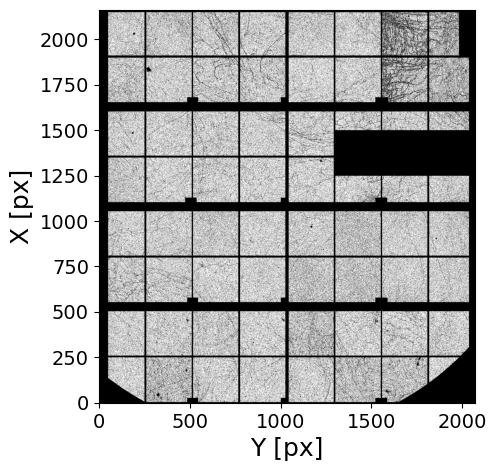

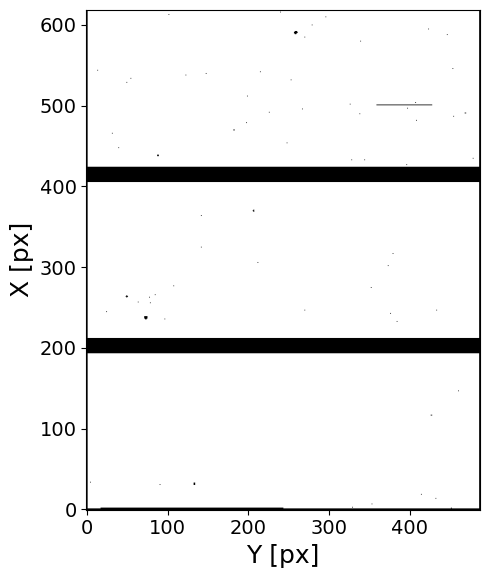

In [3]:
### e4m MASKS
e4m_htmask = np.load(MASKS_folder+'e4m_htmask-GeO2_3_240C_0001_0004'+'.npy')
e4m_mask = np.load(MASKS_folder+'e4m_mask'+'.npy')

plt.figure(figsize=(5, 5))
plt.imshow((e4m_mask*e4m_htmask).reshape(Nx,Ny), cmap='gray', origin='lower')
plt.xlabel('Y [px]')
plt.ylabel('X [px]')
plt.tight_layout(); plt.show()

### pilatus MASKS
pilatus_mask = np.load(MASKS_folder+'pilatus300k_mask_20240201'+'.npy').astype(bool)

plt.figure(figsize=(6, 6))
plt.imshow(~pilatus_mask, cmap='gray', origin='lower')
plt.xlabel('Y [px]')
plt.ylabel('X [px]')
plt.tight_layout(); plt.show()

### Beamstop mask

In [4]:
#######################################
sample_name = 'GeO2_6'
Ndataset = 1
Nscan =12
Nfi, Nff = 0, 1000
#######################################

scan = ID10.load_scan(RAW_folder, sample_name, Ndataset, Nscan)
Ei = scan['monoe']
itime = scan['fast_timer_period'][0]
theta = scan['delcoup']
Q = round(XPCS.theta2Q(Ei,  theta),2)

print('#############################')
print('command =', scan['command'])
print('Ei =', Ei)
print('itime =', itime)
print('theta =', theta)
print('Q =', Q)
print('#############################\n')

e4m_data = ID10.load_sparse_e4m(RAW_folder, sample_name, Ndataset, Nscan, Nfi, Nff,  n_jobs=1, )

#############################
command = mtimescan 0.02 1 220000
Ei = 9.699998837562536
itime = 0.0201
theta = 1.7500000000000004
Q = 0.15
#############################

Loading sparse array ...
	 -> loading file eiger4m_v2_sparse_frame_0_00000.h5 (1/1 loops)
Done! (elapsed time = 0.32 s)
Concatenating vectors ...
Done! (elapsed time = 0.08 s)
	 | Sparse array loaded from ../RAW_DATA/GeO2_6/GeO2_6_0001/scan0012/
	 | Shape:       (1000, 4471016)
	 | Sparsity:     3.8e-03
	 | Memory usage (scipy.csr_array): 0.192 GB (np.array usage: 16.656 GB)


################################################################################
Maximum count in the whole run -> 4689.0
# of pixels above Ith_high treshold ->  23489 pixels (of 4471016 => 0.53 %)
################################################################################



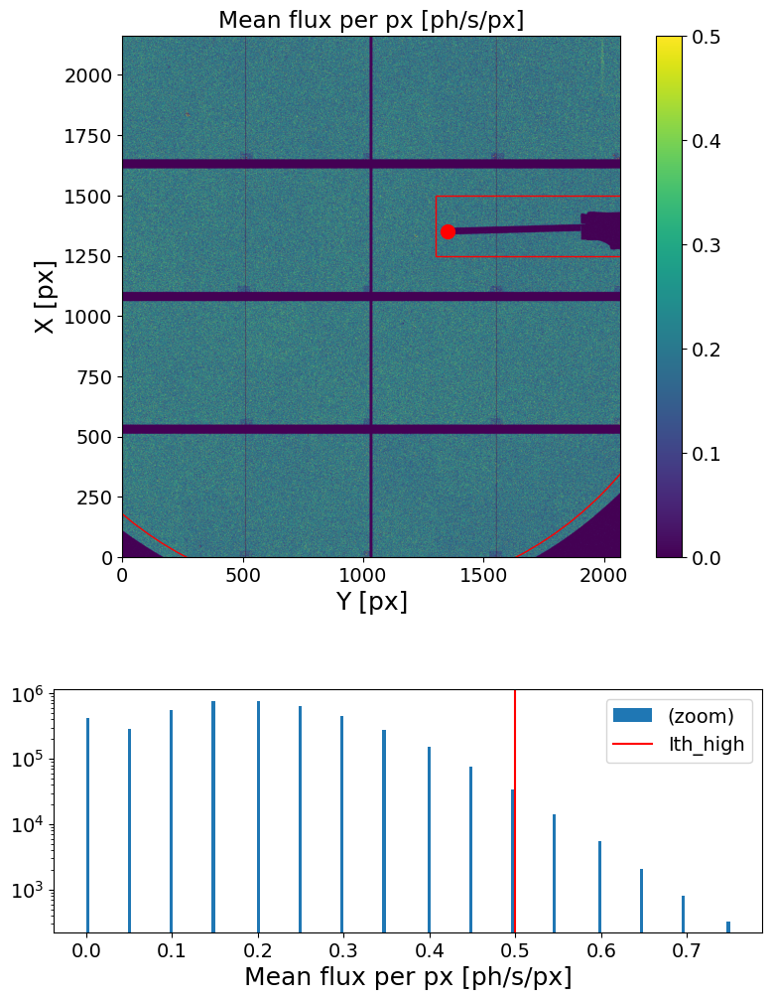

In [5]:
geom = [{'geom':'Rectangle', 'x0':1250, 'y0':1300, 'xl':250, 'yl':1950, 'inside':False},
        {'geom':'Circle', 'Cx':1300, 'Cy':950, 'r':1470, 'inside':True}, 
        ]
XPCS.gen_plots4mask(e4m_data, itime, Ith_high=.5, mask_geom=geom,)

#################################################
Masked area =  93.74594052000708 %
#################################################



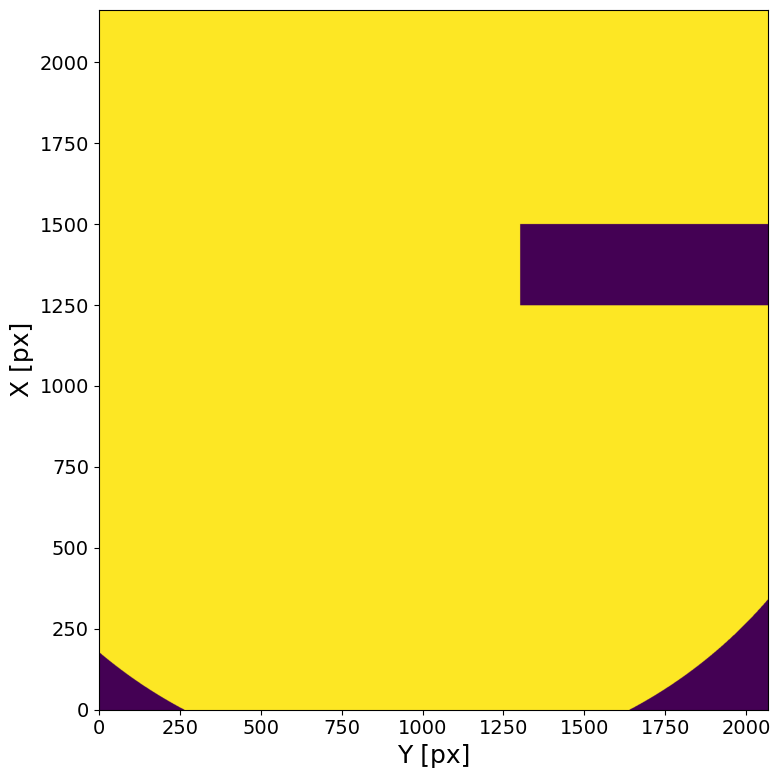

In [6]:
bs_mask = XPCS.gen_mask(mask_geom=geom)

### Q mask

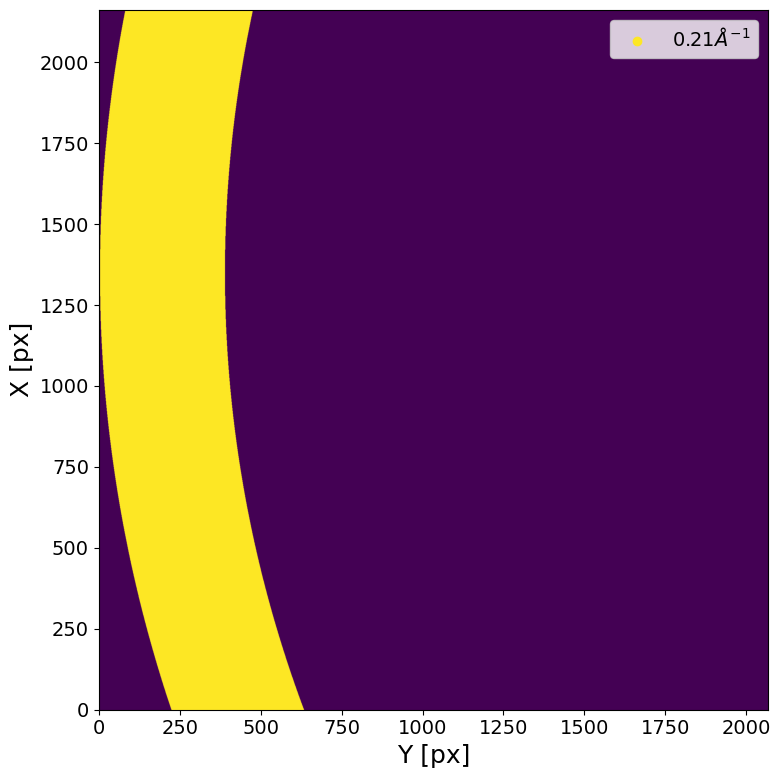

In [7]:
###################
Q_notebook = .21 # [.21, .19, .17, .15, .13]
dQ_notebook = .01 # => Q_width = 2*dQ
###################

Qmask = XPCS.gen_Qmask(Ei, theta, Q_notebook, dQ_notebook, Qmap_plot=False)

# Alligment

## XPCS scan: [Alligment] T=30C, Q=0.19, 3min@200ms (1002fm) (GeO2_6, dataset 1, scan 7)

In [8]:
#######################################
sample_name = 'GeO2_6'
Ndataset = 1
Nscan = 7
Nfi, Nff = 1, None # skip beamstop opening
load_mask = e4m_mask * e4m_htmask * bs_mask * Qmask # Put None for profile analysis!
#######################################

scan = ID10.load_scan(RAW_folder, sample_name, Ndataset, Nscan)
Ei = scan['monoe']
itime = scan['fast_timer_period'][0]
theta = scan['delcoup']
Q = round(XPCS.theta2Q(Ei,  theta),2)

print('#############################')
print('command =', scan['command'])
print('Ei =', Ei)
print('itime =', itime)
print('theta =', theta)
print('Q =', Q)
print('T = {:.2f} min'.format(len(scan['fast_timer_period'])*itime/60))   
print('#############################\n')

e4m_data = ID10.load_sparse_e4m(RAW_folder, sample_name, Ndataset, Nscan, Nfi, Nff,  n_jobs=1, load_mask=load_mask)
e4m_data = COSMIC.fast_gamma_filter(e4m_data, Imaxth_high=4)

#############################
command = mtimescan 0.2 1 1002
Ei = 9.699998837562536
itime = 0.200112
theta = 1.7500000000000004
Q = 0.15
T = 3.34 min
#############################

Loading sparse array ...
	 -> loading file eiger4m_v2_sparse_frame_0_00000.h5 (1/1 loops)
Done! (elapsed time = 5.87 s)
Concatenating vectors ...
Done! (elapsed time = 0.06 s)
	 | Sparse array loaded from ../RAW_DATA/GeO2_6/GeO2_6_0001/scan0007/
	 | Shape:       (1001, 541805)
	 | Sparsity:     3.9e-02
	 | Memory usage (scipy.csr_array): 0.235 GB (np.array usage: 2.020 GB)
Filtering gamma ray signal (i.e. signals over treshold) ...
Done! (elapsed time = 0.09 s)
Removing gamma ray signal (set 0s) ...
Done! (elapsed time = 0.14 s)


### Flux check

################################################################################
Maximum count in the whole run -> 4.0
# of pixels above Ith_high treshold ->  3960529 pixels (of 4471016 => 88.58 %)
# of pixels below Ith_low treshold ->  44405 pixels (of 4471016 => 0.99 %)
################################################################################



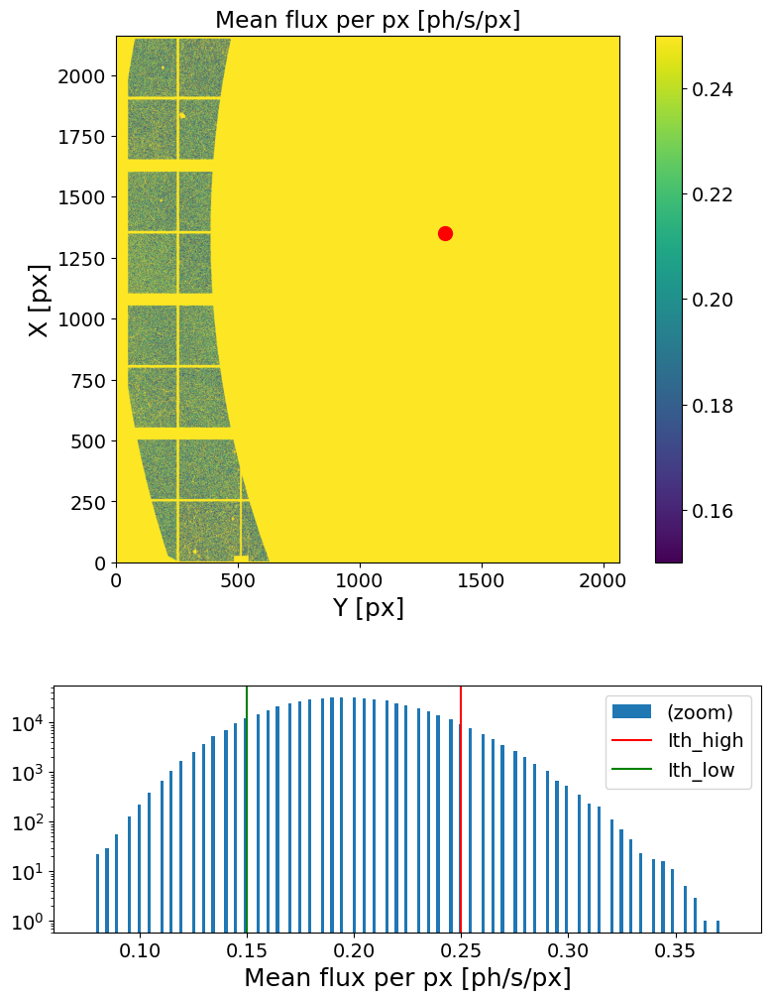

In [9]:
XPCS.gen_plots4mask(e4m_data, itime, Ith_low=.15, Ith_high=.25, Nff=None, load_mask=load_mask)

### Intensity analysis

In [10]:
####################
Lbin = 1
Nstep = 1
mask = None #e4m_mask*e4m_htmask*bs_mask*Qmask
####################

It = np.vstack(XPCS.get_It(e4m_data, itime, mask=mask, Lbin=Lbin, Nstep=Nstep))
#np.savetxt(f"{Intensity_folder}Idt-{sample_name}_{str(Ndataset).zfill(4)}_{str(Nscan).zfill(4)}-Q={Q_notebook}-dQ={dQ_notebook}.txt", It)

<SecondaryAxis: >

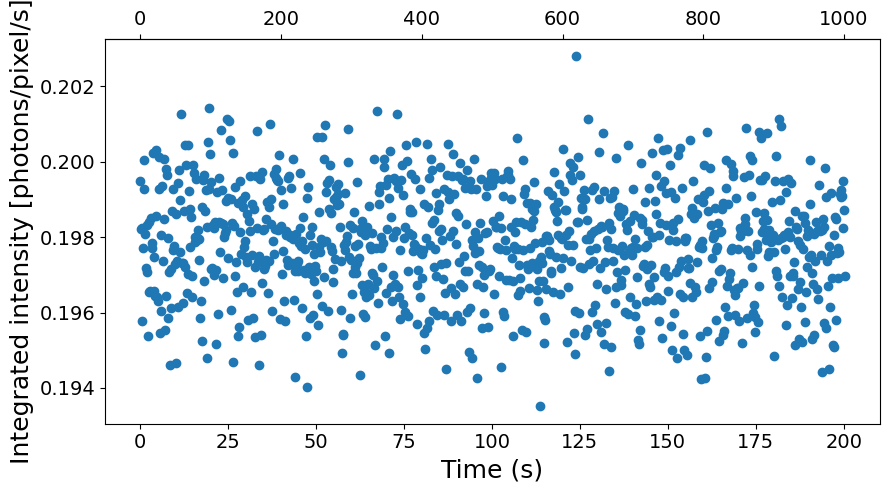

In [11]:
plt.figure(figsize=(10,5))
plt.scatter(It[0], It[1], label='It')
plt.xlabel('Time (s)')
plt.ylabel('Integrated intensity [photons/pixel/s]')
plt.gca().secondary_xaxis('top', functions=(lambda x: x/itime, lambda x: x*itime))

### Linear Correlation by Dose

In [12]:
###################
Nfi = None
Nff = None
Lbin = None
mask = None #e4m_mask * e4m_htmask * bs_mask * Qmask
###################
if Lbin is None: Lbin=1

G2t = XPCS.get_G2t(e4m_data, mask=mask, Nfi=Nfi, Nff=Nff, Lbin=Lbin)

Loading frames ...
Done! (elapsed time = 0.0 s)
Computing G2t (using MKL library)...
Done! (elapsed time = 1.2 s)
	 | 1001 X 1001 squared matrix
	 | memory usage (np.array @ float32) = 0.004 GB
Normalizing G2t (using NumExpr library)...
Done! (elapsed time = 0.02 s)



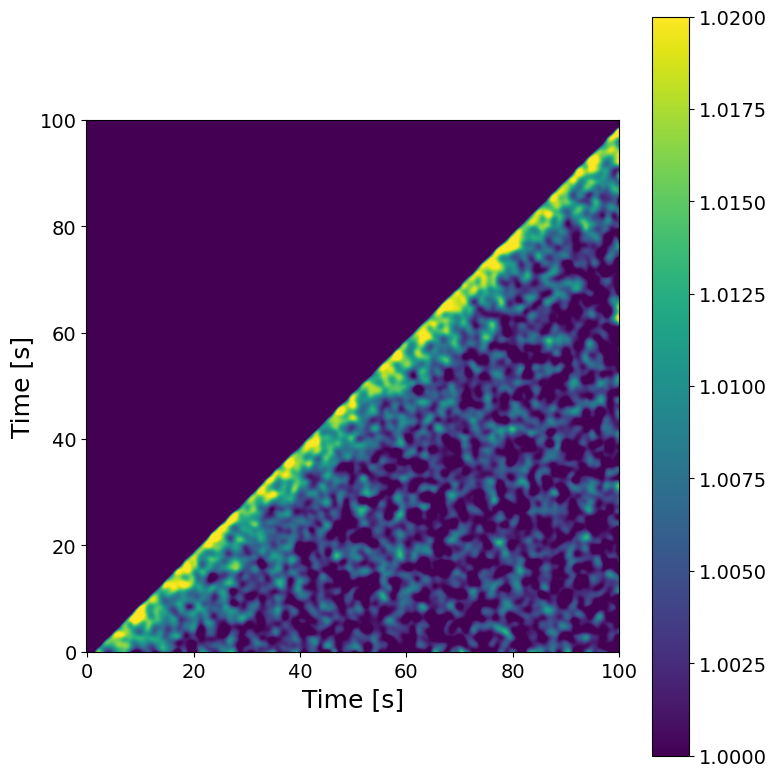

In [13]:
############################
t1, t2 = 0, 100
vmin, vmax = 1.0, 1.02
############################
XPCS.plot_G2t(G2t, vmin, vmax, itime=itime, t1=t1, t2=t2, sigma_filter=3)

In [14]:
################
Nbunch = 1
################

NfXbunch = int(G2t.shape[0]/Nbunch)
g2 = {}
for n in range(Nbunch):
    t_bunch = round(itime*Lbin*NfXbunch*(n+1/2),1)
    g2[t_bunch] = np.vstack(XPCS.get_g2(itime*Lbin, np.array(G2t[NfXbunch*n:NfXbunch*(n+1), NfXbunch*n:NfXbunch*(n+1)])))

Computing g2 (using cython code)...
Done! (elapsed time = 0.01 s)



Using Global variables: Nbunch, model, params, Q_notebook, dQ_notebook, sample_name, Ndataset, Nscan


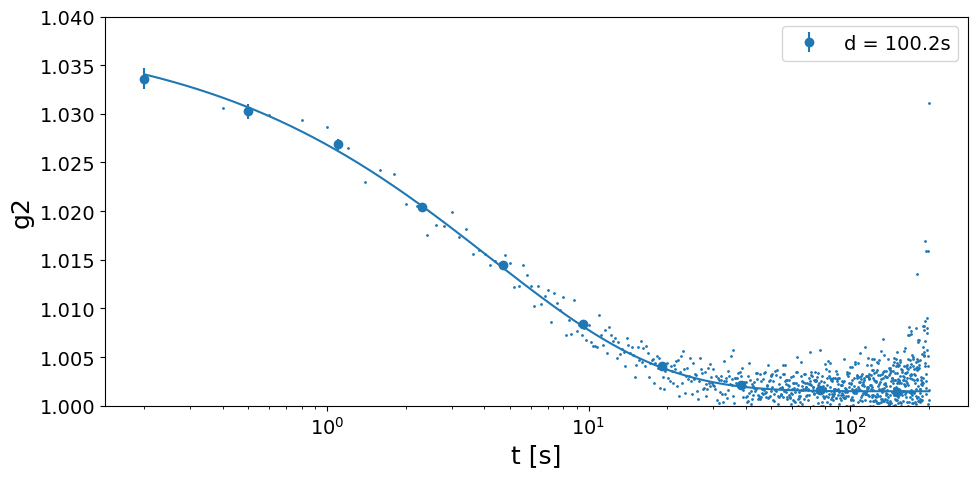

,Q,dQ,tau,dtau,dtau%,beta,dbeta,dbeta%,c,dc,dc%,y0,dy0,dy%,redchi2
tw,,,,,,,,,,,,,,,
100.2,0.21,0.01,4.226936,0.282497,6.683252,0.666421,0.028366,4.256458,0.037122,0.001376,3.706073,1.001495,0.000068,0.00683,1.079747


In [15]:
##################
t1_fit = 0
t2_fit = 1e100
##################

################# KKW MODEL #################
model = lm.Model(decorrelation_f)
params = lm.Parameters()
params.add('tau', value=1, min=0, max=10)
params.add('beta', value=1, min=0, max=2)
params.add('c', value=.03, min=0, max=.1)
params.add('y0', value=1, min=1, max=1.01)
#params.add('y0', value=1.015, vary=False)
##############################################

plotfit_bydose(itime, Lbin, g2, t1_fit, t2_fit)

## XPCS scan: [Alligment] T=30C, Q=0.19, 20min @ 200ms (6000fm) @ damaged point (GeO2_6, dataset 1, scan 8)
Trying to understend the best itime (still didn't know we can go at full spid).

In [16]:
#######################################
sample_name = 'GeO2_6'
Ndataset = 1
Nscan = 8
Nfi, Nff = 1, None
load_mask = e4m_mask * e4m_htmask * bs_mask * Qmask # Put None for profile analysis!
#######################################

scan = ID10.load_scan(RAW_folder, sample_name, Ndataset, Nscan)
Ei = scan['monoe']
itime = scan['fast_timer_period'][0]
theta = scan['delcoup']
Q = round(XPCS.theta2Q(Ei,  theta),2)

print('#############################')
print('command =', scan['command'])
print('Ei =', Ei)
print('itime =', itime)
print('theta =', theta)
print('Q =', Q)
print('T = {:.2f} min'.format(len(scan['fast_timer_period'])*itime/60))   
print('#############################\n')

e4m_data = ID10.load_sparse_e4m(RAW_folder, sample_name, Ndataset, Nscan, Nfi, Nff,  n_jobs=1, load_mask=load_mask)
e4m_data = COSMIC.fast_gamma_filter(e4m_data, Imaxth_high=4)

#############################
command = mtimescan 0.2 1 6000
Ei = 9.699998837562536
itime = 0.200112
theta = 1.7500000000000004
Q = 0.15
T = 20.01 min
#############################

Loading sparse array ...
	 -> loading file eiger4m_v2_sparse_frame_0_00000.h5 (1/2 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00001.h5 (2/2 loops)
Done! (elapsed time = 29.34 s)
Concatenating vectors ...
Done! (elapsed time = 0.45 s)
	 | Sparse array loaded from ../RAW_DATA/GeO2_6/GeO2_6_0001/scan0008/
	 | Shape:       (5999, 541805)
	 | Sparsity:     3.9e-02
	 | Memory usage (scipy.csr_array): 1.407 GB (np.array usage: 12.108 GB)
Filtering gamma ray signal (i.e. signals over treshold) ...
Done! (elapsed time = 0.51 s)
Removing gamma ray signal (set 0s) ...
Done! (elapsed time = 0.8 s)


### Flux check

################################################################################
Maximum count in the whole run -> 4.0
# of pixels above Ith_high treshold ->  3929527 pixels (of 4471016 => 87.89 %)
# of pixels below Ith_low treshold ->  359 pixels (of 4471016 => 0.01 %)
################################################################################



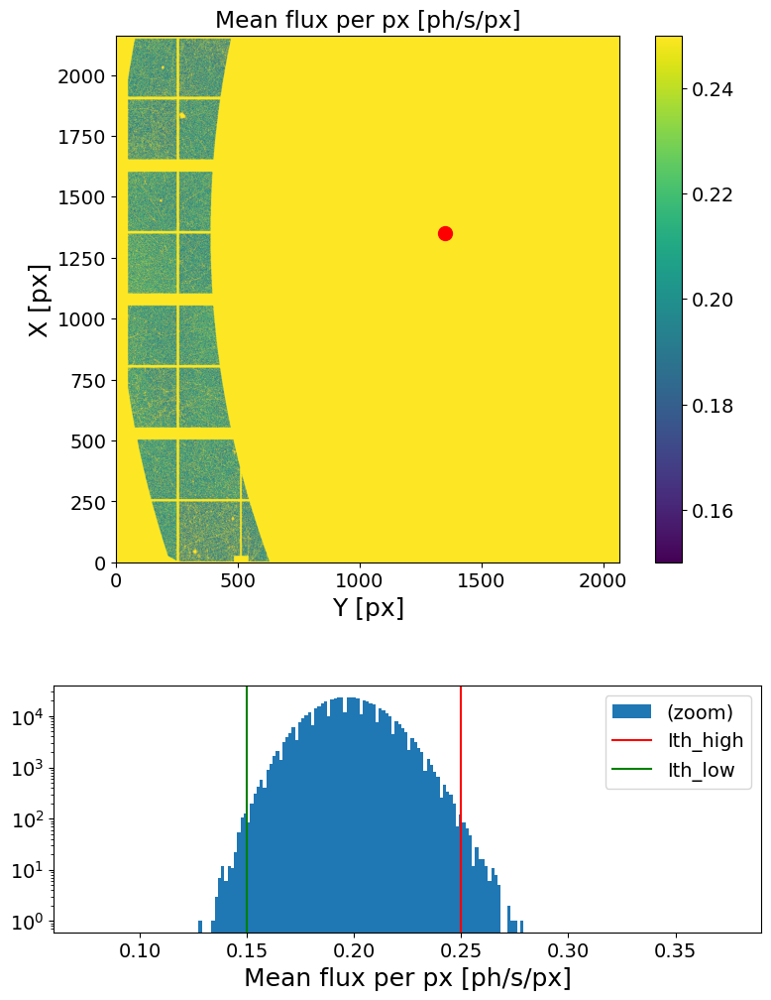

In [17]:
XPCS.gen_plots4mask(e4m_data, itime, Ith_low=.15, Ith_high=.25, Nff=None, load_mask=load_mask)

### Intensity analysis

In [18]:
####################
Lbin = 10
Nstep = 10
mask = None #e4m_mask*e4m_htmask*bs_mask*Qmask
####################

It = np.vstack(XPCS.get_It(e4m_data, itime, mask=mask, Lbin=Lbin, Nstep=Nstep))
#np.savetxt(f"{Intensity_folder}Idt-{sample_name}_{str(Ndataset).zfill(4)}_{str(Nscan).zfill(4)}-Q={Q_notebook}-dQ={dQ_notebook}.txt", It)

<SecondaryAxis: >

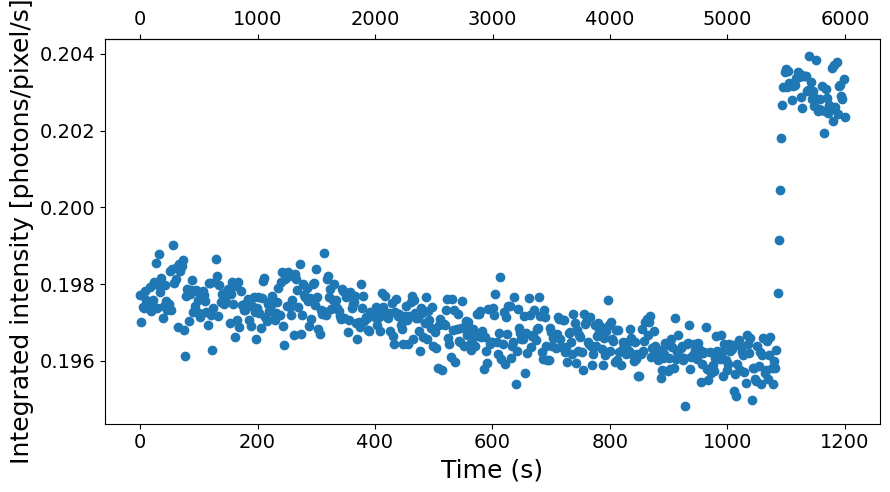

In [19]:
plt.figure(figsize=(10,5))
plt.scatter(It[0], It[1], label='It')
plt.xlabel('Time (s)')
plt.ylabel('Integrated intensity [photons/pixel/s]')
plt.gca().secondary_xaxis('top', functions=(lambda x: x/itime, lambda x: x*itime))

### Linear Correlation by Dose

In [20]:
###################
Nfi = None
Nff = None
Lbin = None
mask = None #e4m_mask * e4m_htmask * bs_mask * Qmask
###################
if Lbin is None: Lbin=1

G2t = XPCS.get_G2t(e4m_data, mask=mask, Nfi=Nfi, Nff=Nff, Lbin=Lbin)

Loading frames ...
Done! (elapsed time = 0.0 s)
Computing G2t (using MKL library)...
Done! (elapsed time = 7.41 s)
	 | 5999 X 5999 squared matrix
	 | memory usage (np.array @ float32) = 0.134 GB
Normalizing G2t (using NumExpr library)...
Done! (elapsed time = 0.05 s)



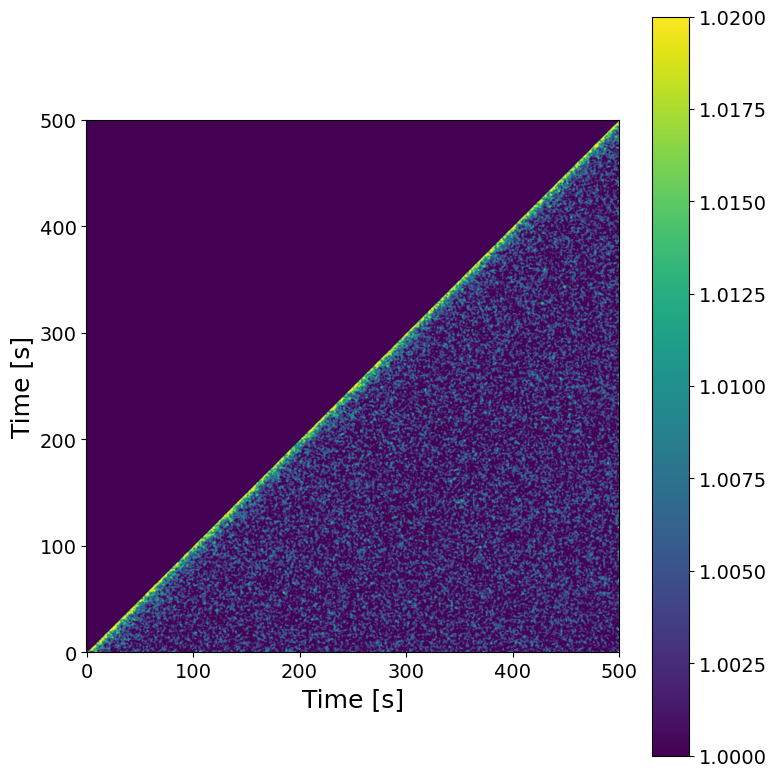

In [21]:
############################
t1, t2 = 0, 500
vmin, vmax = 1.0, 1.02
############################
XPCS.plot_G2t(G2t, vmin, vmax, itime=itime, t1=t1, t2=t2, sigma_filter=3)

In [22]:
################
Nbunch = 3
################

NfXbunch = int(G2t.shape[0]/Nbunch)
g2 = {}
for n in range(Nbunch):
    t_bunch = round(itime*Lbin*NfXbunch*(n+1/2),1)
    g2[t_bunch] = np.vstack(XPCS.get_g2(itime*Lbin, np.array(G2t[NfXbunch*n:NfXbunch*(n+1), NfXbunch*n:NfXbunch*(n+1)])))

Computing g2 (using cython code)...
Done! (elapsed time = 0.01 s)

Computing g2 (using cython code)...
Done! (elapsed time = 0.01 s)

Computing g2 (using cython code)...
Done! (elapsed time = 0.01 s)



Using Global variables: Nbunch, model, params, Q_notebook, dQ_notebook, sample_name, Ndataset, Nscan


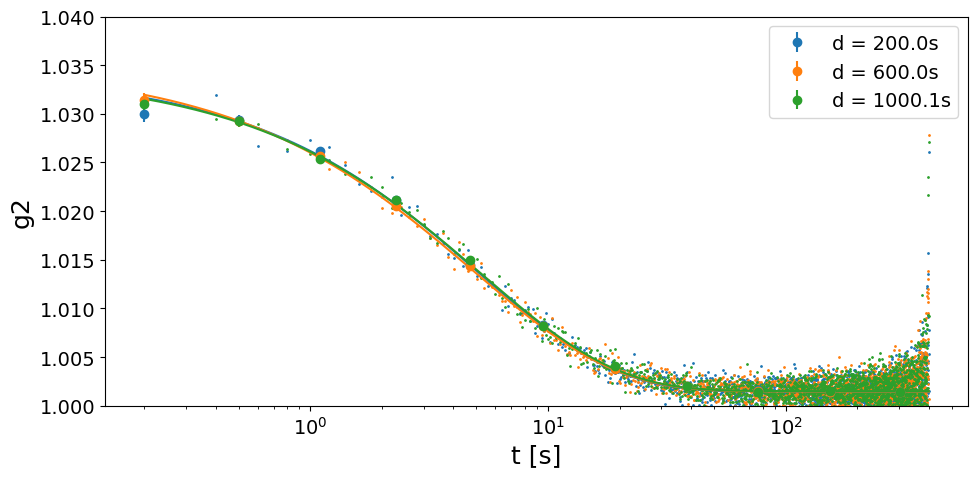

,Q,dQ,tau,dtau,dtau%,beta,dbeta,dbeta%,c,dc,dc%,y0,dy0,dy%,redchi2
tw,,,,,,,,,,,,,,,
200.0,0.21,0.01,5.191738,0.233535,4.498202,0.767419,0.025901,3.375137,0.032757,0.000881,2.689822,1.001483,0.000034,0.003422,1.546900
600.0,0.21,0.01,4.871251,0.194868,4.000361,0.733223,0.020497,2.795460,0.033562,0.000780,2.324920,1.001475,0.000028,0.002812,1.023483
1000.1,0.21,0.01,5.257253,0.213427,4.059666,0.759476,0.022662,2.983892,0.032651,0.000791,2.422889,1.001511,0.000030,0.003004,1.187496


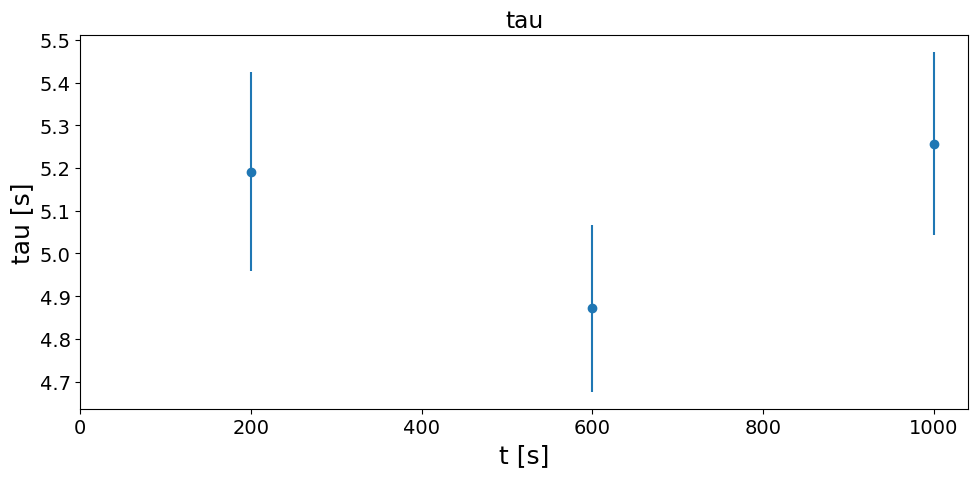

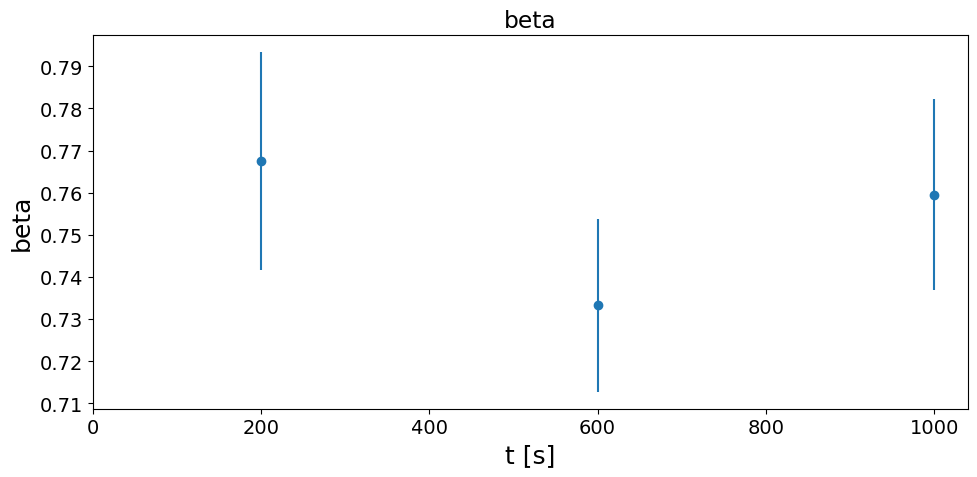

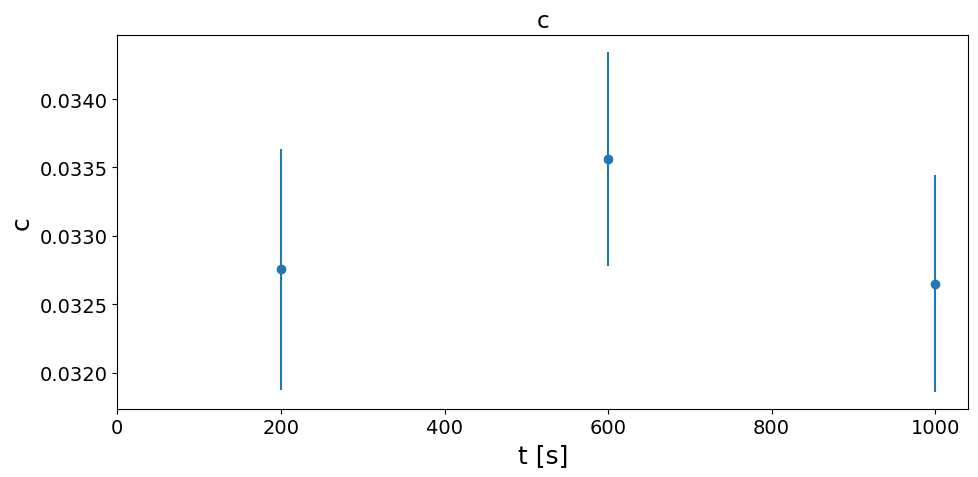

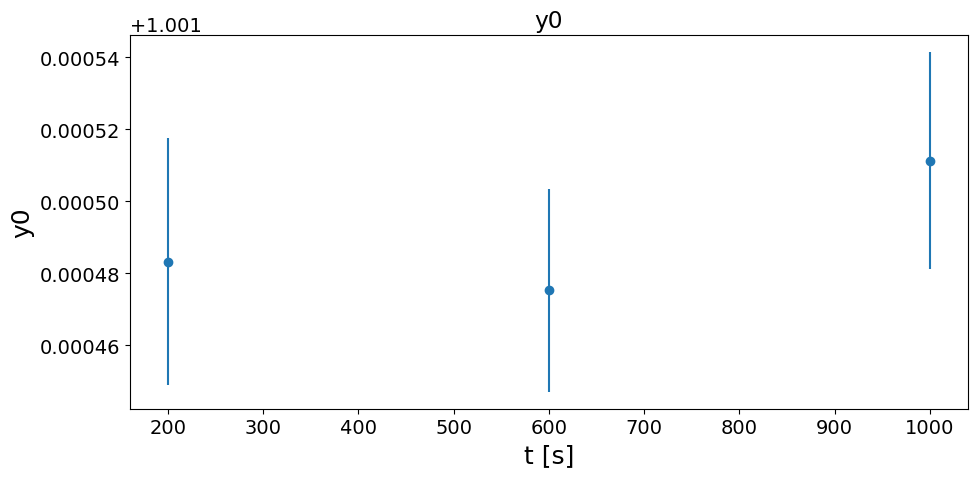

In [23]:
##################
t1_fit = 0
t2_fit = 1e100
##################

################# KKW MODEL #################
model = lm.Model(decorrelation_f)
params = lm.Parameters()
params.add('tau', value=1, min=0, max=10)
params.add('beta', value=1, min=0, max=2)
params.add('c', value=.03, min=0, max=.1)
params.add('y0', value=1, min=1, max=1.01)
#params.add('y0', value=1.015, vary=False)
##############################################

plotfit_bydose(itime, Lbin, g2, t1_fit, t2_fit)

### Linear correlation of damaged-vGeO2

In [24]:
G2t = XPCS.get_G2t(e4m_data, mask=None, Nfi=5000, Nff=None, Lbin=None)

g2 = np.vstack(XPCS.get_g2(itime, G2t))
#np.savetxt(f"{g24damaged_vGeO2_folder}g2-{sample_name}_{str(Ndataset).zfill(4)}_{str(Nscan).zfill(4)}-Q={Q_notebook}-dQ={dQ_notebook}.txt", g2)

Loading frames ...
Done! (elapsed time = 0.11 s)
Computing G2t (using MKL library)...
Done! (elapsed time = 0.94 s)
	 | 999 X 999 squared matrix
	 | memory usage (np.array @ float32) = 0.004 GB
Normalizing G2t (using NumExpr library)...
Done! (elapsed time = 0.01 s)

Computing g2 (using cython code)...
Done! (elapsed time = 0.0 s)



Using Global variables: model, params, Q_notebook, dQ_notebook, sample_name, Ndataset, Nscan


,Q,dQ,tau,dtau,dtau%,beta,dbeta,dbeta%,c,dc,dc%,y0,dy0,dy%,redchi2
0,0.21,0.01,5.015499,0.275974,5.50243,0.739542,0.030106,4.070892,0.033168,0.001092,3.291007,1.00143,0.000063,0.006268,0.983382


/tmp/ipykernel_9137/2737409848.py:19: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()


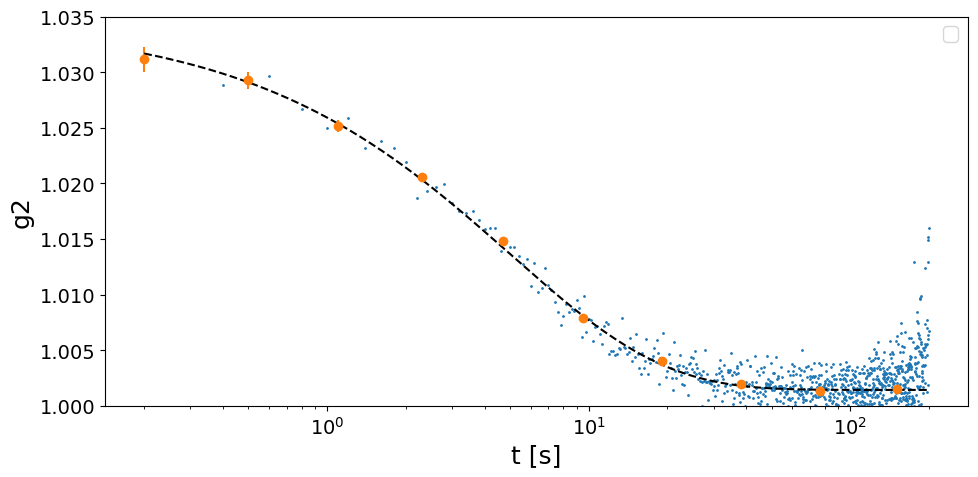

In [25]:
##################
t1_fit = 0
t2_fit = 1e100
##################

################# KKW MODEL #################
model = lm.Model(decorrelation_f)
params = lm.Parameters()
params.add('tau', value=1, min=0, max=10)
params.add('beta', value=1, min=0, max=2)
params.add('c', value=.03, min=0, max=.1)
params.add('y0', value=1, min=1, max=1.01)
#params.add('y0', value=1.015, vary=False)
##############################################

plotfit_4damaged_vGeO2(itime, g2, t1_fit, t2_fit, save=False)

plt.ylim(1, 1.035)
plt.legend()
plt.tight_layout(); plt.show()

# First scans @ room T

## XPCS scan: T=30 C, Q=0.19, 20min @ 20ms ON **damaged point** (GeO2_6, dataset 1, scan 9)

In [26]:
#######################################
sample_name = 'GeO2_6'
Ndataset = 1
Nscan = 9
Nfi, Nff = 1, None
load_mask = e4m_mask * e4m_htmask * bs_mask * Qmask # Put None for profile analysis!
#######################################

scan = ID10.load_scan(RAW_folder, sample_name, Ndataset, Nscan)
Ei = scan['monoe']
itime = scan['fast_timer_period'][0]
theta = scan['delcoup']
Q = round(XPCS.theta2Q(Ei,  theta),2)

print('#############################')
print('command =', scan['command'])
print('Ei =', Ei)
print('itime =', itime)
print('theta =', theta)
print('Q =', Q)
print('T = {:.2f} min'.format(len(scan['fast_timer_period'])*itime/60))   
print('#############################\n')

e4m_data = ID10.load_sparse_e4m(RAW_folder, sample_name, Ndataset, Nscan, Nfi, Nff,  n_jobs=1, load_mask=load_mask)
e4m_data = COSMIC.fast_gamma_filter(e4m_data, Imaxth_high=4)

#############################
command = mtimescan 0.02 1 60000
Ei = 9.699998837562536
itime = 0.020101
theta = 1.7500000000000004
Q = 0.15
T = 20.10 min
#############################

Loading sparse array ...
	 -> loading file eiger4m_v2_sparse_frame_0_00000.h5 (1/12 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00001.h5 (2/12 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00002.h5 (3/12 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00003.h5 (4/12 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00004.h5 (5/12 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00005.h5 (6/12 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00006.h5 (7/12 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00007.h5 (8/12 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00008.h5 (9/12 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00009.h5 (10/12 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00010.h5 (11/12 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00011.h5 (12/12 loo

### Flux check

################################################################################
Maximum count in the whole run -> 4.0
# of pixels above Ith_high treshold ->  3929672 pixels (of 4471016 => 87.89 %)
# of pixels below Ith_low treshold ->  208 pixels (of 4471016 => 0.0 %)
################################################################################



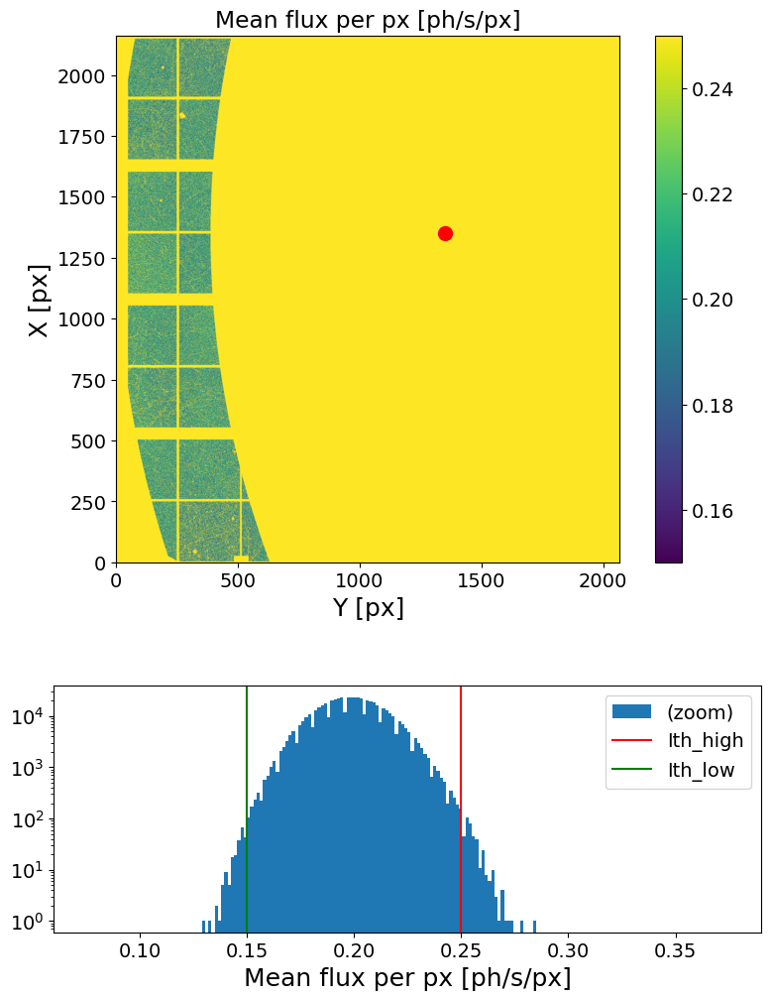

In [27]:
XPCS.gen_plots4mask(e4m_data, itime, Ith_low=.15, Ith_high=.25, Nff=None, load_mask=load_mask)

### Intensity analysis

In [28]:
####################
Lbin = 100
Nstep = 100
mask = None #e4m_mask*e4m_htmask*bs_mask*Qmask
####################

It = np.vstack(XPCS.get_It(e4m_data, itime, mask=mask, Lbin=Lbin, Nstep=Nstep))
np.savetxt(f"{Intensity_folder}Idt-{sample_name}_{str(Ndataset).zfill(4)}_{str(Nscan).zfill(4)}-Q={Q_notebook}-dQ={dQ_notebook}.txt", It)

<SecondaryAxis: >

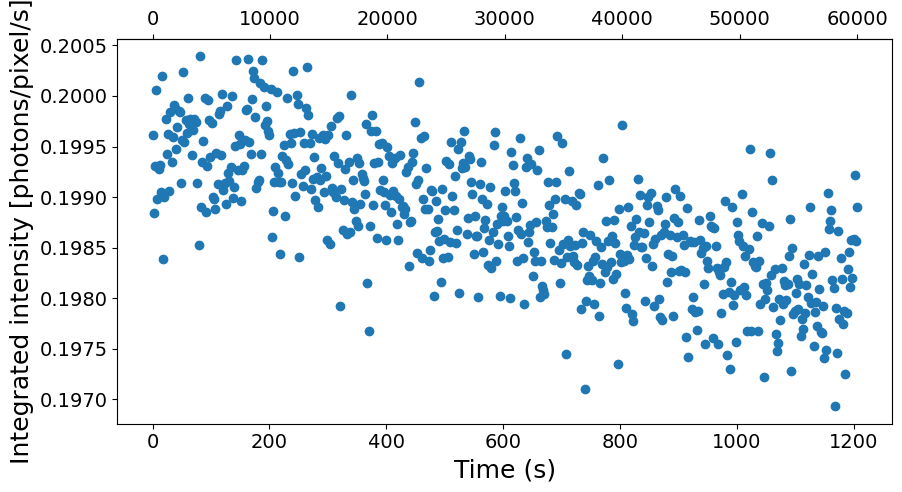

In [29]:
plt.figure(figsize=(10,5))
plt.scatter(It[0], It[1], label='It')
plt.xlabel('Time (s)')
plt.ylabel('Integrated intensity [photons/pixel/s]')
plt.gca().secondary_xaxis('top', functions=(lambda x: x/itime, lambda x: x*itime))

### Linear Correlation by Dose

In [30]:
###################
Nfi = None
Nff = None
Lbin = None
mask = None #e4m_mask * e4m_htmask * bs_mask * Qmask
###################
if Lbin is None: Lbin=1

G2t = XPCS.get_G2t(e4m_data, mask=mask, Nfi=Nfi, Nff=Nff, Lbin=Lbin)

Loading frames ...
Done! (elapsed time = 0.0 s)
Computing G2t (using MKL library)...
Done! (elapsed time = 11.17 s)
	 | 59999 X 59999 squared matrix
	 | memory usage (np.array @ float32) = 13.411 GB
Normalizing G2t (using NumExpr library)...
Done! (elapsed time = 1.66 s)



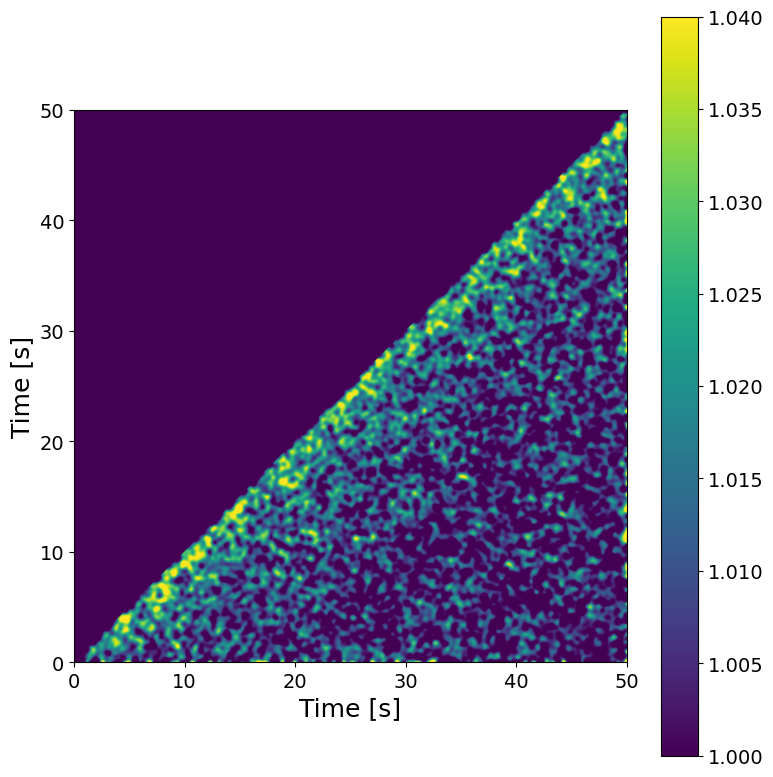

In [31]:
############################
t1, t2 = 0, 50
vmin, vmax = 1.0, 1.04
############################
XPCS.plot_G2t(G2t, vmin, vmax, itime=itime, t1=t1, t2=t2, sigma_filter=10)

In [32]:
################
Nbunch = 3
################

NfXbunch = int(G2t.shape[0]/Nbunch)
g2 = {}
for n in range(Nbunch):
    t_bunch = round(itime*Lbin*NfXbunch*(n+1/2),1)
    g2[t_bunch] = np.vstack(XPCS.get_g2(itime*Lbin, np.array(G2t[NfXbunch*n:NfXbunch*(n+1), NfXbunch*n:NfXbunch*(n+1)])))

Computing g2 (using cython code)...
Done! (elapsed time = 0.33 s)

Computing g2 (using cython code)...
Done! (elapsed time = 0.32 s)

Computing g2 (using cython code)...
Done! (elapsed time = 0.33 s)



Using Global variables: Nbunch, model, params, Q_notebook, dQ_notebook, sample_name, Ndataset, Nscan


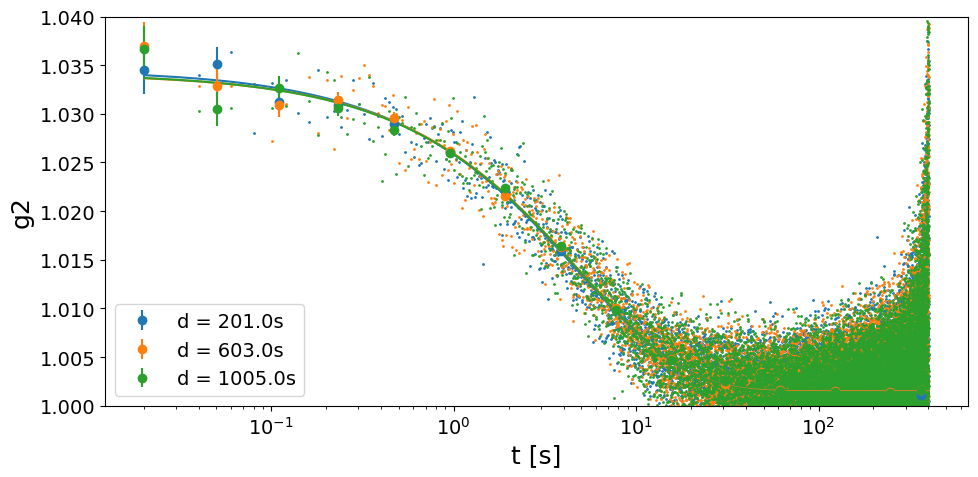

,Q,dQ,tau,dtau,dtau%,beta,dbeta,dbeta%,c,dc,dc%,y0,dy0,dy%,redchi2
tw,,,,,,,,,,,,,,,
201.0,0.21,0.01,4.930114,0.170345,3.455189,0.743866,0.018786,2.525397,0.033054,0.000658,1.992004,1.001465,0.000027,0.002709,0.994477
603.0,0.21,0.01,5.088581,0.169896,3.338762,0.760232,0.019164,2.520828,0.032649,0.000638,1.953062,1.001489,0.000027,0.002704,0.990619
1005.0,0.21,0.01,5.102765,0.174545,3.420602,0.751739,0.019106,2.541634,0.032779,0.000651,1.986325,1.001411,0.000028,0.002750,1.011540


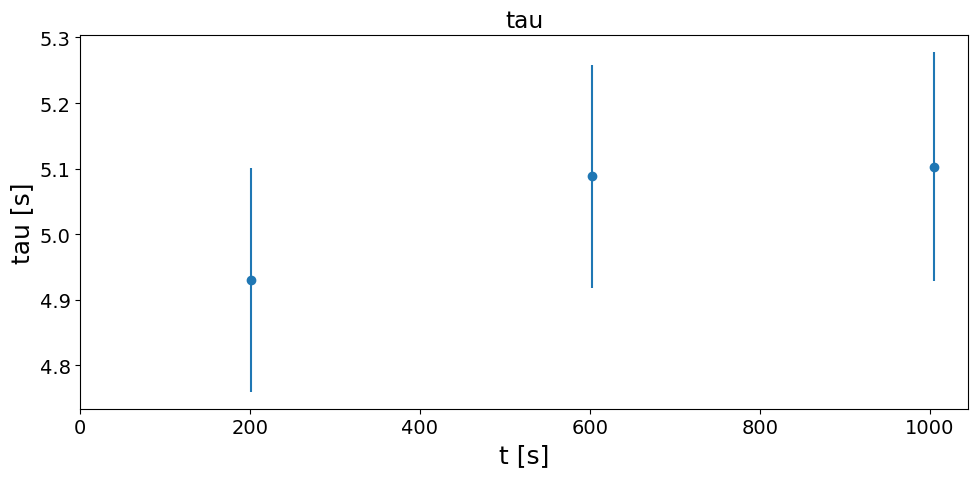

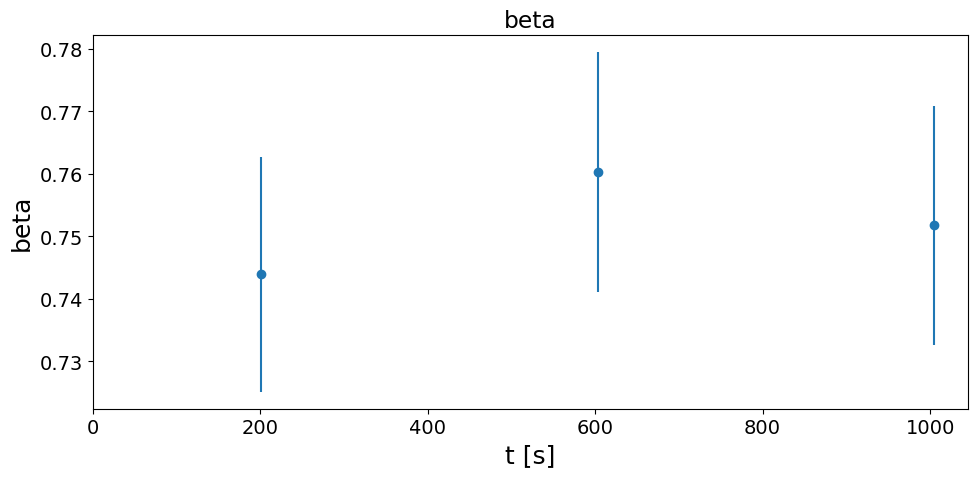

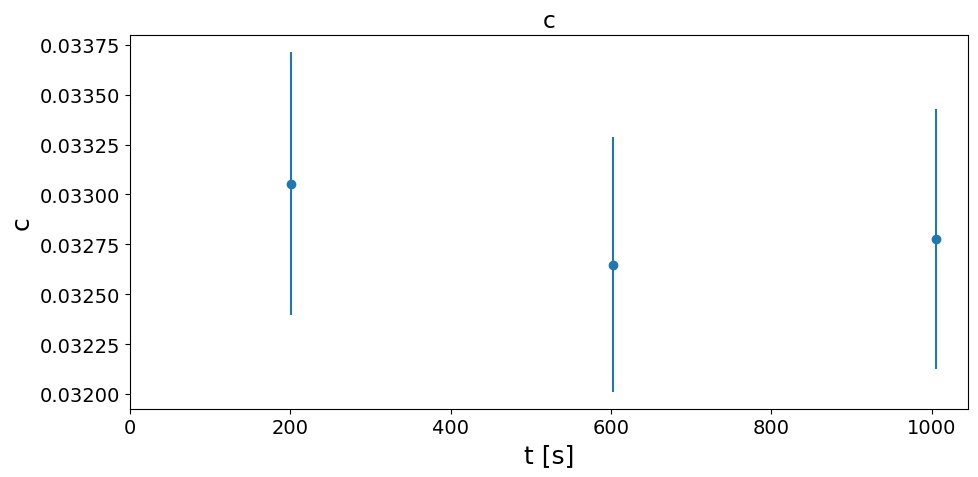

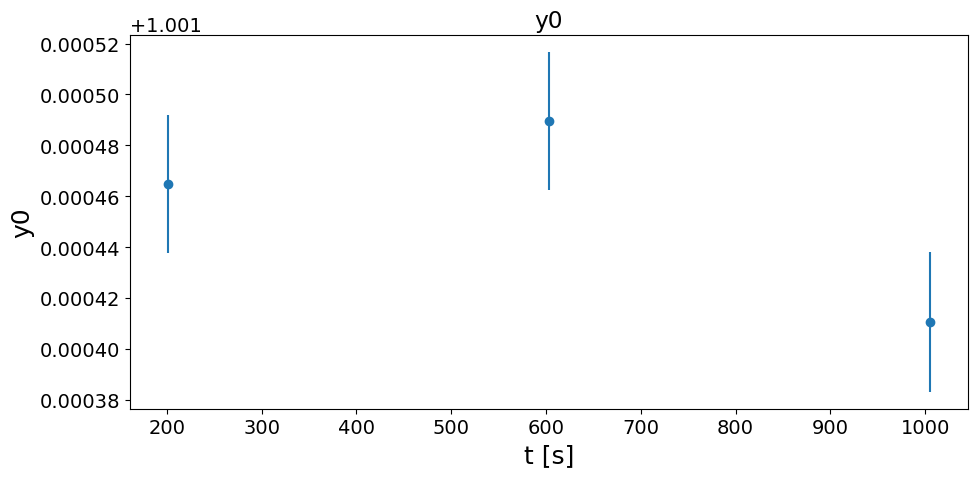

In [33]:
##################
t1_fit = 0
t2_fit = 1e100
##################

################# KKW MODEL #################
model = lm.Model(decorrelation_f)
params = lm.Parameters()
params.add('tau', value=1, min=0, max=10)
params.add('beta', value=1, min=0, max=2)
params.add('c', value=.03, min=0, max=.1)
params.add('y0', value=1, min=1, max=1.01)
#params.add('y0', value=1.015, vary=False)
##############################################

plotfit_bydose(itime, Lbin, g2, t1_fit, t2_fit)

### Linear correlation of damaged-vGeO2

In [34]:
G2t = XPCS.get_G2t(e4m_data, mask=None, Nfi=None, Nff=None, Lbin=None)

g2 = np.vstack(XPCS.get_g2(itime, G2t))
np.savetxt(f"{g24damaged_vGeO2_folder}g2-{sample_name}_{str(Ndataset).zfill(4)}_{str(Nscan).zfill(4)}-Q={Q_notebook}-dQ={dQ_notebook}.txt", g2)

Loading frames ...
Done! (elapsed time = 0.0 s)
Computing G2t (using MKL library)...
Done! (elapsed time = 11.28 s)
	 | 59999 X 59999 squared matrix
	 | memory usage (np.array @ float32) = 13.411 GB
Normalizing G2t (using NumExpr library)...
Done! (elapsed time = 1.73 s)

Computing g2 (using cython code)...
Done! (elapsed time = 3.25 s)



Using Global variables: model, params, Q_notebook, dQ_notebook, sample_name, Ndataset, Nscan


,Q,dQ,tau,dtau,dtau%,beta,dbeta,dbeta%,c,dc,dc%,y0,dy0,dy%,redchi2
0,0.21,0.01,5.006553,0.099427,1.98594,0.740447,0.010391,1.40329,0.033109,0.000374,1.130309,1.001403,0.000008,0.000836,0.998513


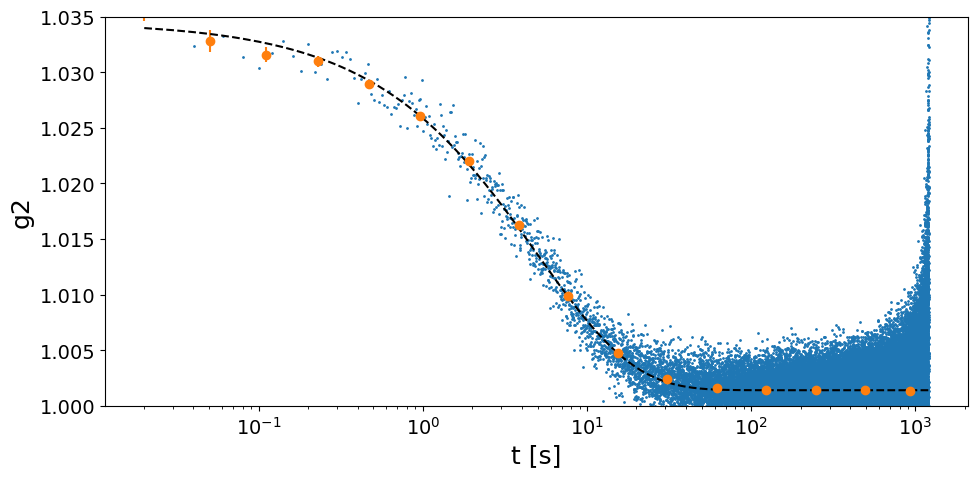

In [35]:
##################
t1_fit = 0
t2_fit = 1e100
##################

################# KKW MODEL #################
model = lm.Model(decorrelation_f)
params = lm.Parameters()
params.add('tau', value=1, min=0, max=10)
params.add('beta', value=1, min=0, max=2)
params.add('c', value=.03, min=0, max=.1)
params.add('y0', value=1, min=1, max=1.01)
#params.add('y0', value=1.015, vary=False)
##############################################

plotfit_4damaged_vGeO2(itime, g2, t1_fit, t2_fit)

plt.ylim(1, 1.035)
plt.tight_layout(); plt.show()

## XPCS scan: [Test on fresh p] T=30C, Q=0.19, 5min @ 20ms ON **fresh point** (GeO2_6, dataset 1, scan 11)
Test for going down in itime (still didn't know we can go at full spid)...

In [36]:
#######################################
sample_name = 'GeO2_6'
Ndataset = 1
Nscan =11
Nfi, Nff = 1, None
mask = e4m_mask * e4m_htmask * bs_mask * Qmask # Put None for profile analysis!
#######################################

scan = ID10.load_scan(RAW_folder, sample_name, Ndataset, Nscan)
Ei = scan['monoe']
itime = scan['fast_timer_period'][0]
theta = scan['delcoup']
Q = round(XPCS.theta2Q(Ei,  theta),2)

print('#############################')
print('command =', scan['command'])
print('Ei =', Ei)
print('itime =', itime)
print('theta =', theta)
print('Q =', Q)
print('T = {:.2f} min'.format(len(scan['fast_timer_period'])*itime/60))   
print('#############################\n')

e4m_data = ID10.load_sparse_e4m(RAW_folder, sample_name, Ndataset, Nscan, Nfi, Nff,  n_jobs=1, load_mask=load_mask)
e4m_data = COSMIC.fast_gamma_filter(e4m_data, Imaxth_high=4)

#############################
command = mtimescan 0.02 1 15000
Ei = 9.699998837562536
itime = 0.020101
theta = 1.7500000000000004
Q = 0.15
T = 5.03 min
#############################

Loading sparse array ...
	 -> loading file eiger4m_v2_sparse_frame_0_00000.h5 (1/3 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00001.h5 (2/3 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00002.h5 (3/3 loops)
Done! (elapsed time = 10.99 s)
Concatenating vectors ...
Done! (elapsed time = 0.12 s)
	 | Sparse array loaded from ../RAW_DATA/GeO2_6/GeO2_6_0001/scan0011/
	 | Shape:       (14999, 541805)
	 | Sparsity:     4.1e-03
	 | Memory usage (scipy.csr_array): 0.369 GB (np.array usage: 30.274 GB)
Filtering gamma ray signal (i.e. signals over treshold) ...
Done! (elapsed time = 0.1 s)
Removing gamma ray signal (set 0s) ...
Done! (elapsed time = 0.21 s)


### Flux check

In [37]:
#XPCS.gen_plots4mask(e4m_data, itime, Ith_low=.15, Ith_high=.25, Nff=None, load_mask=load_mask)

### Intensity analysis

In [38]:
####################
Lbin = 10
Nstep = 10
mask = None #e4m_mask*e4m_htmask*bs_mask*Qmask
####################

It = np.vstack(XPCS.get_It(e4m_data, itime, mask=mask, Lbin=Lbin, Nstep=Nstep))
np.savetxt(f"{Intensity_folder}Idt-{sample_name}_{str(Ndataset).zfill(4)}_{str(Nscan).zfill(4)}-Q={Q_notebook}-dQ={dQ_notebook}.txt", It)

<SecondaryAxis: >

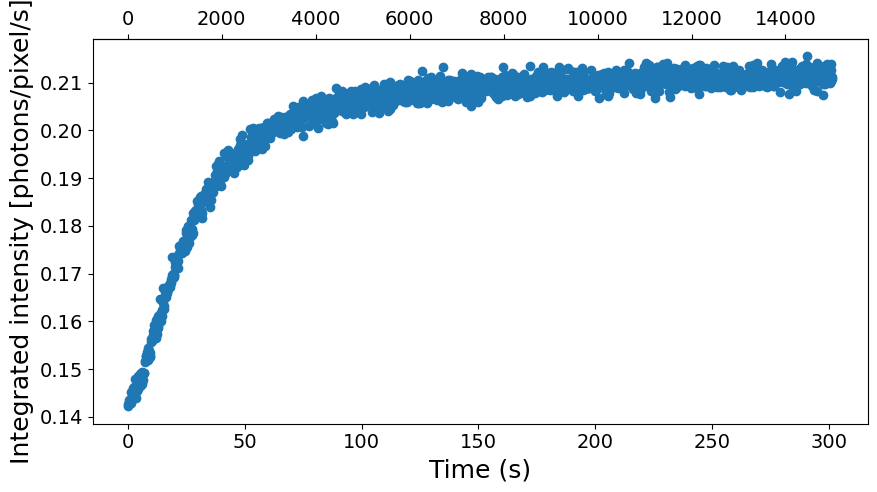

In [39]:
plt.figure(figsize=(10,5))
plt.scatter(It[0], It[1], label='It')
plt.xlabel('Time (s)')
plt.ylabel('Integrated intensity [photons/pixel/s]')
plt.gca().secondary_xaxis('top', functions=(lambda x: x/itime, lambda x: x*itime))

### Linear Correlation by Dose

In [40]:
###################
Nfi = None
Nff = None
Lbin = None
mask = None #e4m_mask * e4m_htmask * bs_mask * Qmask
###################
if Lbin is None: Lbin=1

G2t = XPCS.get_G2t(e4m_data, mask=mask, Nfi=Nfi, Nff=Nff, Lbin=Lbin)

Loading frames ...
Done! (elapsed time = 0.0 s)
Computing G2t (using MKL library)...
Done! (elapsed time = 1.86 s)
	 | 14999 X 14999 squared matrix
	 | memory usage (np.array @ float32) = 0.838 GB
Normalizing G2t (using NumExpr library)...
Done! (elapsed time = 0.19 s)



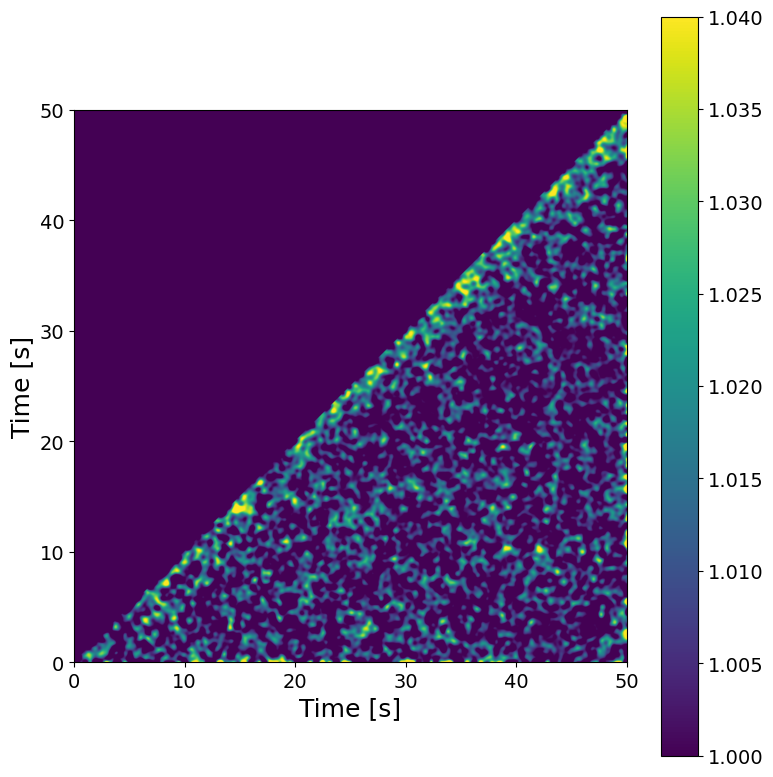

In [41]:
############################
t1, t2 = 0, 50
vmin, vmax = 1.0, 1.04
############################
XPCS.plot_G2t(G2t, vmin, vmax, itime=itime, t1=t1, t2=t2, sigma_filter=10)

In [42]:
################
Nbunch = 4
################

NfXbunch = int(G2t.shape[0]/Nbunch)
g2 = {}
for n in range(Nbunch):
    t_bunch = round(itime*Lbin*NfXbunch*(n+1/2),1)
    g2[t_bunch] = np.vstack(XPCS.get_g2(itime*Lbin, np.array(G2t[NfXbunch*n:NfXbunch*(n+1), NfXbunch*n:NfXbunch*(n+1)])))

Computing g2 (using cython code)...
Done! (elapsed time = 0.04 s)

Computing g2 (using cython code)...
Done! (elapsed time = 0.02 s)

Computing g2 (using cython code)...
Done! (elapsed time = 0.02 s)

Computing g2 (using cython code)...
Done! (elapsed time = 0.01 s)



Using Global variables: Nbunch, model, params, Q_notebook, dQ_notebook, sample_name, Ndataset, Nscan


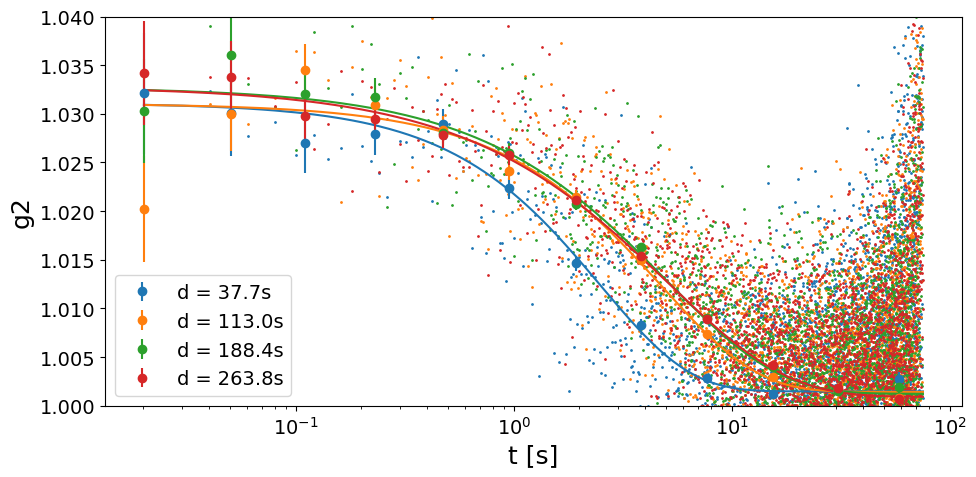

,Q,dQ,tau,dtau,dtau%,beta,dbeta,dbeta%,c,dc,dc%,y0,dy0,dy%,redchi2
tw,,,,,,,,,,,,,,,
37.7,0.21,0.01,2.497274,0.215434,8.626763,1.060686,0.114394,10.784880,0.029623,0.001895,6.395505,1.001481,0.000169,0.016882,1.036514
113.0,0.21,0.01,4.754776,0.295618,6.217289,0.984431,0.074018,7.518865,0.029620,0.001347,4.546104,1.001427,0.000187,0.018699,1.087493
188.4,0.21,0.01,5.049870,0.334565,6.625211,0.849884,0.059068,6.950116,0.031504,0.001433,4.549638,1.001231,0.000212,0.021148,0.996847
263.8,0.21,0.01,5.088833,0.369453,7.260083,0.791789,0.056730,7.164760,0.031901,0.001551,4.860336,1.000918,0.000235,0.023500,1.001848


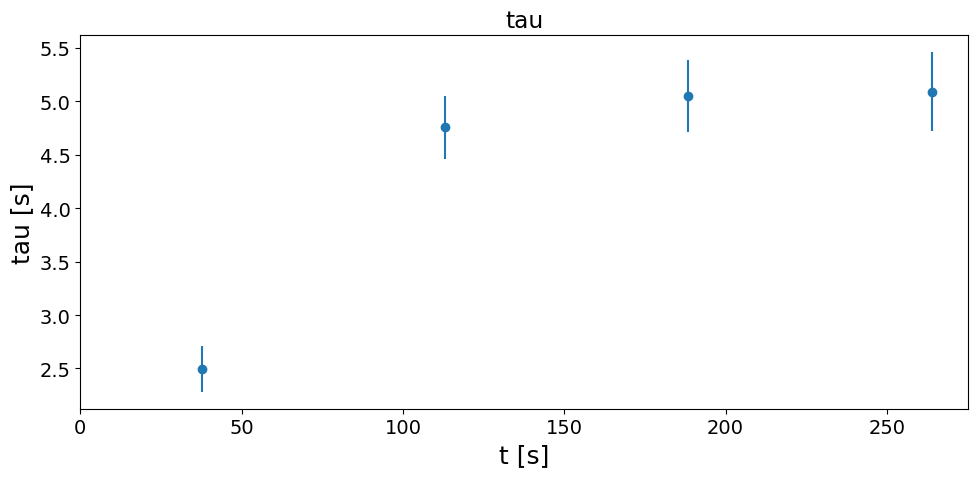

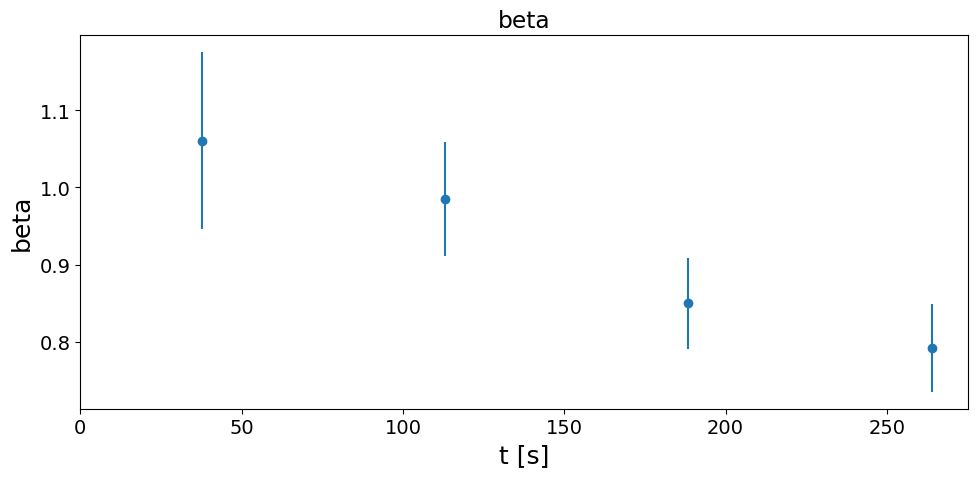

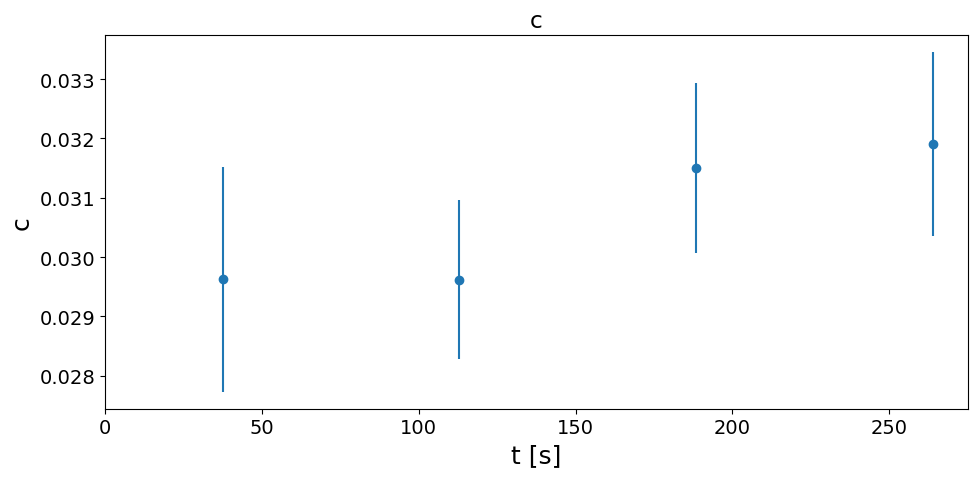

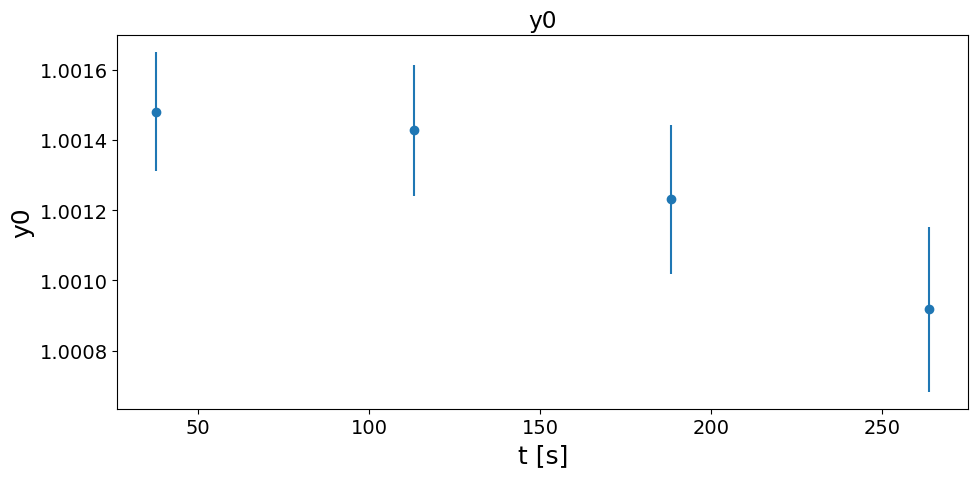

In [43]:
##################
t1_fit = 0
t2_fit = 1e100
##################

################# KKW MODEL #################
model = lm.Model(decorrelation_f)
params = lm.Parameters()
params.add('tau', value=1, min=0, max=10)
params.add('beta', value=1, min=0, max=2)
params.add('c', value=.03, min=0, max=.1)
params.add('y0', value=1, min=1, max=1.01)
#params.add('y0', value=1.015, vary=False)
##############################################

plotfit_bydose(itime, Lbin, g2, t1_fit, t2_fit)

# Temperature ramp

## XPCS scan: T=30C, Q=0.19, 75min @ 20ms ON damaged point (GeO2_6, dataset 1, scan 12)
Start the Temperature ramp!

In [44]:
#######################################
sample_name = 'GeO2_6'
Ndataset = 1
Nscan =12
Nfi, Nff = 1, None
load_mask = e4m_mask * e4m_htmask * bs_mask * Qmask # Put None for profile analysis!
#######################################

scan = ID10.load_scan(RAW_folder, sample_name, Ndataset, Nscan)
Ei = scan['monoe']
itime = scan['fast_timer_period'][0]
theta = scan['delcoup']
Q = round(XPCS.theta2Q(Ei,  theta),2)

print('#############################')
print('command =', scan['command'])
print('Ei =', Ei)
print('itime =', itime)
print('theta =', theta)
print('Q =', Q)
print('T = {:.2f} min'.format(len(scan['fast_timer_period'])*itime/60))   
print('#############################\n')

e4m_data = ID10.load_sparse_e4m(RAW_folder, sample_name, Ndataset, Nscan, Nfi, Nff,  n_jobs=20, load_mask=load_mask)
e4m_data = COSMIC.fast_gamma_filter(e4m_data, Imaxth_high=4)

#############################
command = mtimescan 0.02 1 220000
Ei = 9.699998837562536
itime = 0.0201
theta = 1.7500000000000004
Q = 0.15
T = 73.70 min
#############################

Loading sparse array ...
	 -> loading file eiger4m_v2_sparse_frame_0_00007.h5 (8/44 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00003.h5 (4/44 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00013.h5 (14/44 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00005.h5 (6/44 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00006.h5 (7/44 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00004.h5 (5/44 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00008.h5 (9/44 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00011.h5 (12/44 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00009.h5 (10/44 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00000.h5 (1/44 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00012.h5 (13/44 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00010.h5 (11/44 lo

### Flux check

################################################################################
Maximum count in the whole run -> 4.0
# of pixels above Ith_high treshold ->  3930719 pixels (of 4471016 => 87.92 %)
# of pixels below Ith_low treshold ->  0 pixels (of 4471016 => 0.0 %)
################################################################################



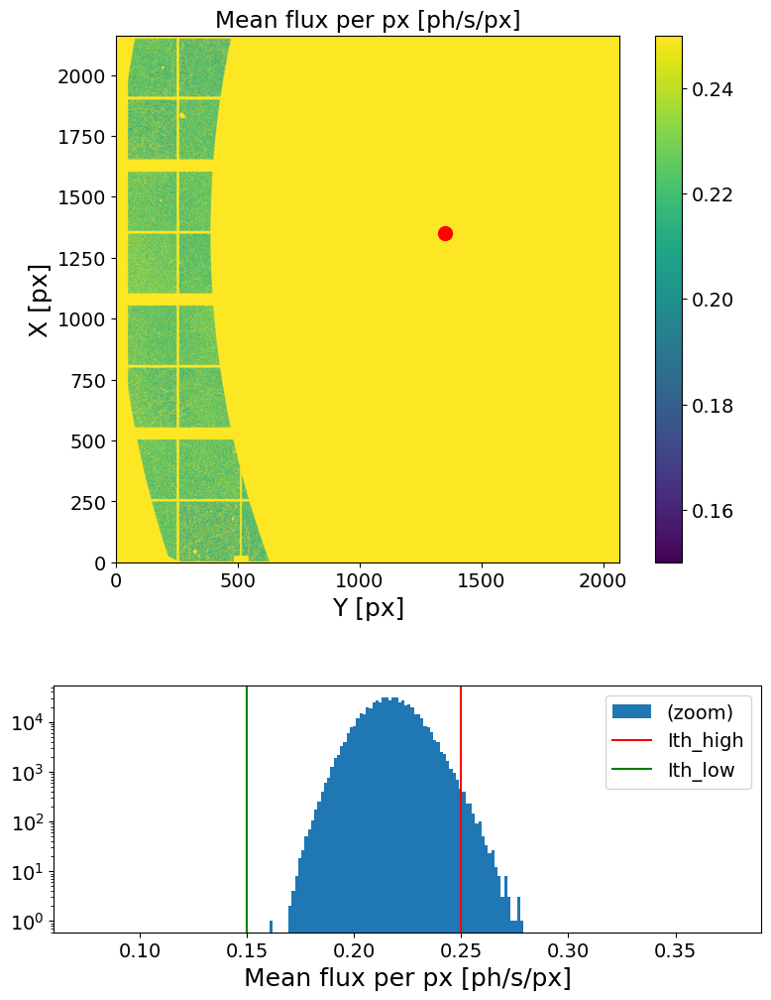

In [45]:
XPCS.gen_plots4mask(e4m_data, itime, Ith_low=.15, Ith_high=.25, Nff=None, load_mask=load_mask)

### Intensity analysis

In [46]:
####################
Lbin = 100
Nstep = 100
mask = None #e4m_mask*e4m_htmask*bs_mask*Qmask
####################

It = np.vstack(XPCS.get_It(e4m_data, itime, mask=mask, Lbin=Lbin, Nstep=Nstep))
np.savetxt(f"{Intensity_folder}Idt-{sample_name}_{str(Ndataset).zfill(4)}_{str(Nscan).zfill(4)}-Q={Q_notebook}-dQ={dQ_notebook}.txt", It)

<SecondaryAxis: >

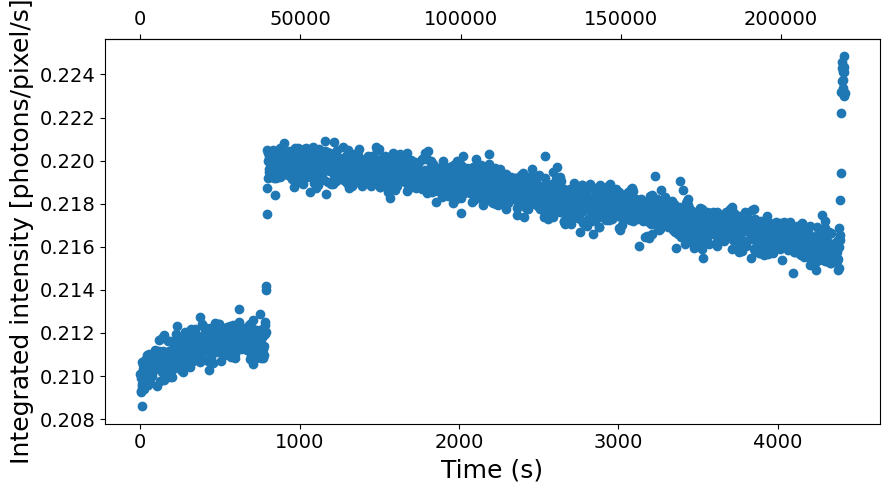

In [47]:
plt.figure(figsize=(10,5))
plt.scatter(It[0], It[1], label='It')
plt.xlabel('Time (s)')
plt.ylabel('Integrated intensity [photons/pixel/s]')
plt.gca().secondary_xaxis('top', functions=(lambda x: x/itime, lambda x: x*itime))
#plt.xlim(0, 3000)

### Linear Correlation by Dose

In [48]:
###################
Nfi = None
Nff = 50_000
Lbin = 1
###################

G2t = XPCS.get_G2t(e4m_data, mask=mask, Nfi=None, Nff=50_000, Lbin=Lbin)

Loading frames ...
Done! (elapsed time = 1.11 s)
Computing G2t (using MKL library)...
Done! (elapsed time = 9.65 s)
	 | 50000 X 50000 squared matrix
	 | memory usage (np.array @ float32) = 9.313 GB
Normalizing G2t (using NumExpr library)...
Done! (elapsed time = 1.19 s)



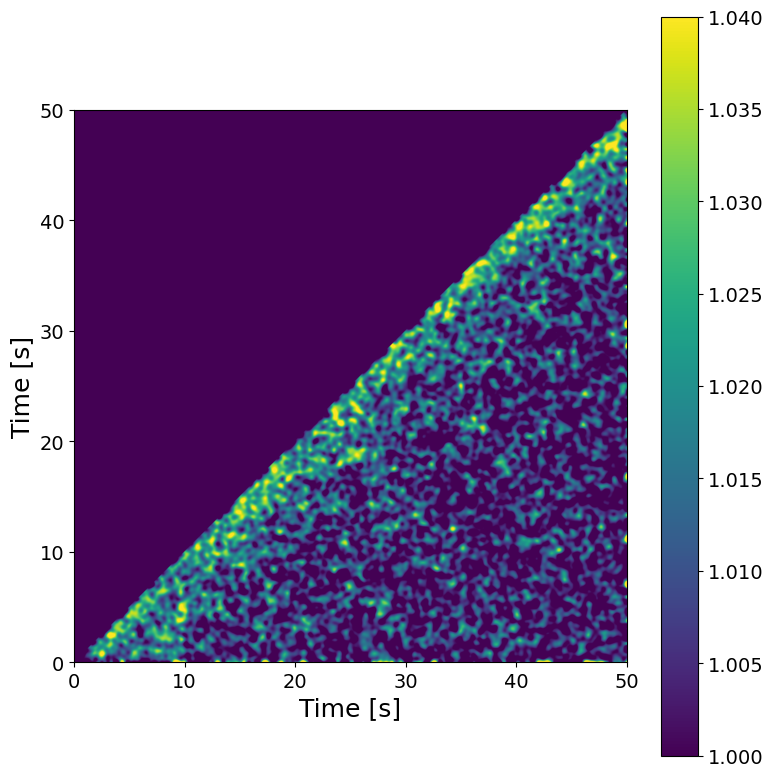

In [49]:
############################
t1, t2 = 0, 50
vmin, vmax = 1.0, 1.04
############################
XPCS.plot_G2t(G2t, vmin, vmax, itime=itime*Lbin, t1=t1, t2=t2, sigma_filter=10)

In [50]:
################
Nbunch = 16
################

g2 = {}
if Lbin is None: Lbin=1
NfXbunch = int(G2t.shape[0]/Nbunch)
for n in tqdm(range(Nbunch)):
    with redirect_stdout(io.StringIO()):
        t_bunch = round(itime*Lbin*NfXbunch*(n+1/2),1)
        g2[t_bunch] = np.vstack( XPCS.get_g2(itime*Lbin, np.array(G2t[NfXbunch*n:NfXbunch*(n+1), NfXbunch*n:NfXbunch*(n+1)])) )

100%|██████████| 16/16 [00:00<00:00, 52.98it/s]


Using Global variables: Nbunch, model, params, Q_notebook, dQ_notebook, sample_name, Ndataset, Nscan


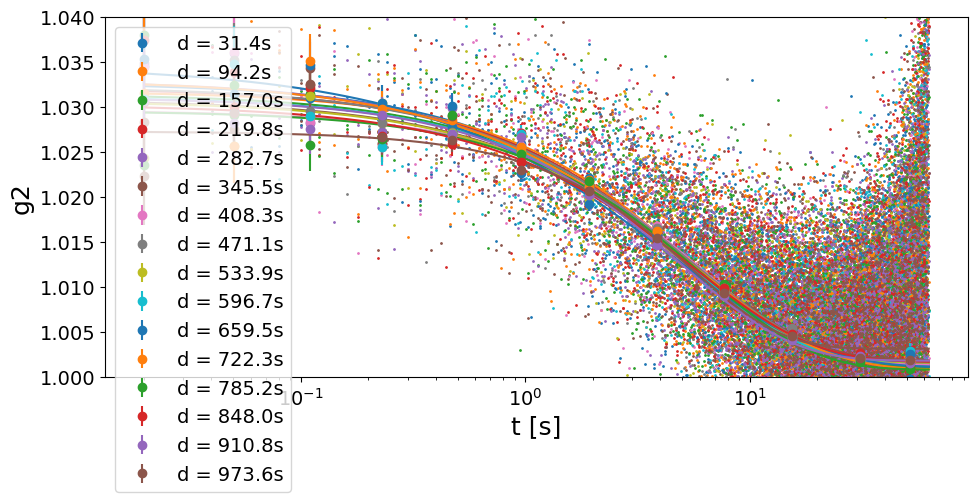

,Q,dQ,tau,dtau,dtau%,beta,dbeta,dbeta%,c,dc,dc%,y0,dy0,dy%,redchi2
tw,,,,,,,,,,,,,,,
31.4,0.21,0.01,5.252200,0.411107,7.827323,0.800033,0.067098,8.386893,0.031368,0.001730,5.515693,1.001305,0.000328,0.032801,0.982828
94.2,0.21,0.01,5.493485,0.402951,7.335062,0.865945,0.073040,8.434720,0.030113,0.001605,5.329446,1.001608,0.000307,0.030681,1.055431
157.0,0.21,0.01,5.791509,0.449416,7.759908,0.812756,0.070849,8.717108,0.030341,0.001709,5.632523,1.001117,0.000358,0.035767,1.043030
219.8,0.21,0.01,5.466279,0.434172,7.942742,0.812808,0.070905,8.723452,0.030591,0.001736,5.673456,1.001505,0.000341,0.034062,1.055053
282.7,0.21,0.01,4.879112,0.418687,8.581205,0.768446,0.066821,8.695559,0.031480,0.001852,5.881645,1.001481,0.000330,0.032984,0.981096
345.5,0.21,0.01,5.610542,0.460541,8.208487,0.807626,0.073241,9.068696,0.028932,0.001706,5.897775,1.001841,0.000346,0.034523,1.014652
408.3,0.21,0.01,6.239788,0.433718,6.950845,0.878598,0.074201,8.445406,0.028201,0.001474,5.228232,1.001412,0.000323,0.032215,0.984249
471.1,0.21,0.01,5.466259,0.447678,8.189843,0.787393,0.069448,8.820032,0.030674,0.001782,5.809738,1.001568,0.000357,0.035637,1.029809
533.9,0.21,0.01,5.410375,0.435605,8.051299,0.827103,0.073700,8.910611,0.029014,0.001672,5.763869,1.001617,0.000321,0.032059,1.021475


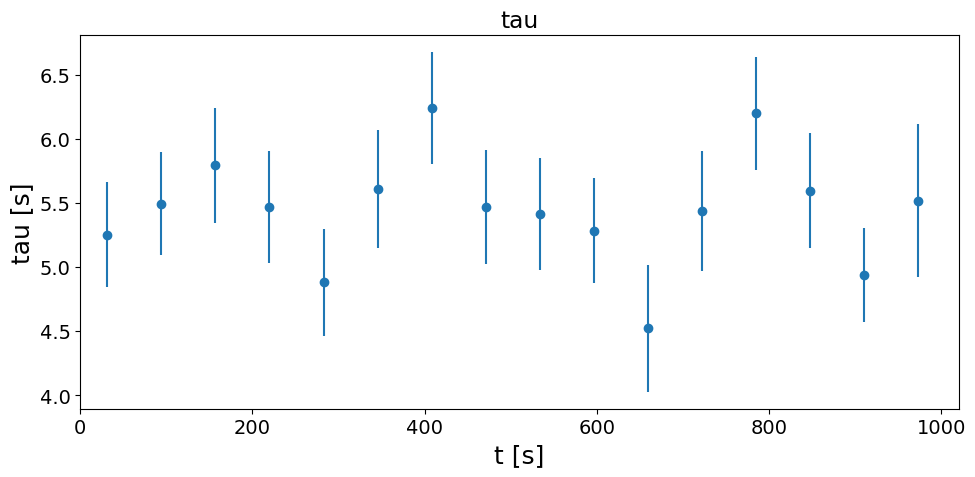

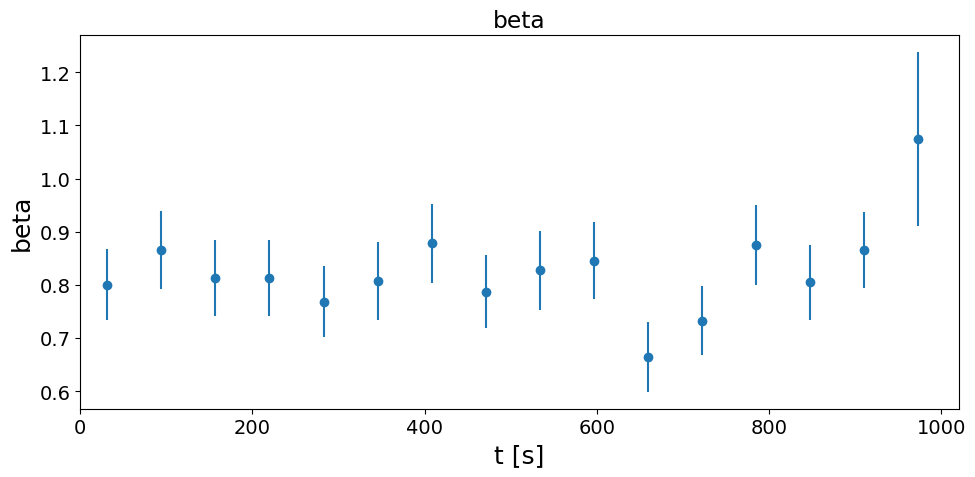

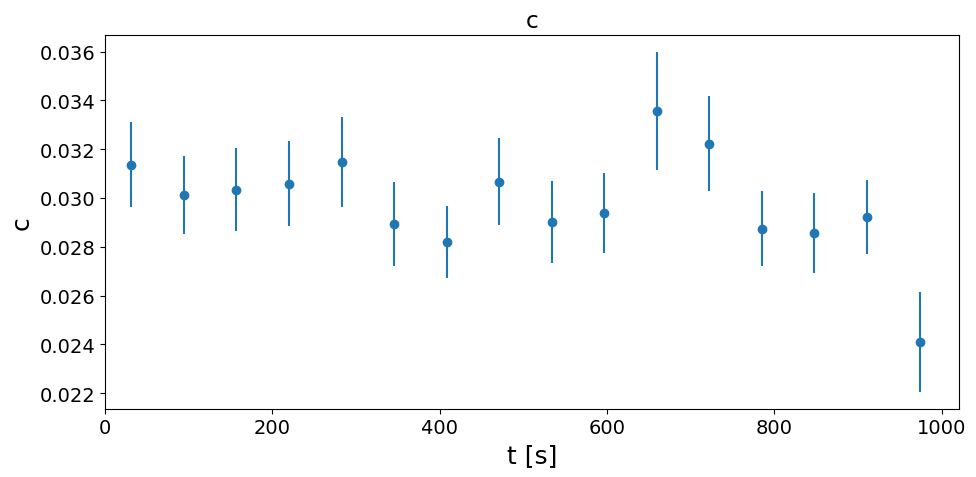

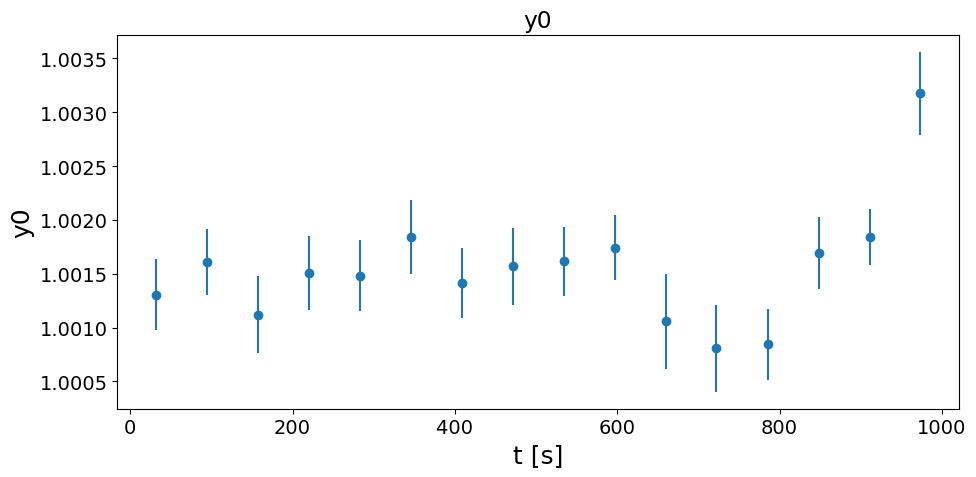

In [51]:
##################
t1_fit = 0
t2_fit = 1e100
##################

################# KKW MODEL #################
model = lm.Model(decorrelation_f)
params = lm.Parameters()
params.add('tau', value=1, min=0, max=10)
params.add('beta', value=1, min=0, max=2)
params.add('c', value=.03, min=0, max=.1)
params.add('y0', value=1, min=1, max=1.01)
#params.add('y0', value=1.015, vary=False)
##############################################

plotfit_bydose(itime, Lbin, g2, t1_fit, t2_fit)

### Linear correlation of damaged-vGeO2

In [52]:
G2t = XPCS.get_G2t(e4m_data, mask=None, Nfi=None, Nff=None, Lbin=None)

g2 = np.vstack(XPCS.get_g2(itime, G2t))
np.savetxt(f"{g24damaged_vGeO2_folder}g2-{sample_name}_{str(Ndataset).zfill(4)}_{str(Nscan).zfill(4)}-Q={Q_notebook}-dQ={dQ_notebook}.txt", g2)

Loading frames ...
Done! (elapsed time = 0.0 s)
Computing G2t (using MKL library)...
Done! (elapsed time = 99.8 s)
	 | 219999 X 219999 squared matrix
	 | memory usage (np.array @ float32) = 180.302 GB
Normalizing G2t (using NumExpr library)...
Done! (elapsed time = 19.15 s)

Computing g2 (using cython code)...
Done! (elapsed time = 37.41 s)



Using Global variables: model, params, Q_notebook, dQ_notebook, sample_name, Ndataset, Nscan


,Q,dQ,tau,dtau,dtau%,beta,dbeta,dbeta%,c,dc,dc%,y0,dy0,dy%,redchi2
0,0.21,0.01,5.286614,0.051587,0.975801,0.774137,0.006176,0.797831,0.029921,0.000178,0.596028,1.001517,0.000013,0.001307,1.022955


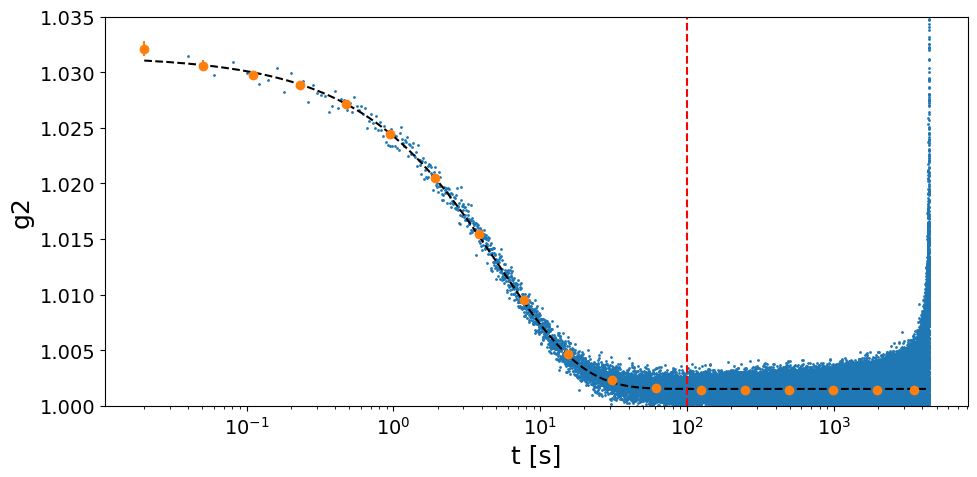

In [53]:
##################
t1_fit = None
t2_fit = 1e2
##################

################# KKW MODEL #################
model = lm.Model(decorrelation_f)
params = lm.Parameters()
params.add('tau', value=1, min=0, max=10)
params.add('beta', value=1, min=0, max=2)
params.add('c', value=.03, min=0, max=.1)
params.add('y0', value=1, min=1, max=1.01)
#params.add('y0', value=1.015, vary=False)
##############################################

plotfit_4damaged_vGeO2(itime, g2, t1_fit, t2_fit)

plt.ylim(1, 1.035)
plt.tight_layout(); plt.show()

## XPCS scan: T=100C, Q=0.19, 20min @ 20ms (GeO2_6, dataset 1, scan 3)

In [54]:
#######################################
sample_name = 'GeO2_6_100C'
Ndataset = 1
Nscan =3
Nfi, Nff = 1, None
load_mask = e4m_mask * e4m_htmask * bs_mask * Qmask # Put None for profile analysis!
#######################################

scan = ID10.load_scan(RAW_folder, sample_name, Ndataset, Nscan)
Ei = scan['monoe']
itime = scan['fast_timer_period'][0]
theta = scan['delcoup']
Q = round(XPCS.theta2Q(Ei,  theta),2)

print('#############################')
print('command =', scan['command'])
print('Ei =', Ei)
print('itime =', itime)
print('theta =', theta)
print('Q =', Q)
print('T = {:.2f} min'.format(len(scan['fast_timer_period'])*itime/60))   
print('#############################\n')

e4m_data = ID10.load_sparse_e4m(RAW_folder, sample_name, Ndataset, Nscan, Nfi, Nff,  n_jobs=20, load_mask=load_mask)
e4m_data = COSMIC.fast_gamma_filter(e4m_data, Imaxth_high=4)

#############################
command = mtimescan 0.02 1 60000
Ei = 9.699998837562536
itime = 0.020101
theta = 1.7500000000000004
Q = 0.15
T = 20.10 min
#############################

Loading sparse array ...
	 -> loading file eiger4m_v2_sparse_frame_0_00000.h5 (1/12 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00001.h5 (2/12 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00002.h5 (3/12 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00003.h5 (4/12 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00004.h5 (5/12 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00005.h5 (6/12 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00006.h5 (7/12 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00007.h5 (8/12 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00008.h5 (9/12 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00009.h5 (10/12 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00010.h5 (11/12 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00011.h5 (12/12 loo

### Flux check

################################################################################
Maximum count in the whole run -> 4.0
# of pixels above Ith_high treshold ->  3932894 pixels (of 4471016 => 87.96 %)
# of pixels below Ith_low treshold ->  16 pixels (of 4471016 => 0.0 %)
################################################################################



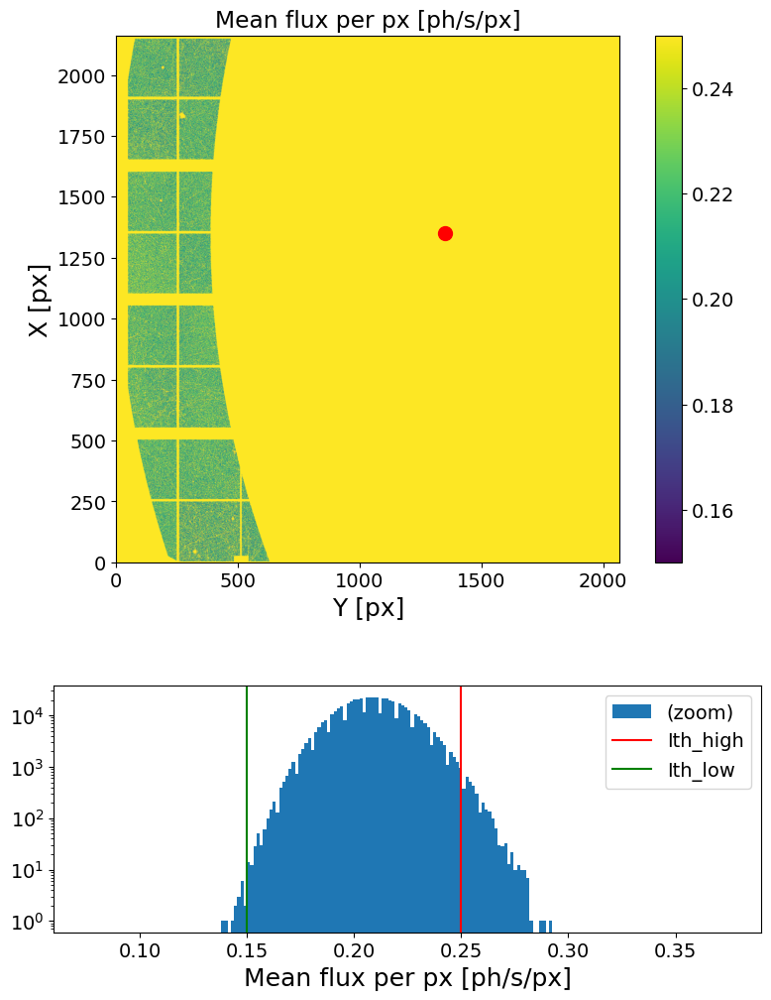

In [55]:
XPCS.gen_plots4mask(e4m_data, itime, Ith_low=.15, Ith_high=.25, Nff=None, load_mask=load_mask)

### Intensity analysis

In [56]:
####################
Lbin = 100
Nstep = 100
mask = None #e4m_mask*e4m_htmask*bs_mask*Qmask
####################

It = np.vstack(XPCS.get_It(e4m_data, itime, mask=mask, Lbin=Lbin, Nstep=Nstep))
np.savetxt(f"{Intensity_folder}Idt-{sample_name}_{str(Ndataset).zfill(4)}_{str(Nscan).zfill(4)}-Q={Q_notebook}-dQ={dQ_notebook}.txt", It)

<SecondaryAxis: >

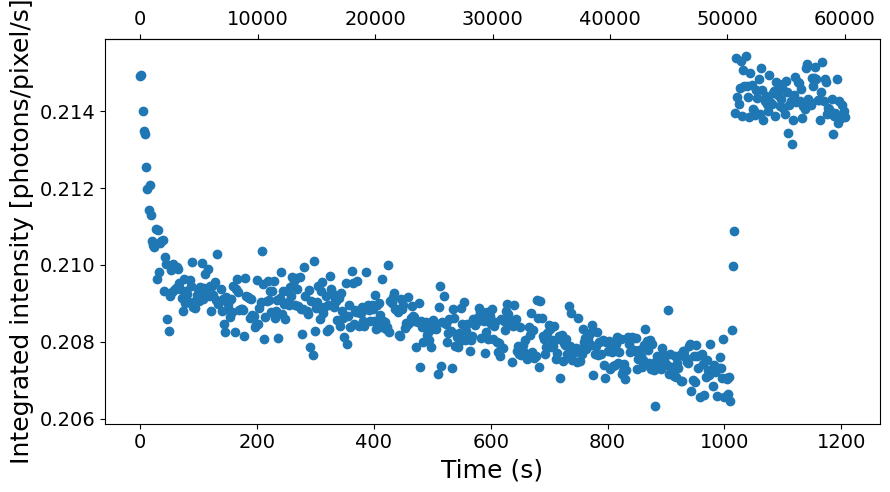

In [57]:
plt.figure(figsize=(10,5))
plt.scatter(It[0], It[1], label='It')
plt.xlabel('Time (s)')
plt.ylabel('Integrated intensity [photons/pixel/s]')
plt.gca().secondary_xaxis('top', functions=(lambda x: x/itime, lambda x: x*itime))
#plt.xlim(0, 3000)

### Linear Correlation by Dose

In [58]:
###################
Nfi = None
Nff = 50_000
Lbin = 1
mask = None #e4m_mask * e4m_htmask * bs_mask * Qmask
###################
if Lbin is None: Lbin=1

G2t = XPCS.get_G2t(e4m_data, mask=mask, Nfi=Nfi, Nff=Nff, Lbin=None)

Loading frames ...
Done! (elapsed time = 1.24 s)
Computing G2t (using MKL library)...
Done! (elapsed time = 9.48 s)
	 | 50000 X 50000 squared matrix
	 | memory usage (np.array @ float32) = 9.313 GB
Normalizing G2t (using NumExpr library)...
Done! (elapsed time = 1.16 s)



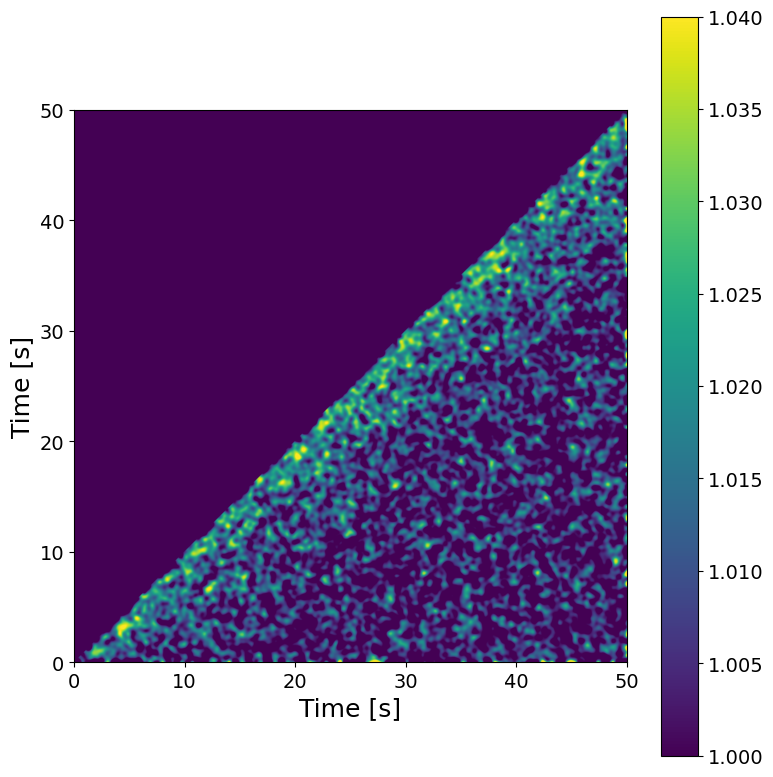

In [59]:
############################
t1, t2 = 0, 50
vmin, vmax = 1.0, 1.04
############################
XPCS.plot_G2t(G2t, vmin, vmax, itime=itime, t1=t1, t2=t2, sigma_filter=10)

In [60]:
################
Nbunch = 16
################

NfXbunch = int(G2t.shape[0]/Nbunch)
g2 = {}
for n in range(Nbunch):
    t_bunch = round(itime*Lbin*NfXbunch*(n+1/2),1)
    g2[t_bunch] = np.vstack(XPCS.get_g2(itime*Lbin, np.array(G2t[NfXbunch*n:NfXbunch*(n+1), NfXbunch*n:NfXbunch*(n+1)])))

Computing g2 (using cython code)...
Done! (elapsed time = 0.03 s)

Computing g2 (using cython code)...
Done! (elapsed time = 0.02 s)

Computing g2 (using cython code)...
Done! (elapsed time = 0.02 s)

Computing g2 (using cython code)...
Done! (elapsed time = 0.02 s)

Computing g2 (using cython code)...
Done! (elapsed time = 0.02 s)

Computing g2 (using cython code)...
Done! (elapsed time = 0.02 s)

Computing g2 (using cython code)...
Done! (elapsed time = 0.02 s)

Computing g2 (using cython code)...
Done! (elapsed time = 0.02 s)

Computing g2 (using cython code)...
Done! (elapsed time = 0.02 s)

Computing g2 (using cython code)...
Done! (elapsed time = 0.02 s)

Computing g2 (using cython code)...
Done! (elapsed time = 0.02 s)

Computing g2 (using cython code)...
Done! (elapsed time = 0.02 s)

Computing g2 (using cython code)...
Done! (elapsed time = 0.02 s)

Computing g2 (using cython code)...
Done! (elapsed time = 0.02 s)

Computing g2 (using cython code)...
Done! (elapsed time = 0.02

Using Global variables: Nbunch, model, params, Q_notebook, dQ_notebook, sample_name, Ndataset, Nscan


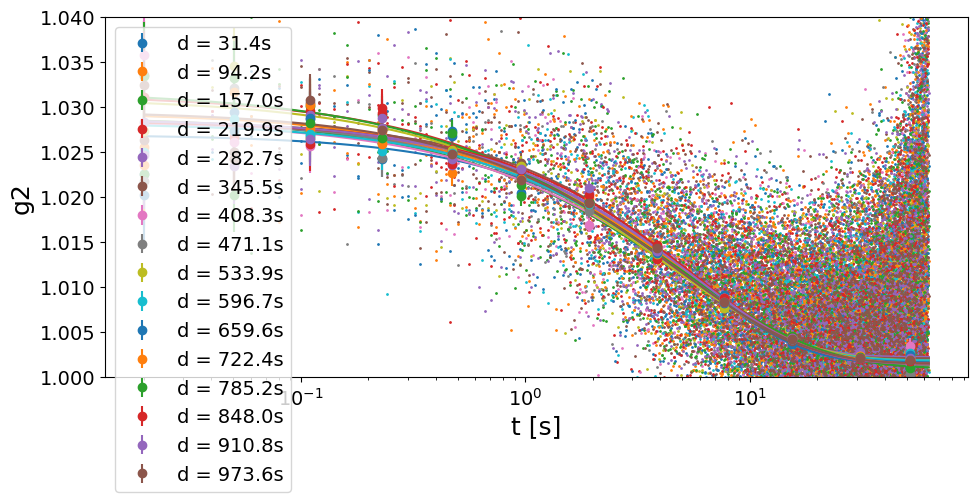

,Q,dQ,tau,dtau,dtau%,beta,dbeta,dbeta%,c,dc,dc%,y0,dy0,dy%,redchi2
tw,,,,,,,,,,,,,,,
31.4,0.21,0.01,5.565994,0.462876,8.316149,0.875843,0.084927,9.696652,0.025445,0.001547,6.078110,1.001494,0.000299,0.029903,1.021843
94.2,0.21,0.01,4.989055,0.472477,9.470265,0.812770,0.081778,10.061687,0.026776,0.001771,6.613435,1.001842,0.000315,0.031422,1.039550
157.0,0.21,0.01,4.918619,0.520655,10.585399,0.735400,0.077080,10.481395,0.027518,0.001982,7.201878,1.001433,0.000368,0.036759,0.985264
219.9,0.21,0.01,4.398337,0.482772,10.976243,0.719829,0.073814,10.254434,0.029942,0.002158,7.208366,1.001477,0.000359,0.035850,1.050392
282.7,0.21,0.01,5.023218,0.454208,9.042179,0.860265,0.086540,10.059675,0.026120,0.001682,6.438937,1.002251,0.000294,0.029299,1.072767
345.5,0.21,0.01,5.184886,0.398710,7.689859,0.914856,0.083295,9.104724,0.026278,0.001477,5.621912,1.002117,0.000263,0.026214,0.971835
408.3,0.21,0.01,5.156061,0.540942,10.491375,0.751088,0.080530,10.721760,0.027003,0.001961,7.263014,1.001480,0.000378,0.037760,1.038161
471.1,0.21,0.01,5.171498,0.517257,10.002072,0.760524,0.078453,10.315679,0.027549,0.001915,6.950452,1.001307,0.000368,0.036718,1.020178
533.9,0.21,0.01,4.262360,0.482022,11.308804,0.720741,0.075257,10.441565,0.029215,0.002152,7.366844,1.001826,0.000345,0.034476,1.026601


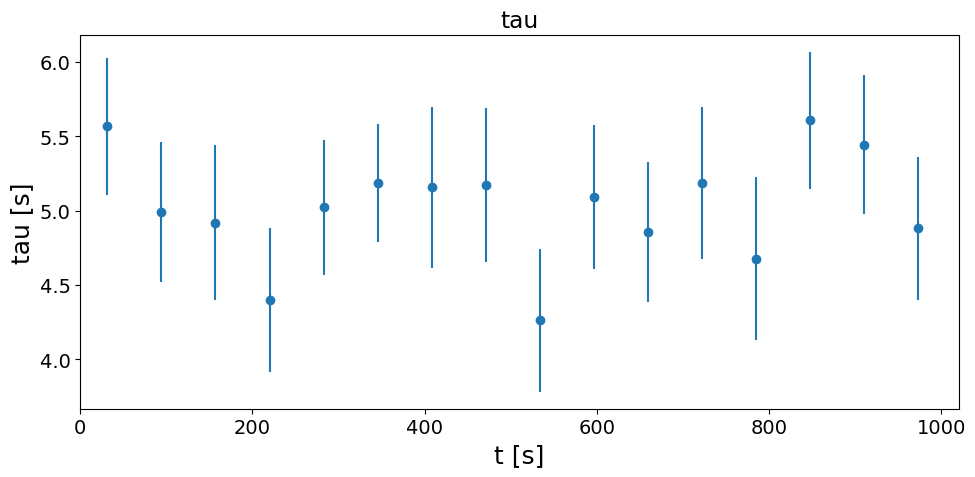

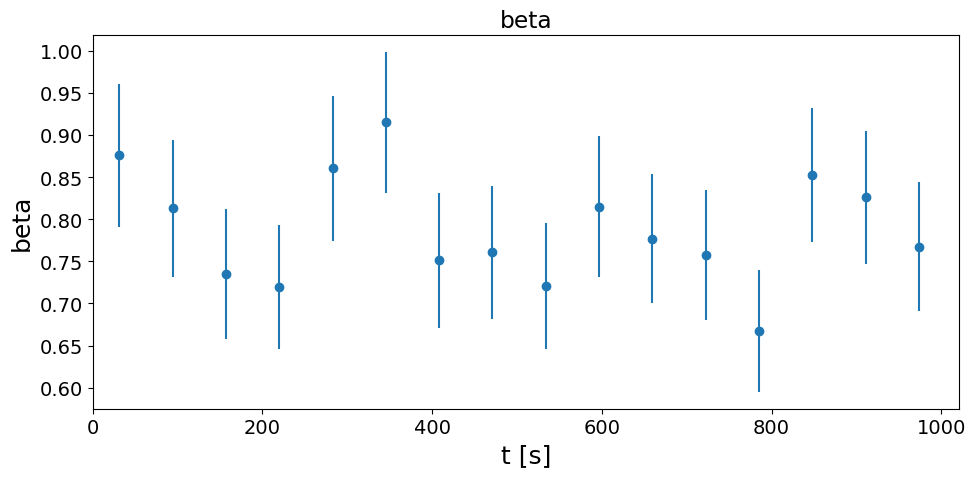

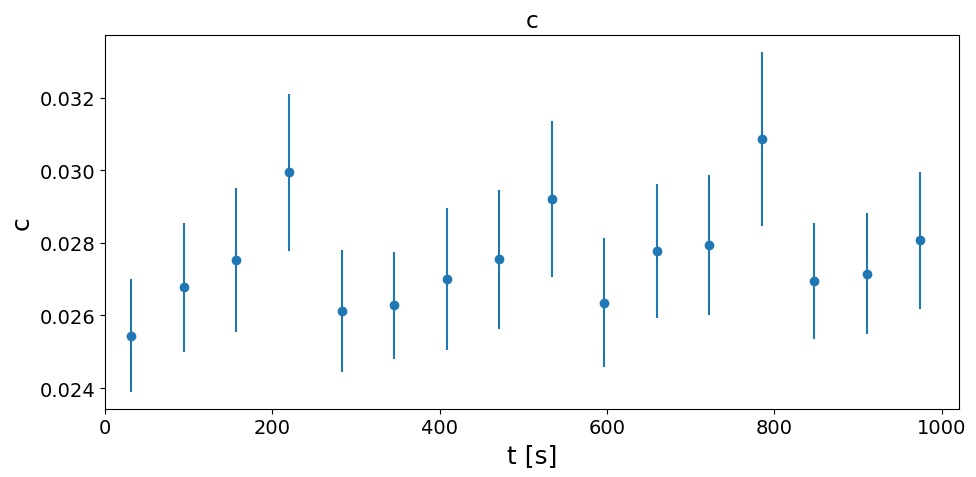

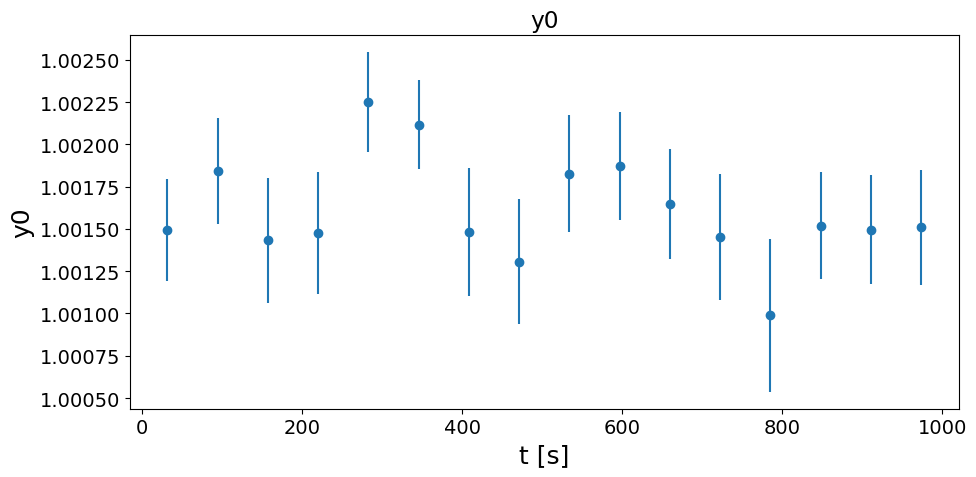

In [61]:
##################
t1_fit = 0
t2_fit = 1e100
##################

################# KKW MODEL #################
model = lm.Model(decorrelation_f)
params = lm.Parameters()
params.add('tau', value=1, min=0, max=10)
params.add('beta', value=1, min=0, max=2)
params.add('c', value=.03, min=0, max=.1)
params.add('y0', value=1, min=1, max=1.01)
#params.add('y0', value=1.015, vary=False)
##############################################

plotfit_bydose(itime, Lbin, g2, t1_fit, t2_fit)

### Linear correlation of damaged-vGeO2

In [62]:
G2t = XPCS.get_G2t(e4m_data, mask=None, Nfi=5000, Nff=None, Lbin=None)

g2 = np.vstack(XPCS.get_g2(itime, G2t))
np.savetxt(f"{g24damaged_vGeO2_folder}g2-{sample_name}_{str(Ndataset).zfill(4)}_{str(Nscan).zfill(4)}-Q={Q_notebook}-dQ={dQ_notebook}.txt", g2)

Loading frames ...


Done! (elapsed time = 1.21 s)
Computing G2t (using MKL library)...
Done! (elapsed time = 10.66 s)
	 | 54999 X 54999 squared matrix
	 | memory usage (np.array @ float32) = 11.269 GB
Normalizing G2t (using NumExpr library)...
Done! (elapsed time = 1.36 s)

Computing g2 (using cython code)...
Done! (elapsed time = 3.79 s)



Using Global variables: model, params, Q_notebook, dQ_notebook, sample_name, Ndataset, Nscan


,Q,dQ,tau,dtau,dtau%,beta,dbeta,dbeta%,c,dc,dc%,y0,dy0,dy%,redchi2
0,0.21,0.01,4.836616,0.114193,2.361019,0.729458,0.011976,1.641805,0.028639,0.000382,1.333652,1.001451,0.000011,0.00106,0.993934


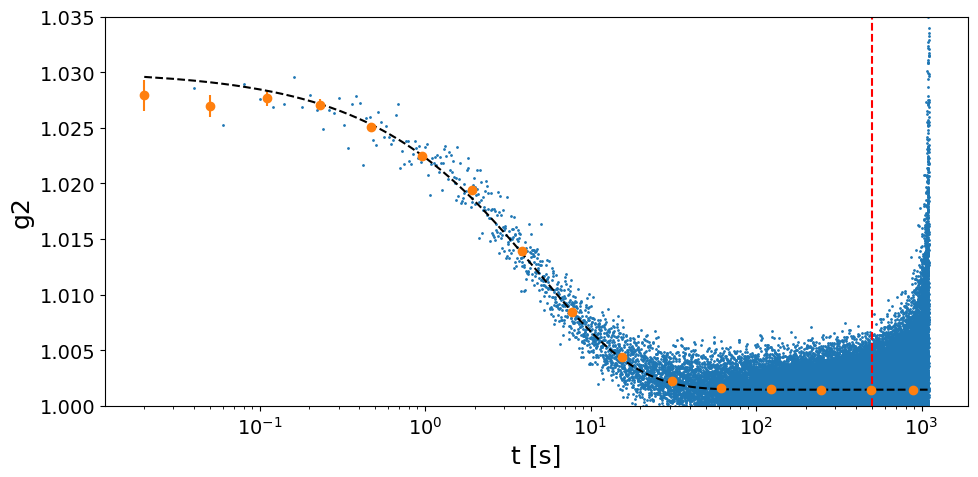

In [63]:
##################
t1_fit = None
t2_fit = 5e2
##################

################# KKW MODEL #################
model = lm.Model(decorrelation_f)
params = lm.Parameters()
params.add('tau', value=1, min=0, max=10)
params.add('beta', value=1, min=0, max=2)
params.add('c', value=.03, min=0, max=.1)
params.add('y0', value=1, min=1, max=1.01)
#params.add('y0', value=1.015, vary=False)
##############################################

plotfit_4damaged_vGeO2(itime, g2, t1_fit, t2_fit)

plt.ylim(1, 1.035)
plt.tight_layout(); plt.show()

## XPCS scan: T=170C, Q=0.19, 20min @ 20ms (60000fm) (GeO2_6, dataset 1, scan 1) 

In [64]:
#######################################
sample_name = 'GeO2_6_170C'
Ndataset = 1
Nscan = 1
Nfi, Nff = 1, None
load_mask = e4m_mask * e4m_htmask * bs_mask * Qmask # Put None for profile analysis!
#######################################

scan = ID10.load_scan(RAW_folder, sample_name, Ndataset, Nscan)
Ei = scan['monoe']
itime = scan['fast_timer_period'][0]
theta = scan['delcoup']
Q = round(XPCS.theta2Q(Ei,  theta),2)

print('#############################')
print('command =', scan['command'])
print('Ei =', Ei)
print('itime =', itime)
print('theta =', theta)
print('Q =', Q)
print('T = {:.2f} min'.format(len(scan['fast_timer_period'])*itime/60))   
print('#############################\n')

e4m_data = ID10.load_sparse_e4m(RAW_folder, sample_name, Ndataset, Nscan, Nfi, Nff,  n_jobs=20, load_mask=load_mask)
e4m_data = COSMIC.fast_gamma_filter(e4m_data, Imaxth_high=4)

#############################
command = mtimescan 0.02 1 60000
Ei = 9.699998837562536
itime = 0.020101
theta = 1.7500000000000004
Q = 0.15
T = 20.10 min
#############################

Loading sparse array ...
	 -> loading file eiger4m_v2_sparse_frame_0_00000.h5 (1/12 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00001.h5 (2/12 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00002.h5 (3/12 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00003.h5 (4/12 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00004.h5 (5/12 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00005.h5 (6/12 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00006.h5 (7/12 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00007.h5 (8/12 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00008.h5 (9/12 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00009.h5 (10/12 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00010.h5 (11/12 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00011.h5 (12/12 loo

### Flux check

################################################################################
Maximum count in the whole run -> 4.0
# of pixels above Ith_high treshold ->  3931068 pixels (of 4471016 => 87.92 %)
# of pixels below Ith_low treshold ->  30 pixels (of 4471016 => 0.0 %)
################################################################################



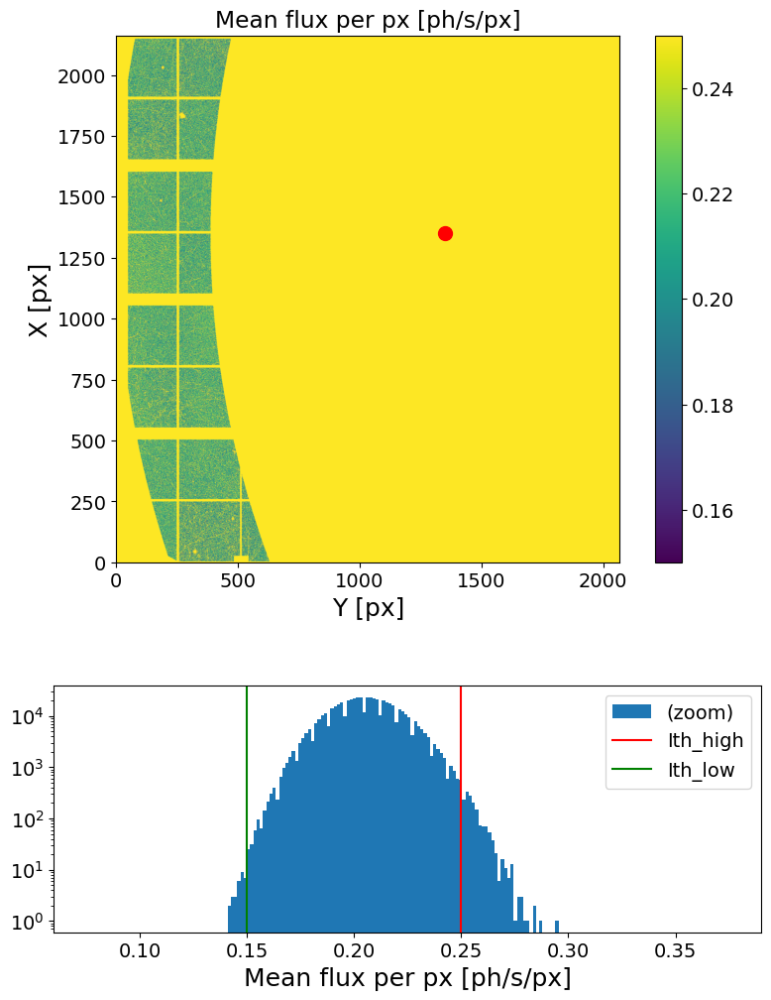

In [65]:
XPCS.gen_plots4mask(e4m_data, itime, Ith_low=.15, Ith_high=.25, Nff=None, load_mask=load_mask)

### Intensity analysis

In [66]:
####################
Lbin = 100
Nstep = 100
mask = None #e4m_mask*e4m_htmask*bs_mask*Qmask
####################

It = np.vstack(XPCS.get_It(e4m_data, itime, mask=mask, Lbin=Lbin, Nstep=Nstep))
np.savetxt(f"{Intensity_folder}Idt-{sample_name}_{str(Ndataset).zfill(4)}_{str(Nscan).zfill(4)}-Q={Q_notebook}-dQ={dQ_notebook}.txt", It)

<SecondaryAxis: >

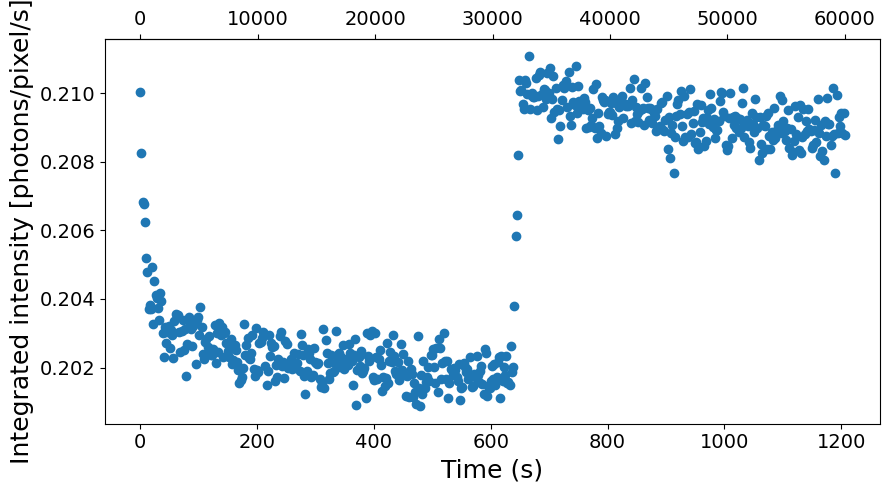

In [67]:
plt.figure(figsize=(10,5))
plt.scatter(It[0], It[1], label='It')
plt.xlabel('Time (s)')
plt.ylabel('Integrated intensity [photons/pixel/s]')
plt.gca().secondary_xaxis('top', functions=(lambda x: x/itime, lambda x: x*itime))
#plt.xlim(0, 3000)

### Linear Correlation by Dose

In [68]:
###################
Nfi = None
Nff = 50_000
Lbin = 1
mask = None #e4m_mask * e4m_htmask * bs_mask * Qmask
###################
if Lbin is None: Lbin=1

G2t = XPCS.get_G2t(e4m_data, mask=mask, Nfi=Nfi, Nff=Nff, Lbin=None)

Loading frames ...
Done! (elapsed time = 1.07 s)
Computing G2t (using MKL library)...
Done! (elapsed time = 9.13 s)
	 | 50000 X 50000 squared matrix
	 | memory usage (np.array @ float32) = 9.313 GB
Normalizing G2t (using NumExpr library)...
Done! (elapsed time = 1.06 s)



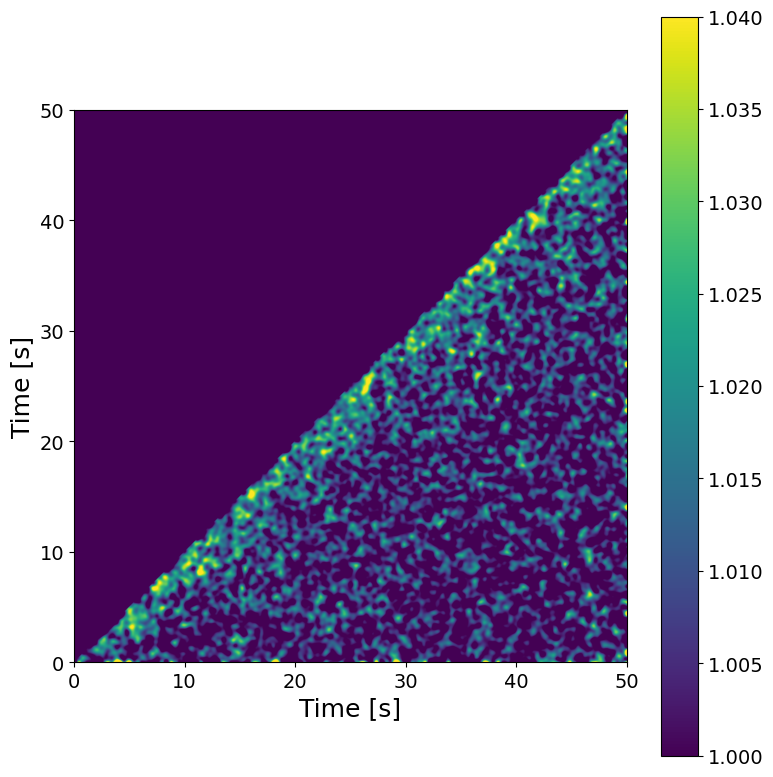

In [69]:
############################
t1, t2 = 0, 50
vmin, vmax = 1.0, 1.04
############################
XPCS.plot_G2t(G2t, vmin, vmax, itime=itime, t1=t1, t2=t2, sigma_filter=10)

In [70]:
################
Nbunch = 16
################

NfXbunch = int(G2t.shape[0]/Nbunch)
g2 = {}
for n in range(Nbunch):
    t_bunch = round(itime*Lbin*NfXbunch*(n+1/2),1)
    g2[t_bunch] = np.vstack(XPCS.get_g2(itime*Lbin, np.array(G2t[NfXbunch*n:NfXbunch*(n+1), NfXbunch*n:NfXbunch*(n+1)])))

Computing g2 (using cython code)...
Done! (elapsed time = 0.03 s)

Computing g2 (using cython code)...
Done! (elapsed time = 0.02 s)

Computing g2 (using cython code)...
Done! (elapsed time = 0.02 s)

Computing g2 (using cython code)...
Done! (elapsed time = 0.01 s)

Computing g2 (using cython code)...
Done! (elapsed time = 0.01 s)

Computing g2 (using cython code)...
Done! (elapsed time = 0.01 s)

Computing g2 (using cython code)...
Done! (elapsed time = 0.01 s)

Computing g2 (using cython code)...
Done! (elapsed time = 0.01 s)

Computing g2 (using cython code)...
Done! (elapsed time = 0.01 s)

Computing g2 (using cython code)...
Done! (elapsed time = 0.01 s)

Computing g2 (using cython code)...
Done! (elapsed time = 0.01 s)

Computing g2 (using cython code)...
Done! (elapsed time = 0.01 s)

Computing g2 (using cython code)...
Done! (elapsed time = 0.01 s)

Computing g2 (using cython code)...
Done! (elapsed time = 0.01 s)

Computing g2 (using cython code)...
Done! (elapsed time = 0.01

Using Global variables: Nbunch, model, params, Q_notebook, dQ_notebook, sample_name, Ndataset, Nscan


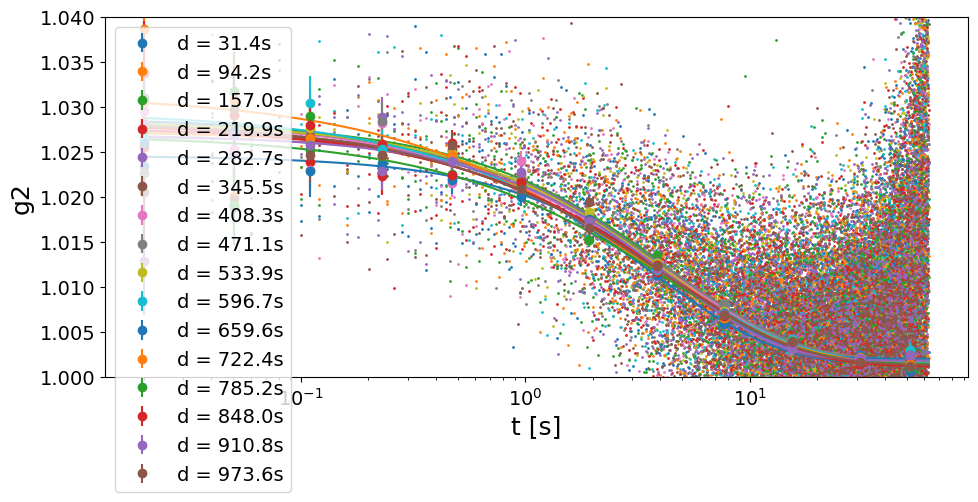

,Q,dQ,tau,dtau,dtau%,beta,dbeta,dbeta%,c,dc,dc%,y0,dy0,dy%,redchi2
tw,,,,,,,,,,,,,,,
31.4,0.21,0.01,3.714265,0.432668,11.648811,0.786041,0.086444,10.997374,0.027342,0.002079,7.604847,1.001505,0.000276,0.027570,1.057153
94.2,0.21,0.01,4.989972,0.453004,9.078297,0.851589,0.085133,9.996923,0.025919,0.001668,6.434930,1.001399,0.000291,0.029017,0.967556
157.0,0.21,0.01,4.802870,0.462144,9.622251,0.814777,0.082265,10.096682,0.027103,0.001808,6.670239,1.001298,0.000308,0.030725,0.994465
219.9,0.21,0.01,4.356407,0.526365,12.082540,0.731339,0.083018,11.351474,0.026611,0.002116,7.949906,1.001594,0.000344,0.034323,0.979447
282.7,0.21,0.01,4.711861,0.415770,8.823892,0.931235,0.096690,10.382946,0.025068,0.001605,6.403034,1.001721,0.000260,0.025928,1.048566
345.5,0.21,0.01,4.560717,0.433261,9.499843,0.857044,0.087875,10.253259,0.026029,0.001728,6.637812,1.001557,0.000274,0.027398,0.992556
408.3,0.21,0.01,4.347627,0.514755,11.839912,0.750097,0.084928,11.322331,0.026658,0.002087,7.830044,1.001864,0.000335,0.033482,1.030815
471.1,0.21,0.01,4.546655,0.511105,11.241344,0.770970,0.085777,11.125844,0.026608,0.002015,7.574329,1.001892,0.000333,0.033221,1.043351
533.9,0.21,0.01,4.396092,0.453671,10.319870,0.810676,0.085172,10.506252,0.026682,0.001871,7.012269,1.001683,0.000292,0.029124,1.001372


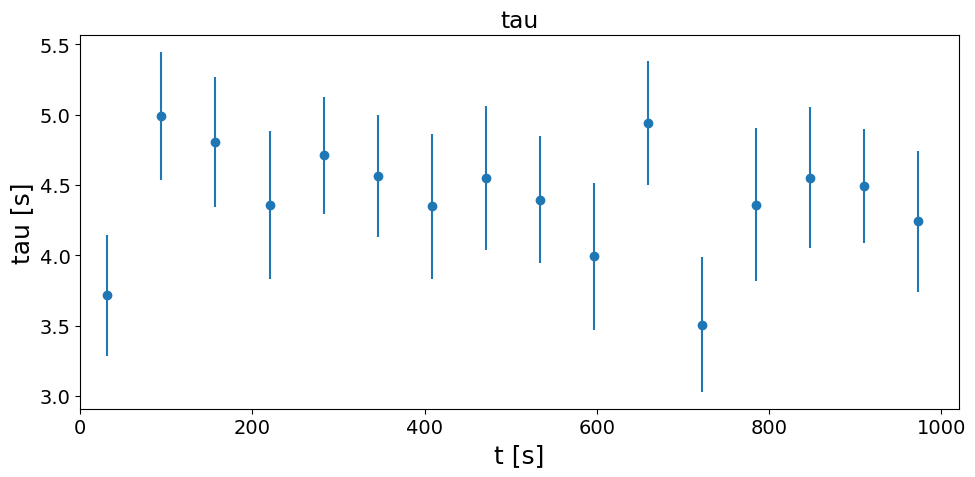

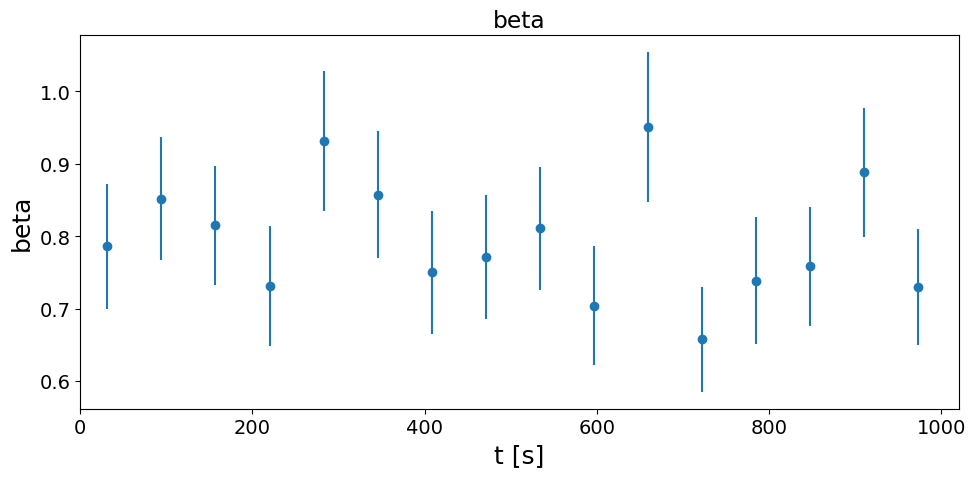

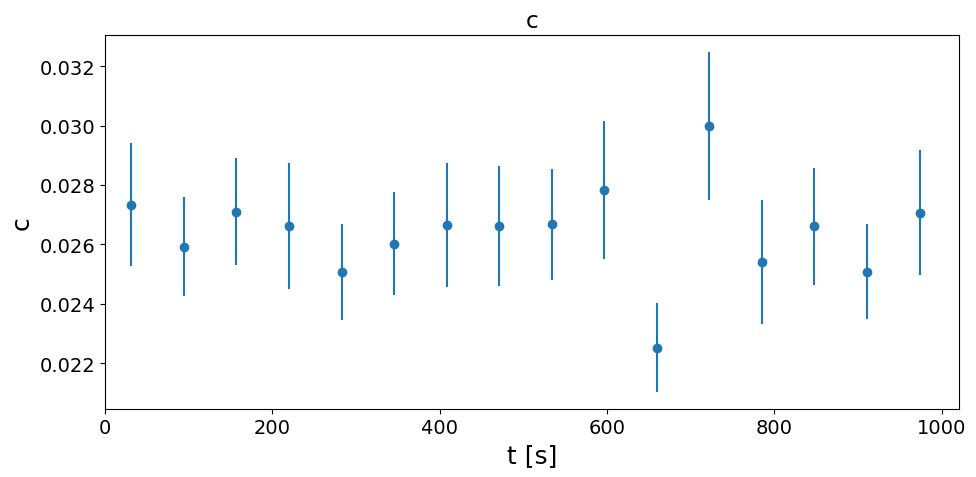

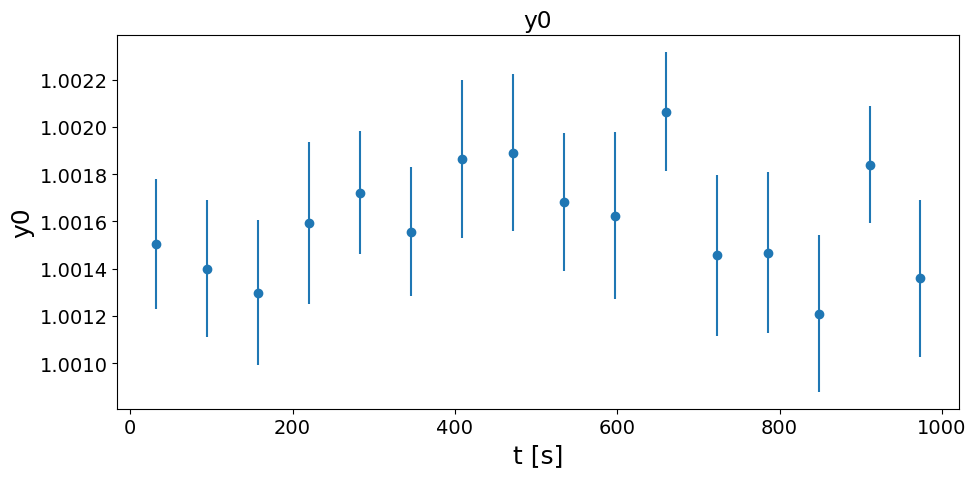

In [71]:
##################
t1_fit = 0
t2_fit = 1e100
##################

################# KKW MODEL #################
model = lm.Model(decorrelation_f)
params = lm.Parameters()
params.add('tau', value=1, min=0, max=10)
params.add('beta', value=1, min=0, max=2)
params.add('c', value=.03, min=0, max=.1)
params.add('y0', value=1, min=1, max=1.01)
#params.add('y0', value=1.015, vary=False)
##############################################

plotfit_bydose(itime, Lbin, g2, t1_fit, t2_fit)

### Linear correlation of damaged-vGeO2

In [72]:
###################
Nfi = 5000
Nff = None
Lbin = None
mask = None #e4m_mask * e4m_htmask * bs_mask * Qmask
#Nbunch = 5
###################
if Lbin is None: Lbin=1

G2t = XPCS.get_G2t(e4m_data, mask=mask, Nfi=Nfi, Nff=Nff, Lbin=None)
#G2t = XPCS.get_G2t_bybunch(e4m_data, mask=mask, Nfi=Nfi, Nff=Nff, Lbin=Lbin, Nbunch=Nbunch)

Loading frames ...
Done! (elapsed time = 1.82 s)
Computing G2t (using MKL library)...
Done! (elapsed time = 10.61 s)
	 | 54999 X 54999 squared matrix
	 | memory usage (np.array @ float32) = 11.269 GB
Normalizing G2t (using NumExpr library)...
Done! (elapsed time = 1.42 s)



In [73]:
G2t = XPCS.get_G2t(e4m_data, mask=None, Nfi=5000, Nff=None, Lbin=None)

g2 = np.vstack(XPCS.get_g2(itime, G2t))
np.savetxt(f"{g24damaged_vGeO2_folder}g2-{sample_name}_{str(Ndataset).zfill(4)}_{str(Nscan).zfill(4)}-Q={Q_notebook}-dQ={dQ_notebook}.txt", g2)

Loading frames ...
Done! (elapsed time = 1.79 s)
Computing G2t (using MKL library)...
Done! (elapsed time = 10.65 s)
	 | 54999 X 54999 squared matrix
	 | memory usage (np.array @ float32) = 11.269 GB
Normalizing G2t (using NumExpr library)...
Done! (elapsed time = 1.38 s)

Computing g2 (using cython code)...
Done! (elapsed time = 2.41 s)



Using Global variables: model, params, Q_notebook, dQ_notebook, sample_name, Ndataset, Nscan


,Q,dQ,tau,dtau,dtau%,beta,dbeta,dbeta%,c,dc,dc%,y0,dy0,dy%,redchi2
0,0.21,0.01,4.292787,0.111486,2.597062,0.74783,0.013977,1.868968,0.027286,0.000407,1.490801,1.001452,0.000011,0.001069,1.002741


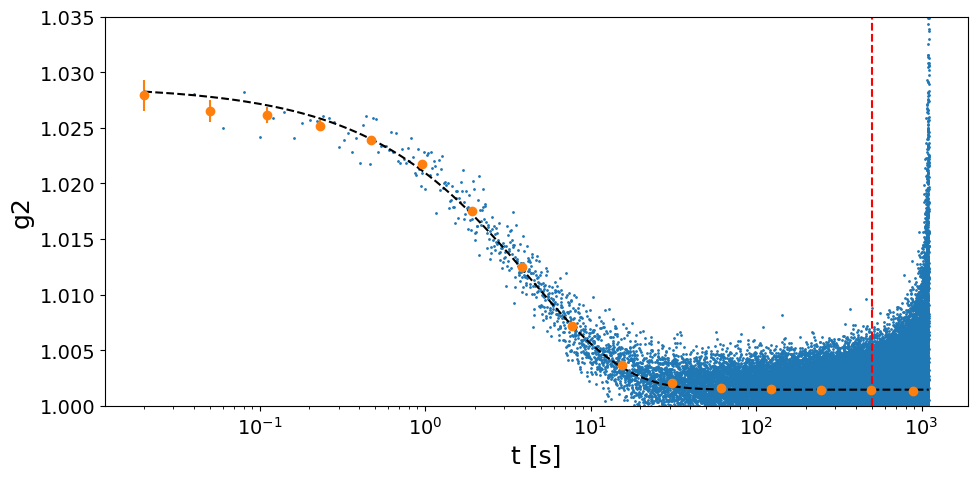

In [74]:
##################
t1_fit = None
t2_fit = 5e2
##################

################# KKW MODEL #################
model = lm.Model(decorrelation_f)
params = lm.Parameters()
params.add('tau', value=1, min=0, max=10)
params.add('beta', value=1, min=0, max=2)
params.add('c', value=.03, min=0, max=.1)
params.add('y0', value=1, min=1, max=1.01)
#params.add('y0', value=1.015, vary=False)
##############################################

plotfit_4damaged_vGeO2(itime, g2, t1_fit, t2_fit)

plt.ylim(1, 1.035)
plt.tight_layout(); plt.show()

## XPCS scan: T=240C , Q=0.19, 20min @ 20ms (60000fm) (GeO2_6, dataset 1, scan 1)

In [75]:
#######################################
sample_name = 'GeO2_6_240C'
Ndataset = 1
Nscan = 3
Nfi, Nff = 1, None
load_mask = e4m_mask * e4m_htmask * bs_mask * Qmask # Put None for profile analysis!
#######################################

scan = ID10.load_scan(RAW_folder, sample_name, Ndataset, Nscan)
Ei = scan['monoe']
itime = scan['fast_timer_period'][0]
theta = scan['delcoup']
Q = round(XPCS.theta2Q(Ei,  theta),2)

print('#############################')
print('command =', scan['command'])
print('Ei =', Ei)
print('itime =', itime)
print('theta =', theta)
print('Q =', Q)
print('T = {:.2f} min'.format(len(scan['fast_timer_period'])*itime/60))   
print('#############################\n')

e4m_data = ID10.load_sparse_e4m(RAW_folder, sample_name, Ndataset, Nscan, Nfi, Nff,  n_jobs=20, load_mask=load_mask)
e4m_data = COSMIC.fast_gamma_filter(e4m_data, Imaxth_high=4)

#############################
command = mtimescan 0.02 1 60000
Ei = 9.699998837562536
itime = 0.020101
theta = 1.7500000000000004
Q = 0.15
T = 20.10 min
#############################

Loading sparse array ...
	 -> loading file eiger4m_v2_sparse_frame_0_00000.h5 (1/12 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00001.h5 (2/12 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00002.h5 (3/12 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00003.h5 (4/12 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00004.h5 (5/12 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00005.h5 (6/12 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00006.h5 (7/12 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00007.h5 (8/12 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00008.h5 (9/12 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00009.h5 (10/12 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00010.h5 (11/12 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00011.h5 (12/12 loo

### Flux check

################################################################################
Maximum count in the whole run -> 3.0
# of pixels above Ith_high treshold ->  3929526 pixels (of 4471016 => 87.89 %)
# of pixels below Ith_low treshold ->  271 pixels (of 4471016 => 0.01 %)
################################################################################



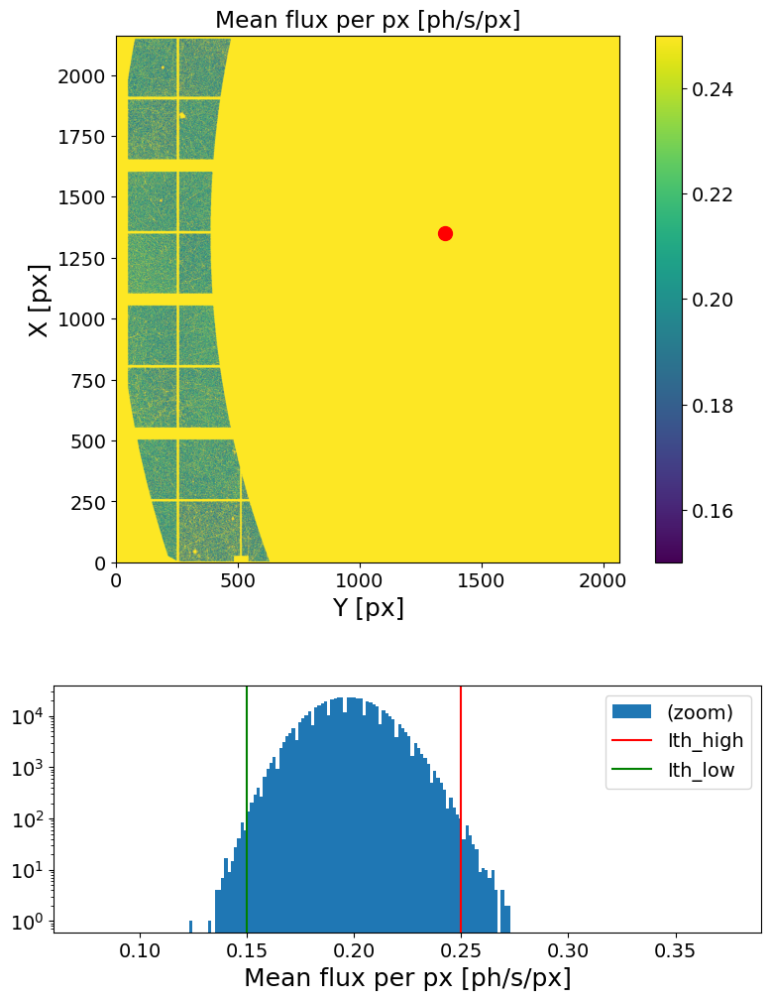

In [76]:
XPCS.gen_plots4mask(e4m_data, itime, Ith_low=.15, Ith_high=.25, Nff=None, load_mask=load_mask)

### Intensity analysis

In [77]:
####################
Lbin = 100
Nstep = 100
mask = None #e4m_mask*e4m_htmask*bs_mask*Qmask
####################

It = np.vstack(XPCS.get_It(e4m_data, itime, mask=mask, Lbin=Lbin, Nstep=Nstep))
np.savetxt(f"{Intensity_folder}Idt-{sample_name}_{str(Ndataset).zfill(4)}_{str(Nscan).zfill(4)}-Q={Q_notebook}-dQ={dQ_notebook}.txt", It)

<SecondaryAxis: >

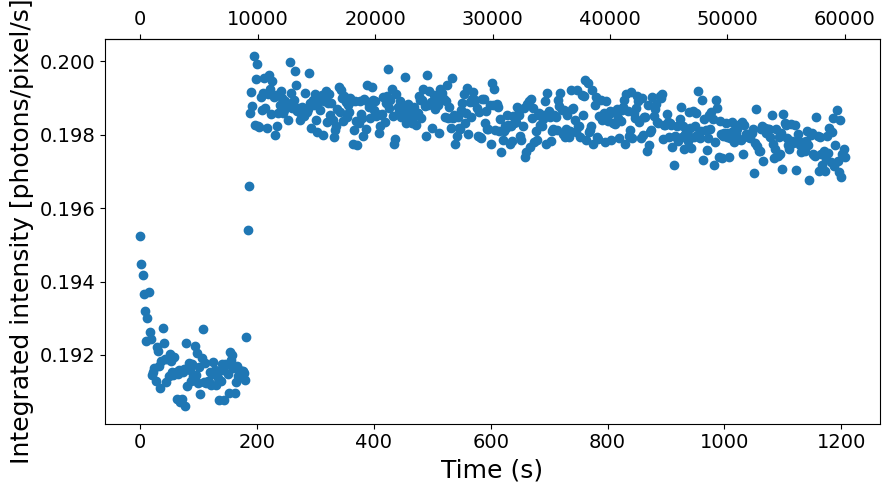

In [78]:
plt.figure(figsize=(10,5))
plt.scatter(It[0], It[1], label='It')
plt.xlabel('Time (s)')
plt.ylabel('Integrated intensity [photons/pixel/s]')
plt.gca().secondary_xaxis('top', functions=(lambda x: x/itime, lambda x: x*itime))
#plt.xlim(0, 3000)

### Linear Correlation by Dose

In [79]:
###################
Nfi = None
Nff = 50_000
Lbin = 1
mask = None #e4m_mask * e4m_htmask * bs_mask * Qmask
###################
if Lbin is None: Lbin=1

G2t = XPCS.get_G2t(e4m_data, mask=mask, Nfi=Nfi, Nff=Nff, Lbin=None)

Loading frames ...
Done! (elapsed time = 1.83 s)
Computing G2t (using MKL library)...
Done! (elapsed time = 9.23 s)
	 | 50000 X 50000 squared matrix
	 | memory usage (np.array @ float32) = 9.313 GB
Normalizing G2t (using NumExpr library)...
Done! (elapsed time = 1.19 s)



In [80]:
np.exp(-300/40)*100

np.float64(0.055308437014783364)

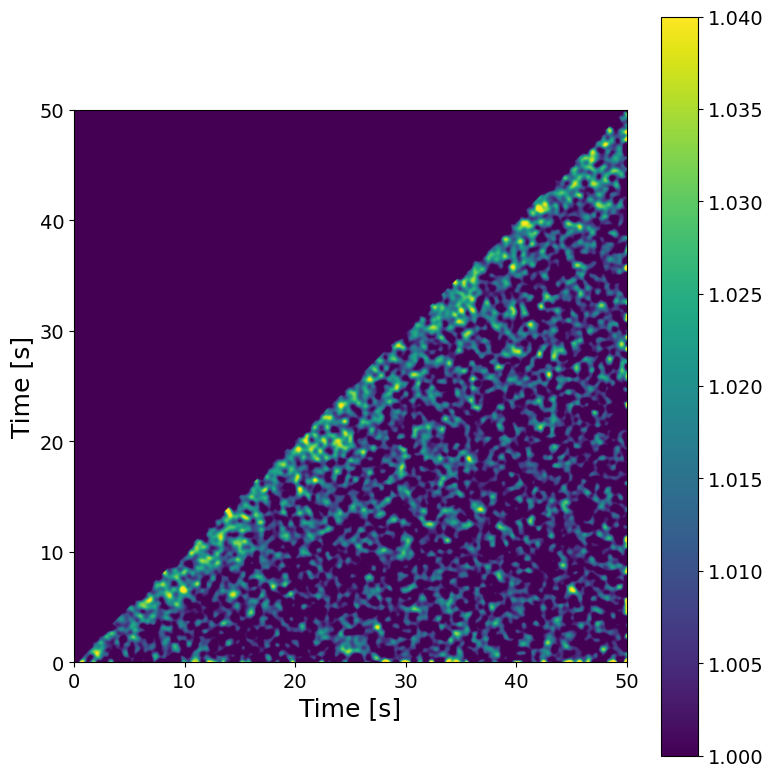

In [81]:
############################
t1, t2 = 0, 50
vmin, vmax = 1.0, 1.04
############################
XPCS.plot_G2t(G2t, vmin, vmax, itime=itime, t1=t1, t2=t2, sigma_filter=10)

In [82]:
################
Nbunch = 16
################

NfXbunch = int(G2t.shape[0]/Nbunch)
g2 = {}
for n in range(Nbunch):
    t_bunch = round(itime*Lbin*NfXbunch*(n+1/2),1)
    g2[t_bunch] = np.vstack(XPCS.get_g2(itime*Lbin, np.array(G2t[NfXbunch*n:NfXbunch*(n+1), NfXbunch*n:NfXbunch*(n+1)])))

Computing g2 (using cython code)...
Done! (elapsed time = 0.03 s)

Computing g2 (using cython code)...
Done! (elapsed time = 0.02 s)

Computing g2 (using cython code)...
Done! (elapsed time = 0.02 s)

Computing g2 (using cython code)...
Done! (elapsed time = 0.02 s)

Computing g2 (using cython code)...
Done! (elapsed time = 0.02 s)

Computing g2 (using cython code)...
Done! (elapsed time = 0.02 s)

Computing g2 (using cython code)...
Done! (elapsed time = 0.02 s)

Computing g2 (using cython code)...
Done! (elapsed time = 0.02 s)

Computing g2 (using cython code)...
Done! (elapsed time = 0.02 s)



Computing g2 (using cython code)...
Done! (elapsed time = 0.02 s)

Computing g2 (using cython code)...
Done! (elapsed time = 0.02 s)

Computing g2 (using cython code)...
Done! (elapsed time = 0.02 s)

Computing g2 (using cython code)...
Done! (elapsed time = 0.02 s)

Computing g2 (using cython code)...
Done! (elapsed time = 0.02 s)

Computing g2 (using cython code)...
Done! (elapsed time = 0.02 s)

Computing g2 (using cython code)...
Done! (elapsed time = 0.02 s)



Using Global variables: Nbunch, model, params, Q_notebook, dQ_notebook, sample_name, Ndataset, Nscan


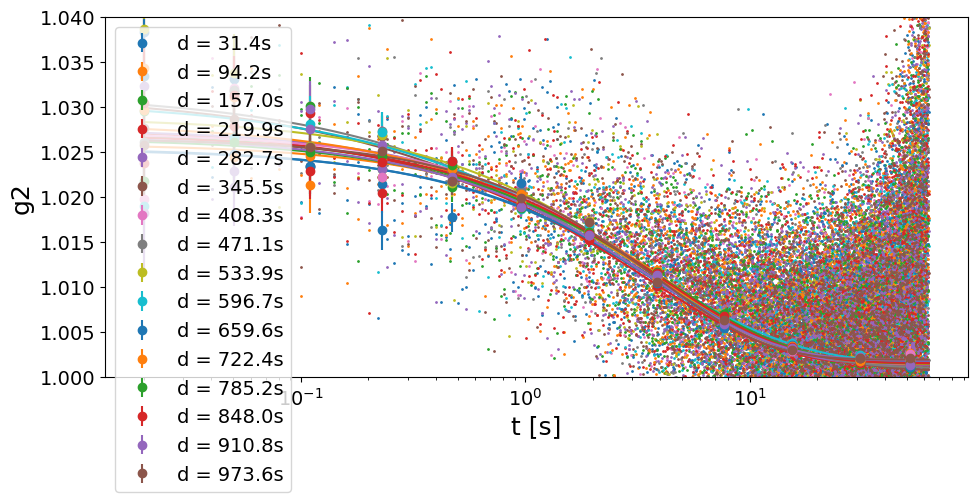

,Q,dQ,tau,dtau,dtau%,beta,dbeta,dbeta%,c,dc,dc%,y0,dy0,dy%,redchi2
tw,,,,,,,,,,,,,,,
31.4,0.21,0.01,4.032017,0.536770,13.312694,0.782606,0.100336,12.820779,0.023929,0.002105,8.796664,1.001519,0.000304,0.030389,1.003384
94.2,0.21,0.01,4.434598,0.525551,11.851152,0.810994,0.098229,12.112114,0.024363,0.001966,8.070700,1.001541,0.000311,0.031009,1.008050
157.0,0.21,0.01,4.168037,0.554078,13.293509,0.734256,0.090436,12.316728,0.025879,0.002240,8.654057,1.001318,0.000347,0.034614,0.984069
219.9,0.21,0.01,3.457123,0.497299,14.384762,0.725572,0.090118,12.420314,0.026340,0.002369,8.993020,1.001338,0.000304,0.030331,1.031309
282.7,0.21,0.01,3.997724,0.478723,11.974887,0.774872,0.088410,11.409620,0.026171,0.002060,7.871352,1.001387,0.000297,0.029670,0.998851
345.5,0.21,0.01,3.230550,0.611244,18.920735,0.576986,0.079383,13.758212,0.030799,0.003355,10.893724,1.000703,0.000480,0.047931,1.037118
408.3,0.21,0.01,3.756373,0.423835,11.283082,0.836036,0.094812,11.340704,0.025180,0.001907,7.573446,1.001933,0.000254,0.025314,0.978787
471.1,0.21,0.01,3.073317,0.539159,17.543228,0.609899,0.078245,12.829176,0.030594,0.003093,10.110626,1.001031,0.000394,0.039315,1.012536
533.9,0.21,0.01,3.540997,0.449344,12.689750,0.766078,0.088456,11.546650,0.027051,0.002202,8.141673,1.001784,0.000281,0.028066,1.020310


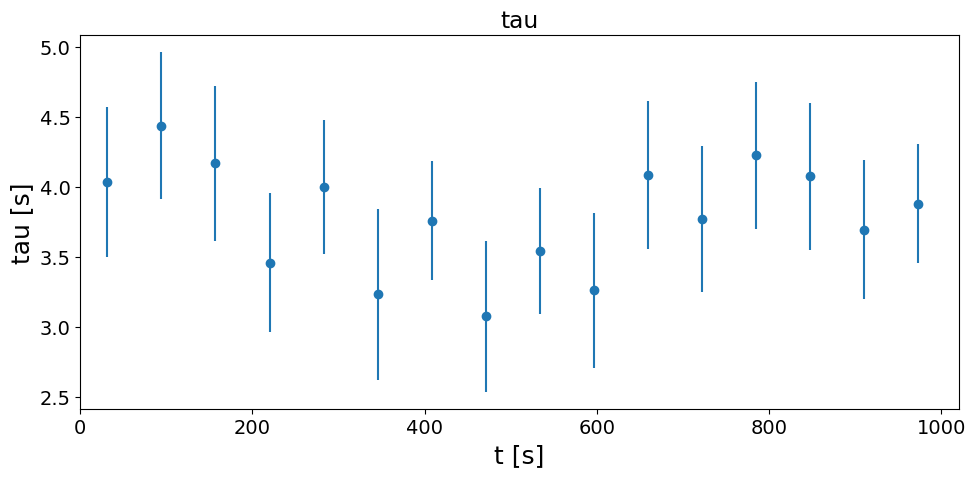

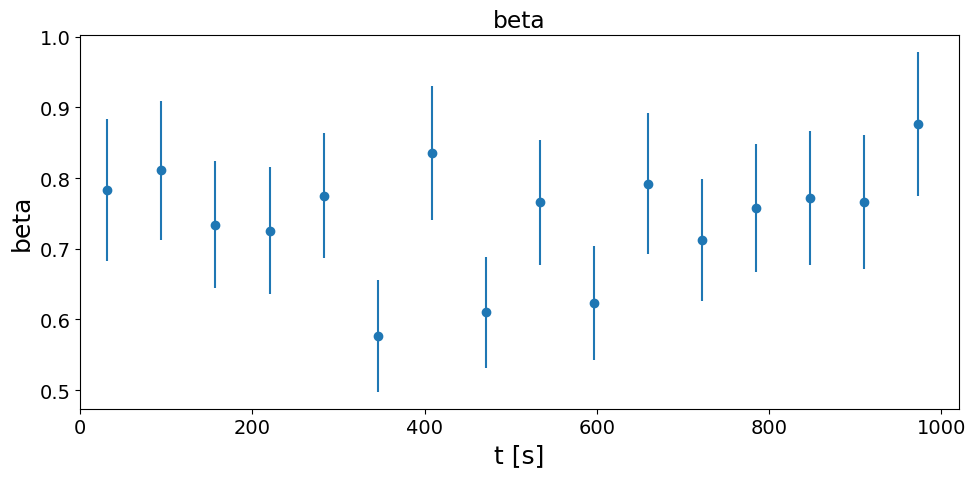

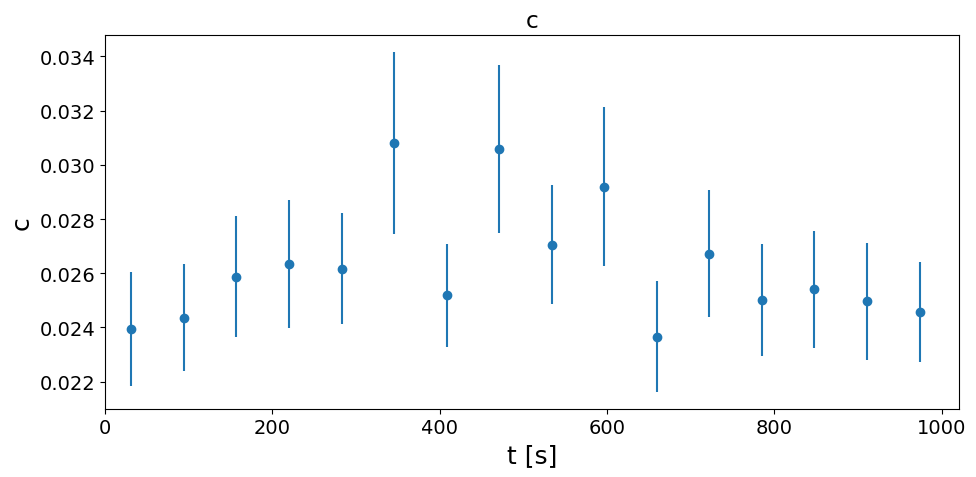

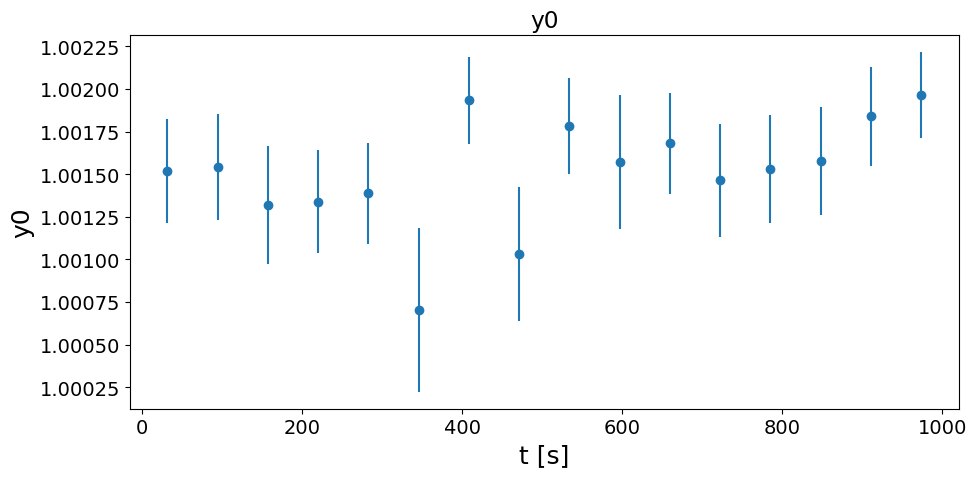

In [83]:
##################
t1_fit = 0
t2_fit = 1e100
##################

################# KKW MODEL #################
model = lm.Model(decorrelation_f)
params = lm.Parameters()
params.add('tau', value=1, min=0, max=10)
params.add('beta', value=1, min=0, max=2)
params.add('c', value=.03, min=0, max=.1)
params.add('y0', value=1, min=1, max=1.01)
#params.add('y0', value=1.015, vary=False)
##############################################

plotfit_bydose(itime, Lbin, g2, t1_fit, t2_fit)

### Linear correlation of damaged-vGeO2

In [84]:
G2t = XPCS.get_G2t(e4m_data, mask=None, Nfi=5000, Nff=None, Lbin=None)

g2 = np.vstack(XPCS.get_g2(itime, G2t))
np.savetxt(f"{g24damaged_vGeO2_folder}g2-{sample_name}_{str(Ndataset).zfill(4)}_{str(Nscan).zfill(4)}-Q={Q_notebook}-dQ={dQ_notebook}.txt", g2)

Loading frames ...
Done! (elapsed time = 1.12 s)
Computing G2t (using MKL library)...
Done! (elapsed time = 10.15 s)
	 | 54999 X 54999 squared matrix
	 | memory usage (np.array @ float32) = 11.269 GB
Normalizing G2t (using NumExpr library)...
Done! (elapsed time = 1.44 s)

Computing g2 (using cython code)...
Done! (elapsed time = 2.38 s)



Using Global variables: model, params, Q_notebook, dQ_notebook, sample_name, Ndataset, Nscan


,Q,dQ,tau,dtau,dtau%,beta,dbeta,dbeta%,c,dc,dc%,y0,dy0,dy%,redchi2
0,0.21,0.01,3.635474,0.115745,3.183756,0.708906,0.014947,2.108398,0.027172,0.000479,1.761763,1.001497,0.000011,0.001108,0.99952


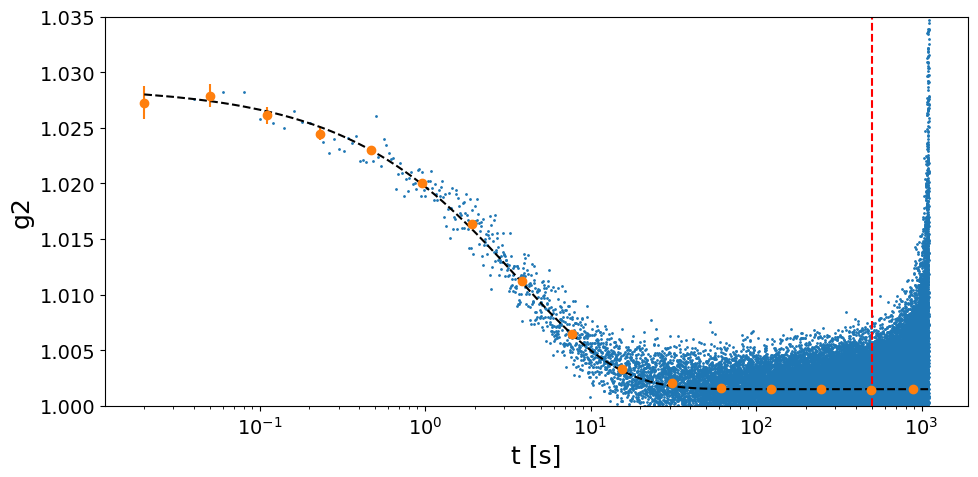

In [ ]:
##################
t1_fit = None
t2_fit = 1e2
##################

################# KKW MODEL #################
model = lm.Model(decorrelation_f)
params = lm.Parameters()
params.add('tau', value=1, min=0, max=10)
params.add('beta', value=1, min=0, max=2)
params.add('c', value=.03, min=0, max=.1)
params.add('y0', value=1, min=1, max=1.01)
#params.add('y0', value=1.015, vary=False)
##############################################

plotfit_4damaged_vGeO2(itime, g2, t1_fit, t2_fit)

plt.ylim(1, 1.035)
plt.tight_layout(); plt.show()

## XPCS scan: T=310C, Q=0.19, 20min @ 20ms (60000fm) (GeO2_6, dataset 1, scan 1) 

In [86]:
#######################################
sample_name = 'GeO2_6_310C'
Ndataset = 1
Nscan = 3
Nfi, Nff = None, None
Nfi, Nff = 1, None
load_mask = e4m_mask * e4m_htmask * bs_mask * Qmask # Put None for profile analysis!
#######################################

scan = ID10.load_scan(RAW_folder, sample_name, Ndataset, Nscan)
Ei = scan['monoe']
itime = scan['fast_timer_period'][0]
theta = scan['delcoup']
Q = round(XPCS.theta2Q(Ei,  theta),2)

print('#############################')
print('command =', scan['command'])
print('Ei =', Ei)
print('itime =', itime)
print('theta =', theta)
print('Q =', Q)
print('T = {:.2f} min'.format(len(scan['fast_timer_period'])*itime/60))   
print('#############################\n')

e4m_data = ID10.load_sparse_e4m(RAW_folder, sample_name, Ndataset, Nscan, Nfi, Nff,  n_jobs=20, load_mask=load_mask)
e4m_data = COSMIC.fast_gamma_filter(e4m_data, Imaxth_high=4)

#############################
command = mtimescan 0.02 1 60000
Ei = 9.699998837562536
itime = 0.020101
theta = 1.7500000000000004
Q = 0.15
T = 20.10 min
#############################

Loading sparse array ...
	 -> loading file eiger4m_v2_sparse_frame_0_00000.h5 (1/12 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00001.h5 (2/12 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00002.h5 (3/12 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00003.h5 (4/12 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00004.h5 (5/12 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00005.h5 (6/12 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00006.h5 (7/12 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00007.h5 (8/12 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00008.h5 (9/12 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00009.h5 (10/12 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00010.h5 (11/12 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00011.h5 (12/12 loo

### Flux check

################################################################################
Maximum count in the whole run -> 4.0
# of pixels above Ith_high treshold ->  3929289 pixels (of 4471016 => 87.88 %)
# of pixels below Ith_low treshold ->  917 pixels (of 4471016 => 0.02 %)
################################################################################



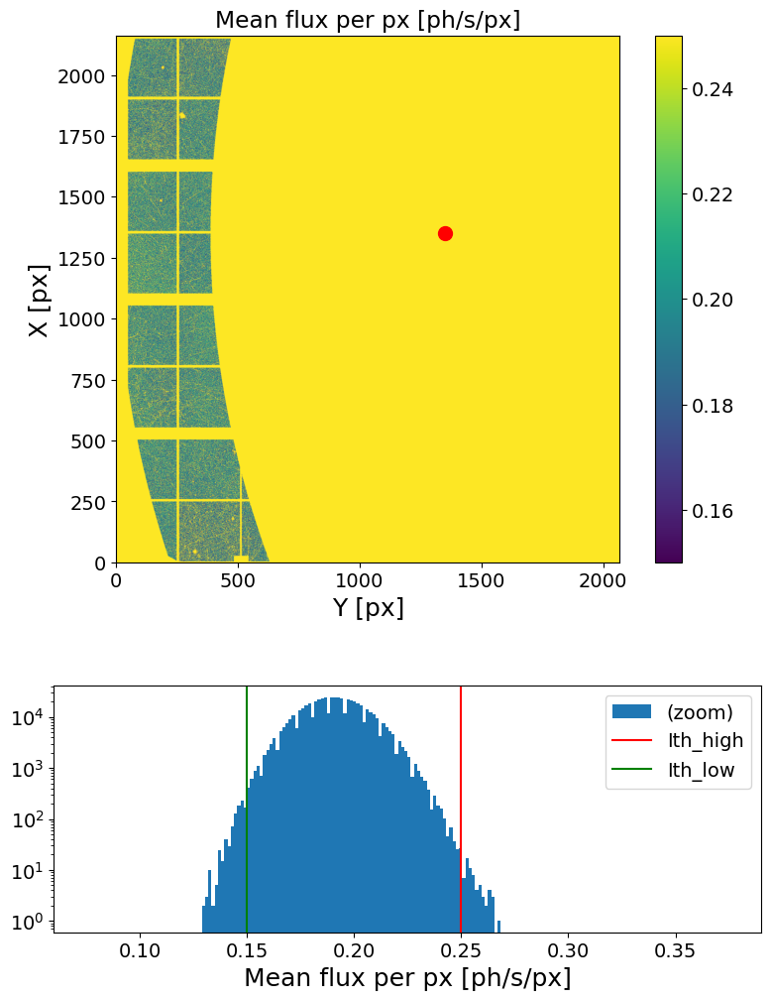

In [87]:
XPCS.gen_plots4mask(e4m_data, itime, Ith_low=.15, Ith_high=.25, Nff=None, load_mask=load_mask)

### Intensity analysis

In [88]:
####################
Lbin = 100
Nstep = 100
mask = None #e4m_mask*e4m_htmask*bs_mask*Qmask
####################

It = np.vstack(XPCS.get_It(e4m_data, itime, mask=mask, Lbin=Lbin, Nstep=Nstep))
np.savetxt(f"{Intensity_folder}Idt-{sample_name}_{str(Ndataset).zfill(4)}_{str(Nscan).zfill(4)}-Q={Q_notebook}-dQ={dQ_notebook}.txt", It)

<SecondaryAxis: >

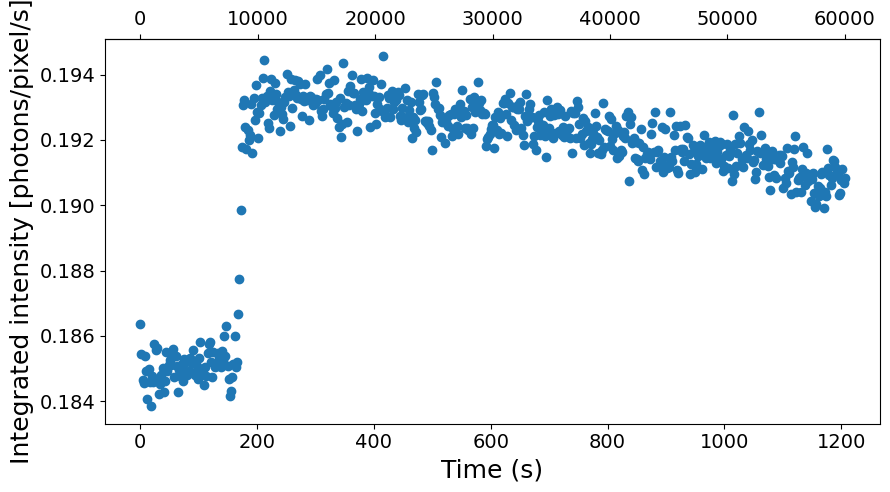

In [89]:
plt.figure(figsize=(10,5))
plt.scatter(It[0], It[1], label='It')
plt.xlabel('Time (s)')
plt.ylabel('Integrated intensity [photons/pixel/s]')
plt.gca().secondary_xaxis('top', functions=(lambda x: x/itime, lambda x: x*itime))
#plt.xlim(0, 3000)

### Linear Correlation by Dose

In [90]:
###################
Nfi = None
Nff = 50_000
Lbin = 1
mask = None #e4m_mask * e4m_htmask * bs_mask * Qmask
###################
if Lbin is None: Lbin=1

G2t = XPCS.get_G2t(e4m_data, mask=mask, Nfi=Nfi, Nff=Nff, Lbin=None)

Loading frames ...
Done! (elapsed time = 1.7 s)
Computing G2t (using MKL library)...
Done! (elapsed time = 9.24 s)
	 | 50000 X 50000 squared matrix
	 | memory usage (np.array @ float32) = 9.313 GB
Normalizing G2t (using NumExpr library)...
Done! (elapsed time = 1.21 s)



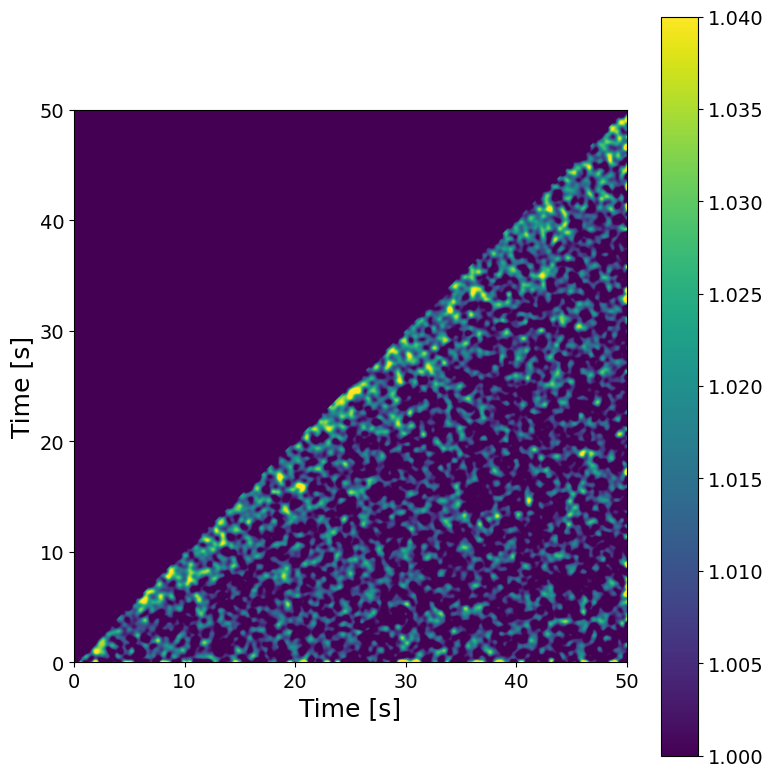

In [91]:
############################
t1, t2 = 0, 50
vmin, vmax = 1.0, 1.04
############################
XPCS.plot_G2t(G2t, vmin, vmax, itime=itime, t1=t1, t2=t2, sigma_filter=10)

In [92]:
################
Nbunch = 16
################

NfXbunch = int(G2t.shape[0]/Nbunch)
g2 = {}
for n in range(Nbunch):
    t_bunch = round(itime*Lbin*NfXbunch*(n+1/2),1)
    g2[t_bunch] = np.vstack(XPCS.get_g2(itime*Lbin, np.array(G2t[NfXbunch*n:NfXbunch*(n+1), NfXbunch*n:NfXbunch*(n+1)])))

Computing g2 (using cython code)...
Done! (elapsed time = 0.03 s)

Computing g2 (using cython code)...
Done! (elapsed time = 0.02 s)

Computing g2 (using cython code)...
Done! (elapsed time = 0.02 s)

Computing g2 (using cython code)...
Done! (elapsed time = 0.02 s)

Computing g2 (using cython code)...
Done! (elapsed time = 0.02 s)

Computing g2 (using cython code)...
Done! (elapsed time = 0.02 s)

Computing g2 (using cython code)...
Done! (elapsed time = 0.02 s)

Computing g2 (using cython code)...
Done! (elapsed time = 0.02 s)

Computing g2 (using cython code)...
Done! (elapsed time = 0.02 s)

Computing g2 (using cython code)...
Done! (elapsed time = 0.02 s)

Computing g2 (using cython code)...
Done! (elapsed time = 0.02 s)

Computing g2 (using cython code)...
Done! (elapsed time = 0.02 s)

Computing g2 (using cython code)...
Done! (elapsed time = 0.02 s)

Computing g2 (using cython code)...
Done! (elapsed time = 0.02 s)

Computing g2 (using cython code)...
Done! (elapsed time = 0.02

Using Global variables: Nbunch, model, params, Q_notebook, dQ_notebook, sample_name, Ndataset, Nscan


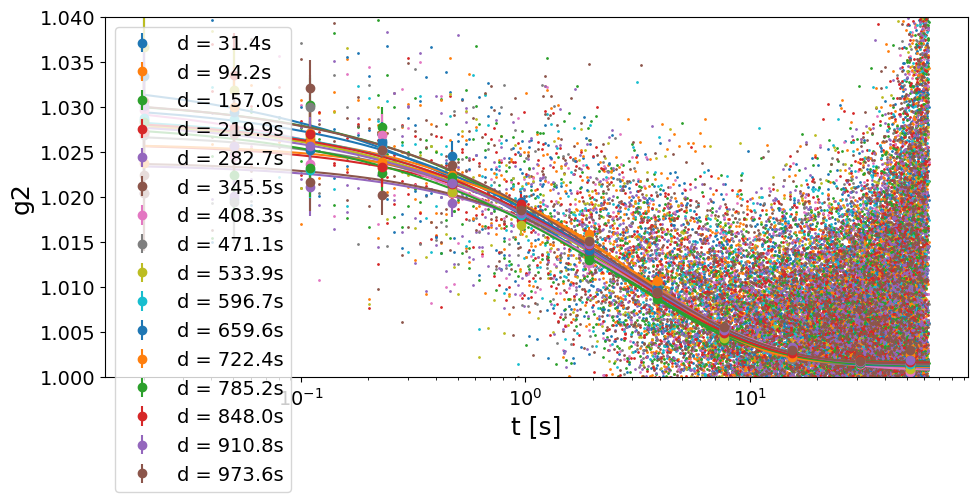

,Q,dQ,tau,dtau,dtau%,beta,dbeta,dbeta%,c,dc,dc%,y0,dy0,dy%,redchi2
tw,,,,,,,,,,,,,,,
31.4,0.21,0.01,2.066565,0.509276,24.643604,0.562726,0.083591,14.854690,0.032720,0.004195,12.821864,1.000958,0.000375,0.037464,1.017225
94.2,0.21,0.01,3.282929,0.509820,15.529432,0.717626,0.093806,13.071713,0.027304,0.002617,9.586425,1.001137,0.000319,0.031868,1.020626
157.0,0.21,0.01,2.321966,0.404010,17.399474,0.703136,0.092729,13.187916,0.029256,0.002978,10.180133,1.001727,0.000263,0.026209,1.008666
219.9,0.21,0.01,3.288063,0.473257,14.393201,0.811793,0.110435,13.603897,0.024411,0.002292,9.389901,1.001619,0.000269,0.026814,1.118207
282.7,0.21,0.01,3.954130,0.523471,13.238588,0.818391,0.108113,13.210404,0.022177,0.001967,8.871385,1.001517,0.000276,0.027577,0.976770
345.5,0.21,0.01,3.631517,0.487619,13.427430,0.844850,0.114311,13.530358,0.022240,0.002007,9.025451,1.001706,0.000258,0.025741,1.019174
408.3,0.21,0.01,2.470728,0.593250,24.011136,0.550321,0.083633,15.197034,0.030463,0.003899,12.798412,1.000772,0.000433,0.043243,0.994232
471.1,0.21,0.01,3.073686,0.452591,14.724698,0.751287,0.095424,12.701425,0.025913,0.002378,9.176225,1.001308,0.000268,0.026718,0.977483
533.9,0.21,0.01,2.708529,0.483858,17.864233,0.676839,0.091711,13.549833,0.027368,0.002859,10.448384,1.001557,0.000297,0.029657,1.012808


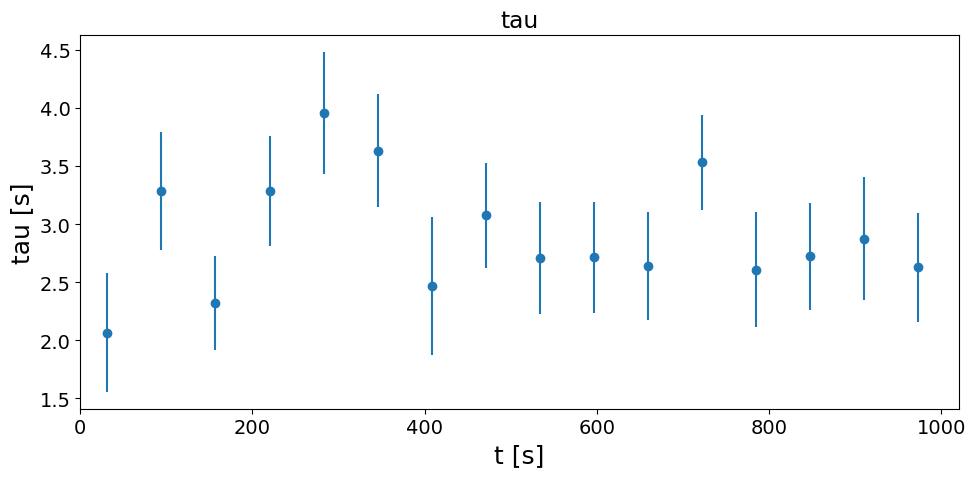

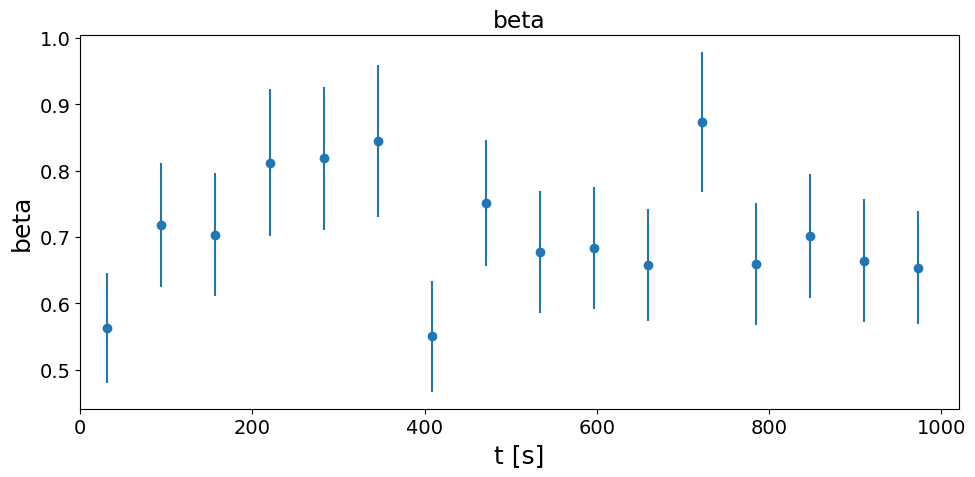

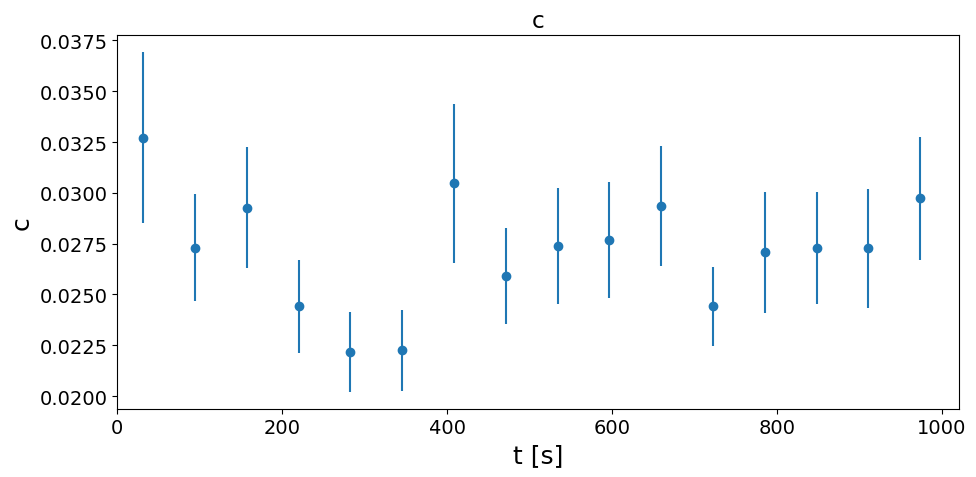

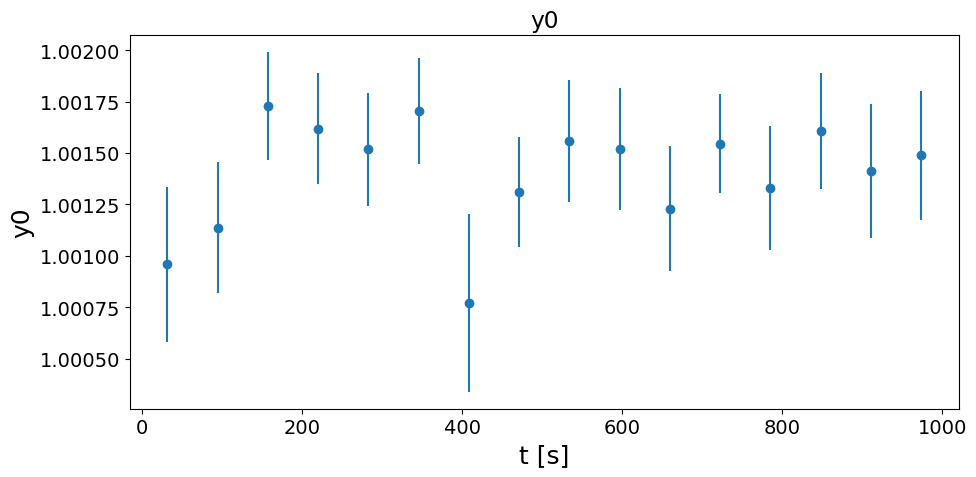

In [93]:
##################
t1_fit = 0
t2_fit = 1e100
##################

################# KKW MODEL #################
model = lm.Model(decorrelation_f)
params = lm.Parameters()
params.add('tau', value=1, min=0, max=10)
params.add('beta', value=1, min=0, max=2)
params.add('c', value=.03, min=0, max=.1)
params.add('y0', value=1, min=1, max=1.01)
#params.add('y0', value=1.015, vary=False)
##############################################

plotfit_bydose(itime, Lbin, g2, t1_fit, t2_fit)

### Linear correlation of damaged-vGeO2

In [94]:
G2t = XPCS.get_G2t(e4m_data, mask=None, Nfi=None, Nff=None, Lbin=None)

g2 = np.vstack(XPCS.get_g2(itime, G2t))
np.savetxt(f"{g24damaged_vGeO2_folder}g2-{sample_name}_{str(Ndataset).zfill(4)}_{str(Nscan).zfill(4)}-Q={Q_notebook}-dQ={dQ_notebook}.txt", g2)

Loading frames ...
Done! (elapsed time = 0.0 s)
Computing G2t (using MKL library)...
Done! (elapsed time = 11.25 s)
	 | 59999 X 59999 squared matrix
	 | memory usage (np.array @ float32) = 13.411 GB
Normalizing G2t (using NumExpr library)...
Done! (elapsed time = 1.66 s)

Computing g2 (using cython code)...
Done! (elapsed time = 2.91 s)



Using Global variables: model, params, Q_notebook, dQ_notebook, sample_name, Ndataset, Nscan


,Q,dQ,tau,dtau,dtau%,beta,dbeta,dbeta%,c,dc,dc%,y0,dy0,dy%,redchi2
0,0.21,0.01,2.878277,0.104638,3.635449,0.702533,0.016607,2.36389,0.02701,0.00054,1.998375,1.001475,0.000011,0.001074,1.005269


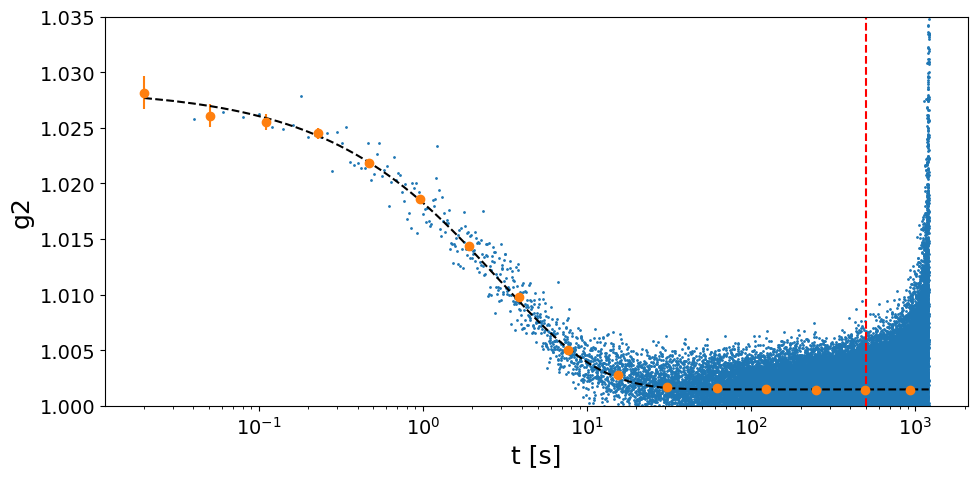

In [95]:
##################
t1_fit = None
t2_fit = 5e2
##################

################# KKW MODEL #################
model = lm.Model(decorrelation_f)
params = lm.Parameters()
params.add('tau', value=1, min=0, max=10)
params.add('beta', value=1, min=0, max=2)
params.add('c', value=.03, min=0, max=.1)
params.add('y0', value=1, min=1, max=1.01)
#params.add('y0', value=1.015, vary=False)
##############################################

plotfit_4damaged_vGeO2(itime, g2, t1_fit, t2_fit)

plt.ylim(1, 1.035)
plt.tight_layout(); plt.show()

##  XPCS scan: T=380C, Q=0.19, 20min@20ms (60000fm) (GeO2_6, dataset 1, scan 1)

In [96]:
#######################################
sample_name = 'GeO2_6_380C'
Ndataset = 1
Nscan = 1
Nfi, Nff = 1, None
load_mask = e4m_mask * e4m_htmask * bs_mask * Qmask # Put None for profile analysis!
#######################################

scan = ID10.load_scan(RAW_folder, sample_name, Ndataset, Nscan)
Ei = scan['monoe']
itime = scan['fast_timer_period'][0]
theta = scan['delcoup']
Q = round(XPCS.theta2Q(Ei,  theta),2)

print('#############################')
print('command =', scan['command'])
print('Ei =', Ei)
print('itime =', itime)
print('theta =', theta)
print('Q =', Q)
print('T = {:.2f} min'.format(len(scan['fast_timer_period'])*itime/60))   
print('#############################\n')

e4m_data = ID10.load_sparse_e4m(RAW_folder, sample_name, Ndataset, Nscan, Nfi, Nff,  n_jobs=20, load_mask=load_mask)
e4m_data = COSMIC.fast_gamma_filter(e4m_data, Imaxth_high=4)

#############################
command = mtimescan 0.02 1 60000
Ei = 9.699998837562536
itime = 0.020101
theta = 1.7500000000000004
Q = 0.15
T = 20.10 min
#############################

Loading sparse array ...
	 -> loading file eiger4m_v2_sparse_frame_0_00000.h5 (1/12 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00001.h5 (2/12 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00002.h5 (3/12 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00003.h5 (4/12 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00004.h5 (5/12 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00005.h5 (6/12 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00006.h5 (7/12 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00007.h5 (8/12 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00008.h5 (9/12 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00009.h5 (10/12 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00010.h5 (11/12 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00011.h5 (12/12 loo

### Flux check

################################################################################
Maximum count in the whole run -> 4.0
# of pixels above Ith_high treshold ->  3929243 pixels (of 4471016 => 87.88 %)
# of pixels below Ith_low treshold ->  2142 pixels (of 4471016 => 0.05 %)
################################################################################



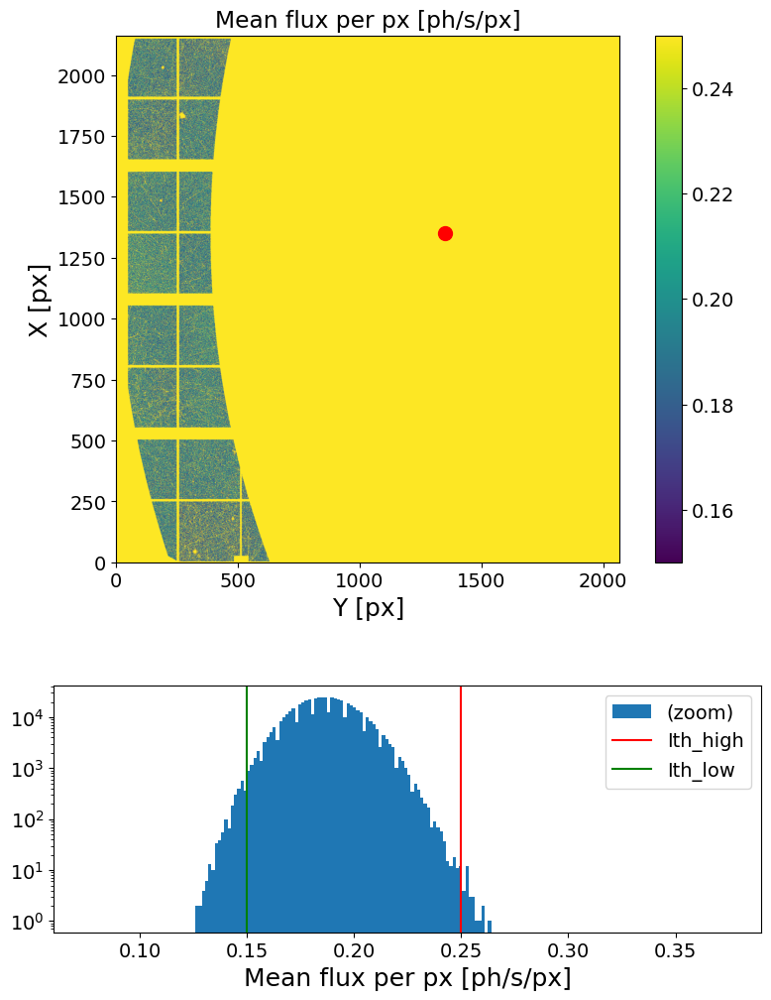

In [97]:
XPCS.gen_plots4mask(e4m_data, itime, Ith_low=.15, Ith_high=.25, Nff=None, load_mask=load_mask)

### Intensity analysis

In [98]:
####################
Lbin = 100
Nstep = 100
mask = None #e4m_mask*e4m_htmask*bs_mask*Qmask
####################

It = np.vstack(XPCS.get_It(e4m_data, itime, mask=mask, Lbin=Lbin, Nstep=Nstep))
np.savetxt(f"{Intensity_folder}Idt-{sample_name}_{str(Ndataset).zfill(4)}_{str(Nscan).zfill(4)}-Q={Q_notebook}-dQ={dQ_notebook}.txt", It)

<SecondaryAxis: >

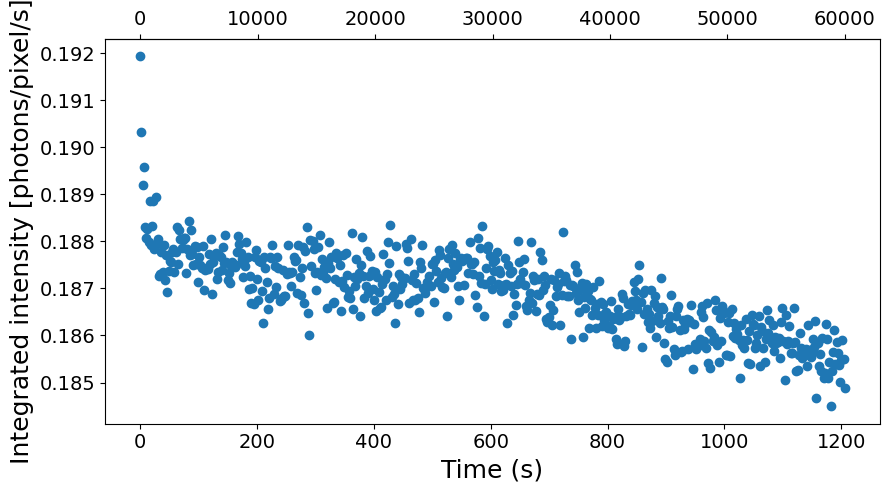

In [99]:
plt.figure(figsize=(10,5))
plt.scatter(It[0], It[1], label='It')
plt.xlabel('Time (s)')
plt.ylabel('Integrated intensity [photons/pixel/s]')
plt.gca().secondary_xaxis('top', functions=(lambda x: x/itime, lambda x: x*itime))
#plt.xlim(0, 3000)

### Linear Correlation by Dose

In [100]:
###################
Nfi = None
Nff = 50_000
Lbin = 1
mask = None #e4m_mask * e4m_htmask * bs_mask * Qmask
###################
if Lbin is None: Lbin=1

G2t = XPCS.get_G2t(e4m_data, mask=mask, Nfi=Nfi, Nff=Nff, Lbin=None)

Loading frames ...
Done! (elapsed time = 1.11 s)
Computing G2t (using MKL library)...
Done! (elapsed time = 8.8 s)
	 | 50000 X 50000 squared matrix
	 | memory usage (np.array @ float32) = 9.313 GB
Normalizing G2t (using NumExpr library)...
Done! (elapsed time = 1.17 s)



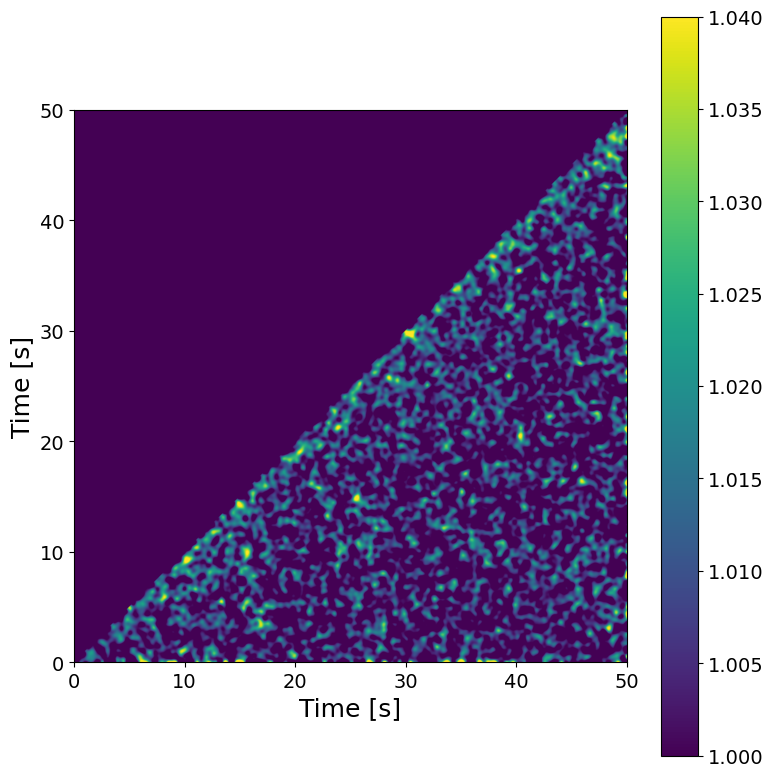

In [101]:
############################
t1, t2 = 0, 50
vmin, vmax = 1.0, 1.04
############################
XPCS.plot_G2t(G2t, vmin, vmax, itime=itime, t1=t1, t2=t2, sigma_filter=10)

In [102]:
################
Nbunch = 16
################

NfXbunch = int(G2t.shape[0]/Nbunch)
g2 = {}
for n in range(Nbunch):
    t_bunch = round(itime*Lbin*NfXbunch*(n+1/2),1)
    g2[t_bunch] = np.vstack(XPCS.get_g2(itime*Lbin, np.array(G2t[NfXbunch*n:NfXbunch*(n+1), NfXbunch*n:NfXbunch*(n+1)])))

Computing g2 (using cython code)...
Done! (elapsed time = 0.03 s)

Computing g2 (using cython code)...
Done! (elapsed time = 0.02 s)

Computing g2 (using cython code)...
Done! (elapsed time = 0.02 s)

Computing g2 (using cython code)...
Done! (elapsed time = 0.01 s)

Computing g2 (using cython code)...
Done! (elapsed time = 0.02 s)

Computing g2 (using cython code)...
Done! (elapsed time = 0.03 s)

Computing g2 (using cython code)...
Done! (elapsed time = 0.02 s)

Computing g2 (using cython code)...
Done! (elapsed time = 0.02 s)

Computing g2 (using cython code)...
Done! (elapsed time = 0.02 s)

Computing g2 (using cython code)...
Done! (elapsed time = 0.02 s)

Computing g2 (using cython code)...
Done! (elapsed time = 0.02 s)

Computing g2 (using cython code)...
Done! (elapsed time = 0.02 s)

Computing g2 (using cython code)...
Done! (elapsed time = 0.02 s)

Computing g2 (using cython code)...
Done! (elapsed time = 0.02 s)

Computing g2 (using cython code)...
Done! (elapsed time = 0.02

Using Global variables: Nbunch, model, params, Q_notebook, dQ_notebook, sample_name, Ndataset, Nscan


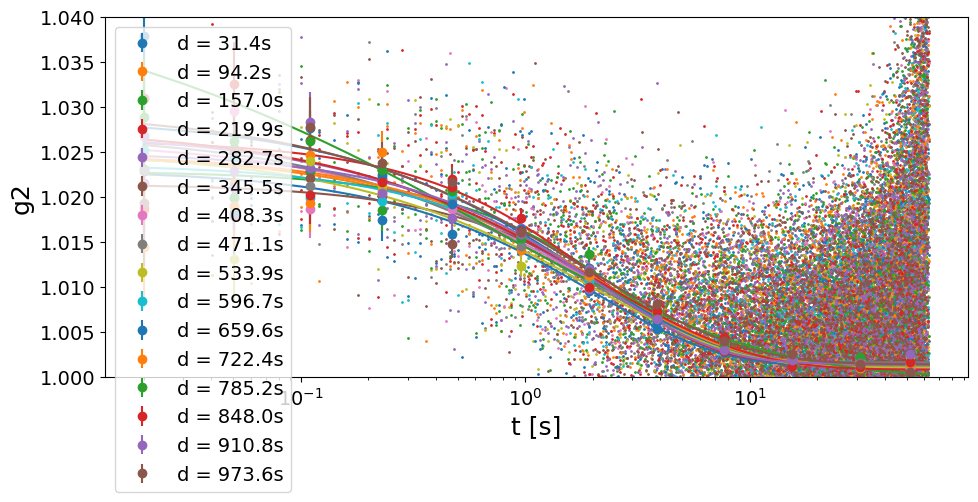

,Q,dQ,tau,dtau,dtau%,beta,dbeta,dbeta%,c,dc,dc%,y0,dy0,dy%,redchi2
tw,,,,,,,,,,,,,,,
31.4,0.21,0.01,2.061429,0.433150,21.012111,0.790935,0.141433,17.881696,0.021794,0.002838,13.021305,1.001288,0.000226,0.022535,1.054738
94.2,0.21,0.01,2.349184,0.470889,20.044787,0.742114,0.119787,16.141391,0.023319,0.002819,12.086783,1.001468,0.000249,0.024899,1.027179
157.0,0.21,0.01,2.743040,0.383613,13.984945,0.957075,0.149609,15.631948,0.021227,0.002087,9.831856,1.001646,0.000217,0.021644,1.040594
219.9,0.21,0.01,2.201938,0.315247,14.316796,0.895522,0.128706,14.372186,0.024712,0.002370,9.590968,1.001619,0.000204,0.020411,0.966441
282.7,0.21,0.01,1.978665,0.435764,22.023125,0.675930,0.104768,15.499825,0.026018,0.003241,12.456231,1.001227,0.000250,0.024934,0.956663
345.5,0.21,0.01,2.793736,0.423096,15.144441,0.920270,0.148571,16.144250,0.019894,0.002074,10.423603,1.001573,0.000216,0.021535,0.968958
408.3,0.21,0.01,2.087867,0.485960,23.275421,0.671125,0.110506,16.465841,0.025322,0.003332,13.159754,1.001005,0.000271,0.027101,1.050200
471.1,0.21,0.01,1.834494,0.470277,25.635231,0.645621,0.109377,16.941374,0.025772,0.003622,14.055432,1.001361,0.000264,0.026374,1.014000
533.9,0.21,0.01,2.002507,0.501140,25.025652,0.669212,0.116972,17.479050,0.024149,0.003401,14.084642,1.001078,0.000266,0.026563,1.046599


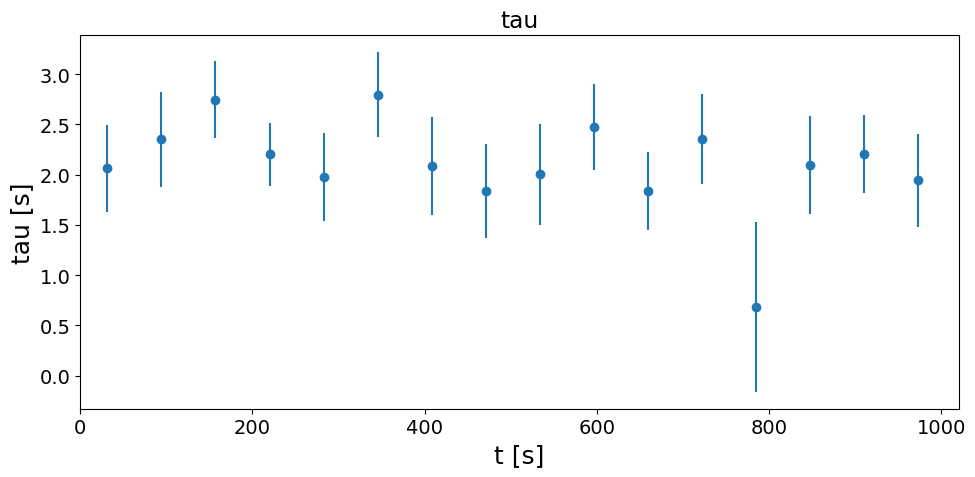

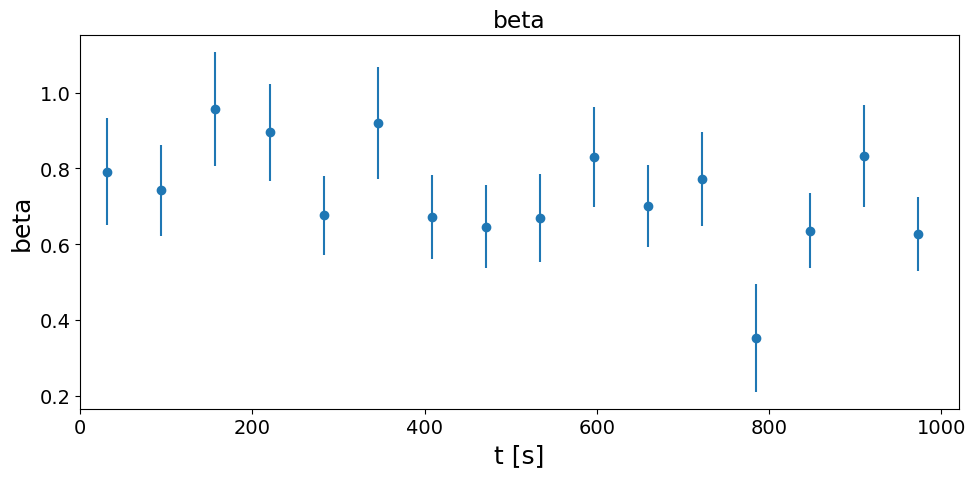

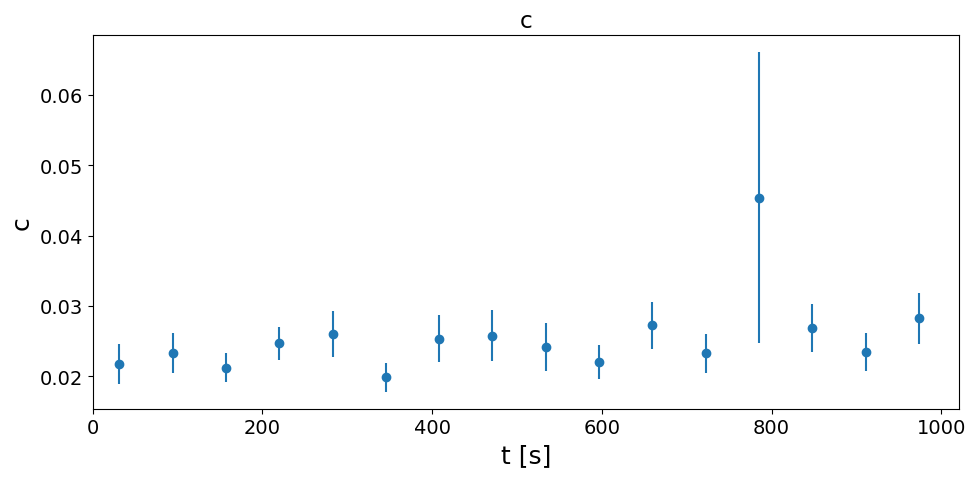

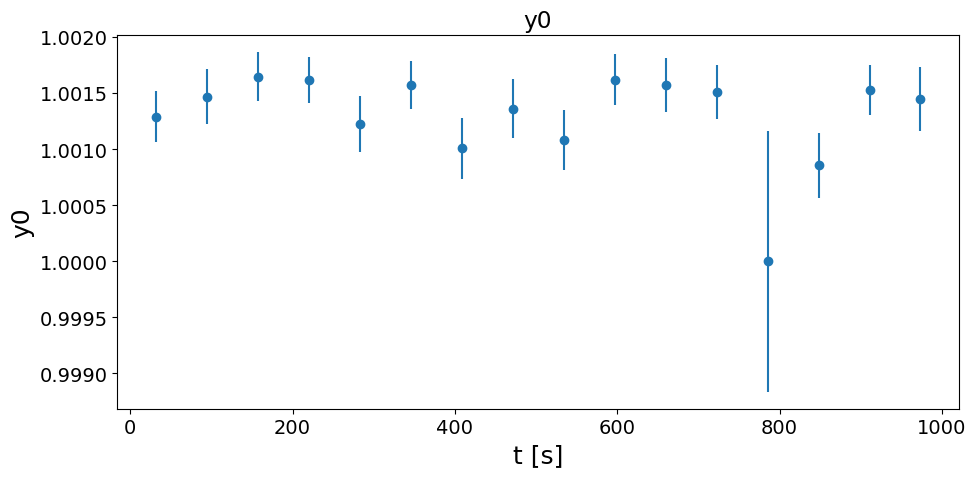

In [103]:
##################
t1_fit = 0
t2_fit = 1e100
##################

################# KKW MODEL #################
model = lm.Model(decorrelation_f)
params = lm.Parameters()
params.add('tau', value=1, min=0, max=10)
params.add('beta', value=1, min=0, max=2)
params.add('c', value=.03, min=0, max=.1)
params.add('y0', value=1, min=1, max=1.01)
#params.add('y0', value=1.015, vary=False)
##############################################

plotfit_bydose(itime, Lbin, g2, t1_fit, t2_fit)

### Linear correlation of damaged-vGeO2

In [104]:
G2t = XPCS.get_G2t(e4m_data, mask=None, Nfi=5000, Nff=None, Lbin=None)

g2 = np.vstack(XPCS.get_g2(itime, G2t))
np.savetxt(f"{g24damaged_vGeO2_folder}g2-{sample_name}_{str(Ndataset).zfill(4)}_{str(Nscan).zfill(4)}-Q={Q_notebook}-dQ={dQ_notebook}.txt", g2)

Loading frames ...
Done! (elapsed time = 1.49 s)
Computing G2t (using MKL library)...
Done! (elapsed time = 10.21 s)
	 | 54999 X 54999 squared matrix
	 | memory usage (np.array @ float32) = 11.269 GB
Normalizing G2t (using NumExpr library)...
Done! (elapsed time = 1.44 s)

Computing g2 (using cython code)...
Done! (elapsed time = 2.88 s)



Using Global variables: model, params, Q_notebook, dQ_notebook, sample_name, Ndataset, Nscan


,Q,dQ,tau,dtau,dtau%,beta,dbeta,dbeta%,c,dc,dc%,y0,dy0,dy%,redchi2
0,0.21,0.01,2.161081,0.102689,4.75174,0.715974,0.022674,3.166871,0.02492,0.000659,2.645946,1.001458,0.000012,0.001149,1.00195


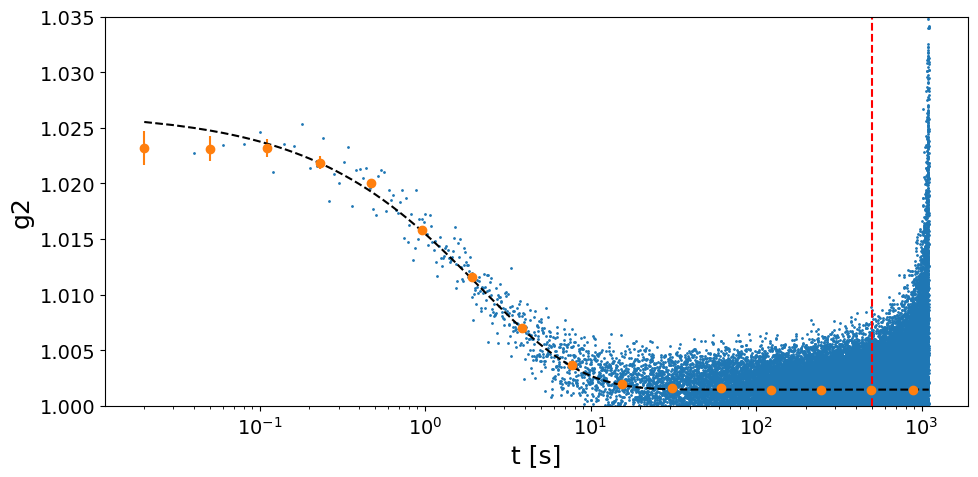

In [105]:
##################
t1_fit = None
t2_fit = 5e2
##################

################# KKW MODEL #################
model = lm.Model(decorrelation_f)
params = lm.Parameters()
params.add('tau', value=1, min=0, max=10)
params.add('beta', value=1, min=0, max=2)
params.add('c', value=.03, min=0, max=.1)
params.add('y0', value=1, min=1, max=1.01)
#params.add('y0', value=1.015, vary=False)
##############################################

plotfit_4damaged_vGeO2(itime, g2, t1_fit, t2_fit)

plt.ylim(1, 1.035)
plt.tight_layout(); plt.show()

##  XPCS scan:T=450 C, Q=0.19, 20min @ 20ms (60000fm) (GeO2_6, dataset 1, scan 1)

In [106]:
#######################################
sample_name = 'GeO2_6_450C'
Ndataset = 1
Nscan = 3
Nfi, Nff = 1, None
load_mask = e4m_mask * e4m_htmask * bs_mask * Qmask # Put None for profile analysis!
#######################################

scan = ID10.load_scan(RAW_folder, sample_name, Ndataset, Nscan)
Ei = scan['monoe']
itime = scan['fast_timer_period'][0]
theta = scan['delcoup']
Q = round(XPCS.theta2Q(Ei,  theta),2)

print('#############################')
print('command =', scan['command'])
print('Ei =', Ei)
print('itime =', itime)
print('theta =', theta)
print('Q =', Q)
print('T = {:.2f} min'.format(len(scan['fast_timer_period'])*itime/60))   
print('#############################\n')

e4m_data = ID10.load_sparse_e4m(RAW_folder, sample_name, Ndataset, Nscan, Nfi, Nff,  n_jobs=20, load_mask=load_mask)
e4m_data = COSMIC.fast_gamma_filter(e4m_data, Imaxth_high=4)

#############################
command = mtimescan 0.02 1 60000
Ei = 9.699998837562536
itime = 0.020101
theta = 1.7500000000000004
Q = 0.15
T = 20.10 min
#############################

Loading sparse array ...
	 -> loading file eiger4m_v2_sparse_frame_0_00000.h5 (1/12 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00001.h5 (2/12 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00002.h5 (3/12 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00003.h5 (4/12 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00004.h5 (5/12 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00005.h5 (6/12 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00006.h5 (7/12 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00007.h5 (8/12 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00008.h5 (9/12 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00009.h5 (10/12 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00010.h5 (11/12 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00011.h5 (12/12 loo

### Flux check

################################################################################
Maximum count in the whole run -> 3.0
# of pixels above Ith_high treshold ->  3929211 pixels (of 4471016 => 87.88 %)
# of pixels below Ith_low treshold ->  16535 pixels (of 4471016 => 0.37 %)
################################################################################



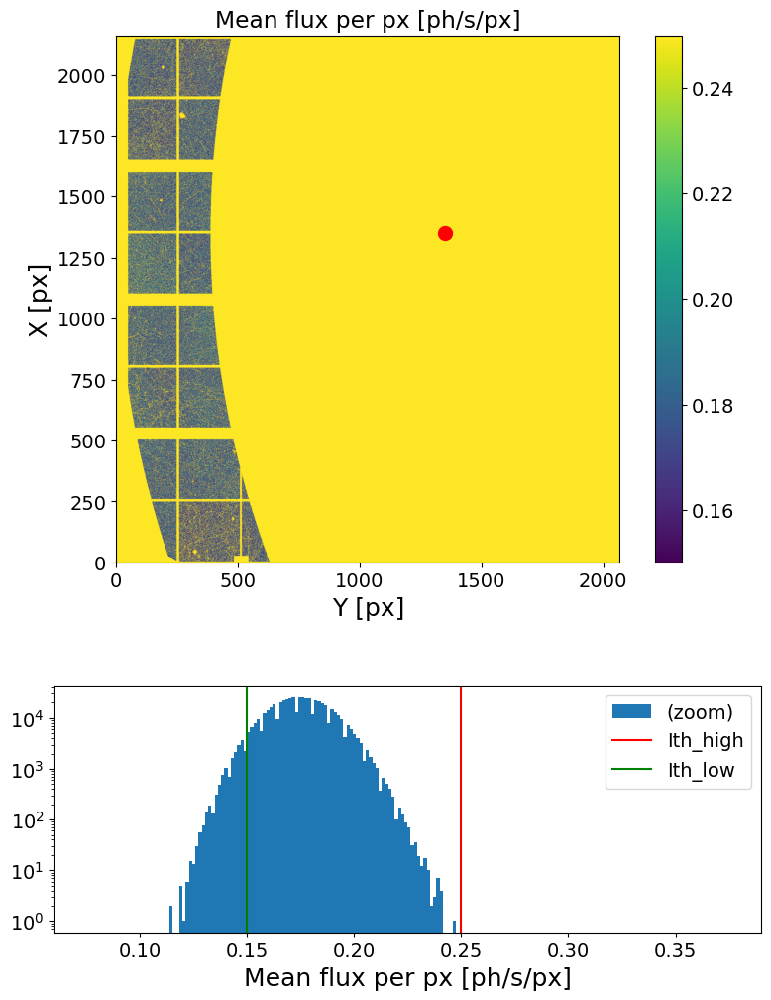

In [107]:
XPCS.gen_plots4mask(e4m_data, itime, Ith_low=.15, Ith_high=.25, Nff=None, load_mask=load_mask)

### Intensity analysis

In [108]:
####################
Lbin = 100
Nstep = 100
mask = None #e4m_mask*e4m_htmask*bs_mask*Qmask
####################

It = np.vstack(XPCS.get_It(e4m_data, itime, mask=mask, Lbin=Lbin, Nstep=Nstep))
np.savetxt(f"{Intensity_folder}Idt-{sample_name}_{str(Ndataset).zfill(4)}_{str(Nscan).zfill(4)}-Q={Q_notebook}-dQ={dQ_notebook}.txt", It)

<SecondaryAxis: >

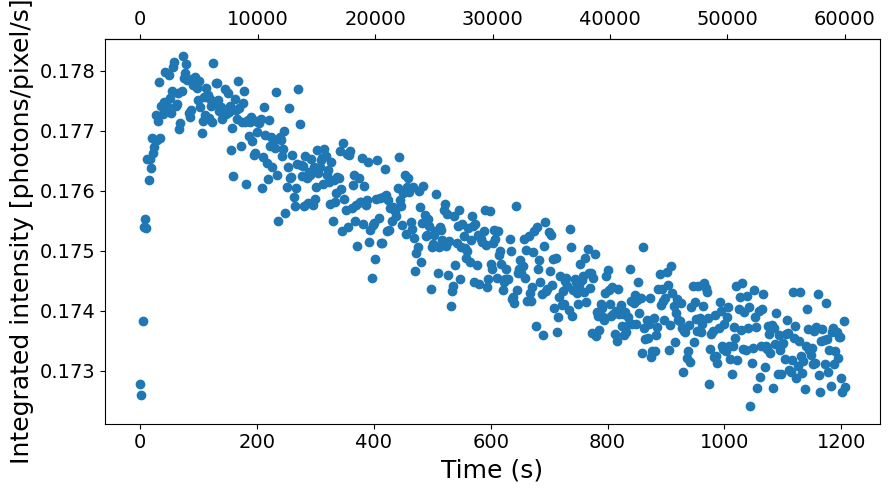

In [109]:
plt.figure(figsize=(10,5))
plt.scatter(It[0], It[1], label='It')
plt.xlabel('Time (s)')
plt.ylabel('Integrated intensity [photons/pixel/s]')
plt.gca().secondary_xaxis('top', functions=(lambda x: x/itime, lambda x: x*itime))
#plt.xlim(0, 3000)

### Linear Correlation by Dose

In [110]:
###################
Nfi = None
Nff = 50_000
Lbin = 1
mask = None #e4m_mask * e4m_htmask * bs_mask * Qmask
###################
if Lbin is None: Lbin=1

G2t = XPCS.get_G2t(e4m_data, mask=mask, Nfi=Nfi, Nff=Nff, Lbin=None)

Loading frames ...
Done! (elapsed time = 1.02 s)
Computing G2t (using MKL library)...
Done! (elapsed time = 7.97 s)
	 | 50000 X 50000 squared matrix
	 | memory usage (np.array @ float32) = 9.313 GB
Normalizing G2t (using NumExpr library)...
Done! (elapsed time = 1.14 s)



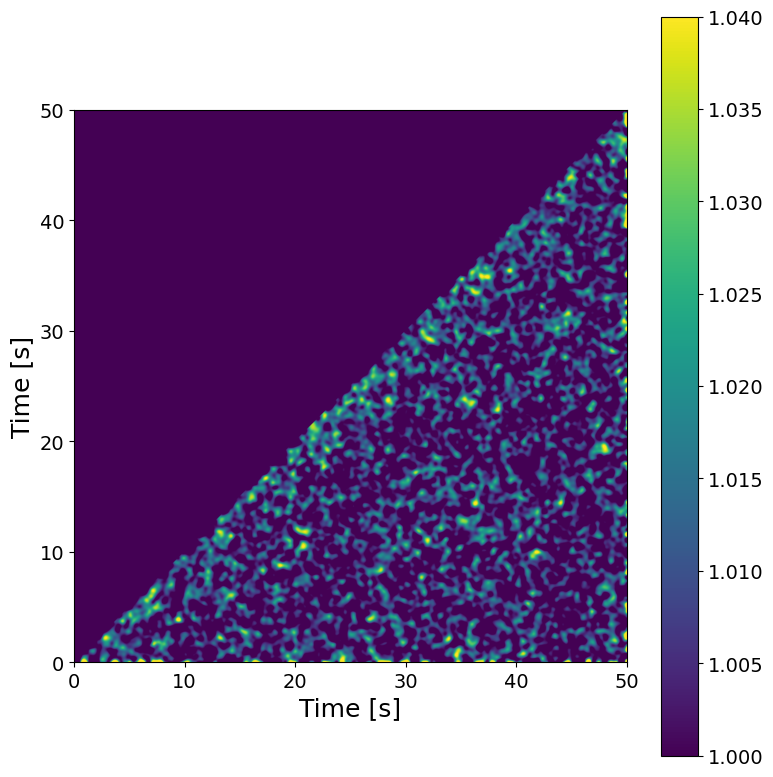

In [111]:
############################
t1, t2 = 0, 50
vmin, vmax = 1.0, 1.04
############################
XPCS.plot_G2t(G2t, vmin, vmax, itime=itime, t1=t1, t2=t2, sigma_filter=10)

In [112]:
################
Nbunch = 16
################

NfXbunch = int(G2t.shape[0]/Nbunch)
g2 = {}
for n in range(Nbunch):
    t_bunch = round(itime*Lbin*NfXbunch*(n+1/2),1)
    g2[t_bunch] = np.vstack(XPCS.get_g2(itime*Lbin, np.array(G2t[NfXbunch*n:NfXbunch*(n+1), NfXbunch*n:NfXbunch*(n+1)])))

Computing g2 (using cython code)...
Done! (elapsed time = 0.03 s)

Computing g2 (using cython code)...
Done! (elapsed time = 0.02 s)

Computing g2 (using cython code)...
Done! (elapsed time = 0.02 s)

Computing g2 (using cython code)...
Done! (elapsed time = 0.02 s)

Computing g2 (using cython code)...
Done! (elapsed time = 0.02 s)

Computing g2 (using cython code)...
Done! (elapsed time = 0.02 s)

Computing g2 (using cython code)...
Done! (elapsed time = 0.02 s)

Computing g2 (using cython code)...
Done! (elapsed time = 0.02 s)

Computing g2 (using cython code)...
Done! (elapsed time = 0.02 s)

Computing g2 (using cython code)...
Done! (elapsed time = 0.02 s)

Computing g2 (using cython code)...
Done! (elapsed time = 0.02 s)

Computing g2 (using cython code)...
Done! (elapsed time = 0.02 s)

Computing g2 (using cython code)...
Done! (elapsed time = 0.02 s)

Computing g2 (using cython code)...
Done! (elapsed time = 0.02 s)

Computing g2 (using cython code)...
Done! (elapsed time = 0.02

Using Global variables: Nbunch, model, params, Q_notebook, dQ_notebook, sample_name, Ndataset, Nscan


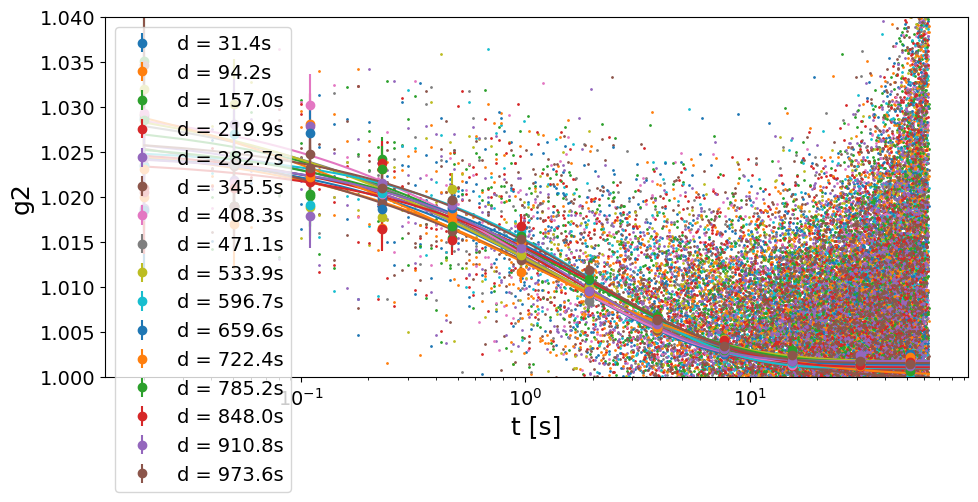

,Q,dQ,tau,dtau,dtau%,beta,dbeta,dbeta%,c,dc,dc%,y0,dy0,dy%,redchi2
tw,,,,,,,,,,,,,,,
31.4,0.21,0.01,1.611387,0.452025,28.051936,0.686152,0.133030,19.387852,0.024222,0.003825,15.791666,1.001309,0.000246,0.024547,1.012514
94.2,0.21,0.01,1.552770,0.517956,33.356883,0.612843,0.124020,20.236780,0.024930,0.004375,17.549652,1.001181,0.000280,0.028006,1.036351
157.0,0.21,0.01,1.466834,0.467020,31.838661,0.604461,0.113769,18.821596,0.027599,0.004572,16.564143,1.001333,0.000280,0.027917,1.039307
219.9,0.21,0.01,1.843740,0.489358,26.541588,0.673154,0.123593,18.360304,0.024857,0.003702,14.893023,1.000905,0.000268,0.026784,1.036071
282.7,0.21,0.01,1.473619,0.460720,31.264509,0.629358,0.121515,19.307795,0.026236,0.004370,16.654498,1.001192,0.000264,0.026380,1.024122
345.5,0.21,0.01,1.589309,2.460123,154.791992,0.489799,0.383227,78.241691,0.028504,0.020814,73.022182,1.000000,0.001650,0.164997,13.138601
408.3,0.21,0.01,1.208568,0.411244,34.027414,0.600451,0.115906,19.303156,0.029442,0.005138,17.451387,1.001400,0.000264,0.026399,1.060359
471.1,0.21,0.01,1.196757,0.458926,38.347439,0.547991,0.108171,19.739665,0.029336,0.005465,18.627585,1.001504,0.000292,0.029175,0.983018
533.9,0.21,0.01,1.048994,0.495379,47.224251,0.509497,0.112394,22.059835,0.030306,0.006627,21.867652,1.001760,0.000330,0.032906,1.074620


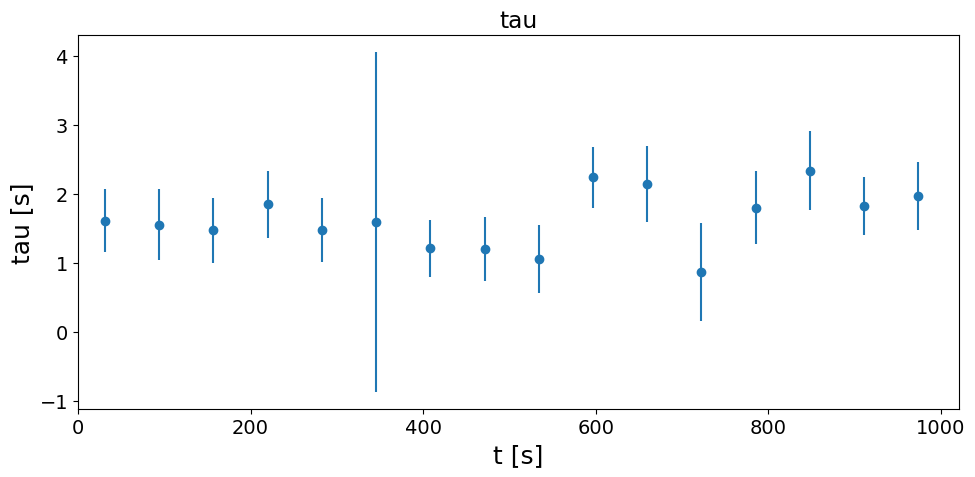

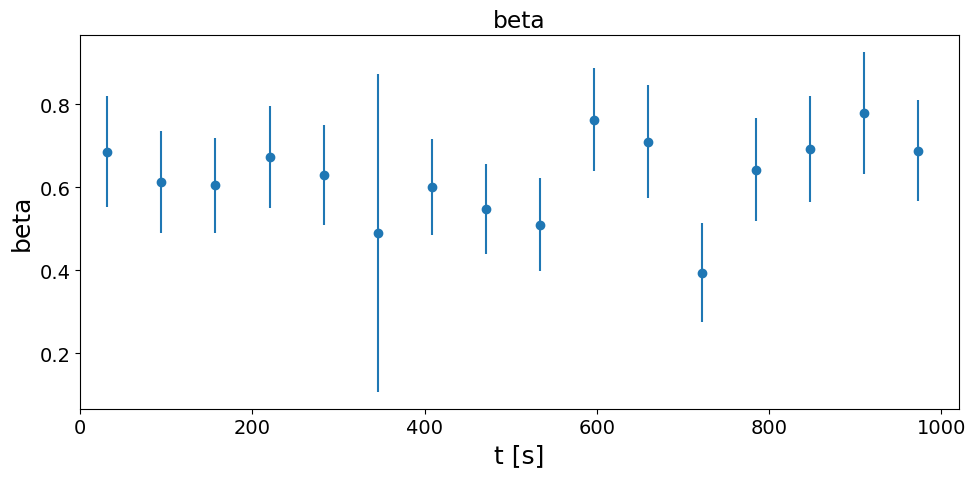

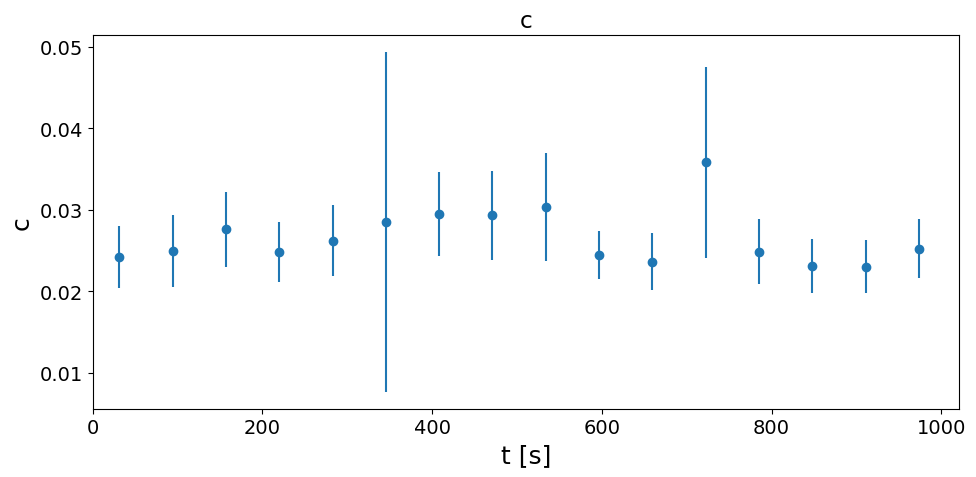

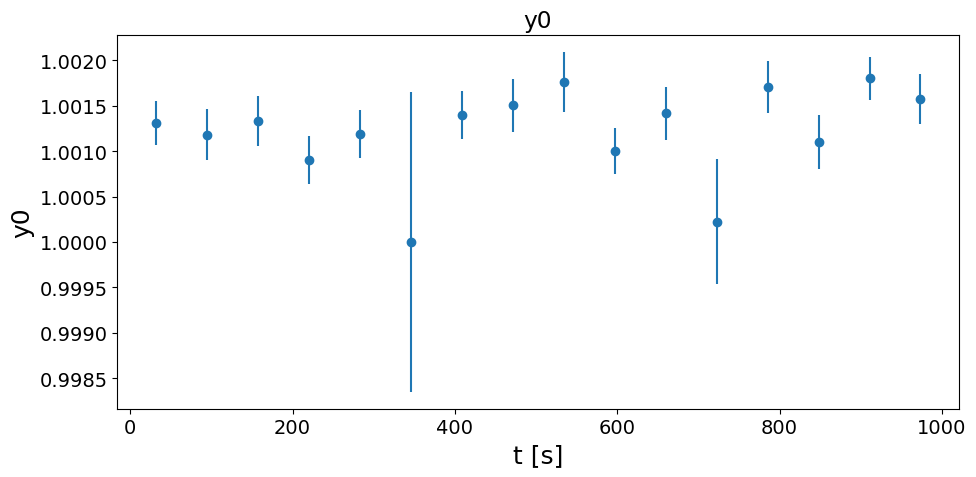

In [113]:
##################
t1_fit = 0
t2_fit = 1e100
##################

################# KKW MODEL #################
model = lm.Model(decorrelation_f)
params = lm.Parameters()
params.add('tau', value=1, min=0, max=10)
params.add('beta', value=1, min=0, max=2)
params.add('c', value=.03, min=0, max=.1)
params.add('y0', value=1, min=1, max=1.01)
#params.add('y0', value=1.015, vary=False)
##############################################

plotfit_bydose(itime, Lbin, g2, t1_fit, t2_fit)

### Linear correlation of damaged-vGeO2

In [114]:
G2t = XPCS.get_G2t(e4m_data, mask=None, Nfi=5000, Nff=None, Lbin=None)

g2 = np.vstack(XPCS.get_g2(itime, G2t))
np.savetxt(f"{g24damaged_vGeO2_folder}g2-{sample_name}_{str(Ndataset).zfill(4)}_{str(Nscan).zfill(4)}-Q={Q_notebook}-dQ={dQ_notebook}.txt", g2)

Loading frames ...
Done! (elapsed time = 1.04 s)
Computing G2t (using MKL library)...
Done! (elapsed time = 8.89 s)
	 | 54999 X 54999 squared matrix
	 | memory usage (np.array @ float32) = 11.269 GB
Normalizing G2t (using NumExpr library)...
Done! (elapsed time = 1.36 s)

Computing g2 (using cython code)...
Done! (elapsed time = 3.35 s)



Using Global variables: model, params, Q_notebook, dQ_notebook, sample_name, Ndataset, Nscan


,Q,dQ,tau,dtau,dtau%,beta,dbeta,dbeta%,c,dc,dc%,y0,dy0,dy%,redchi2
0,0.21,0.01,1.624596,0.109635,6.748422,0.63203,0.024168,3.823867,0.025974,0.000908,3.494791,1.001512,0.000028,0.00276,0.980508


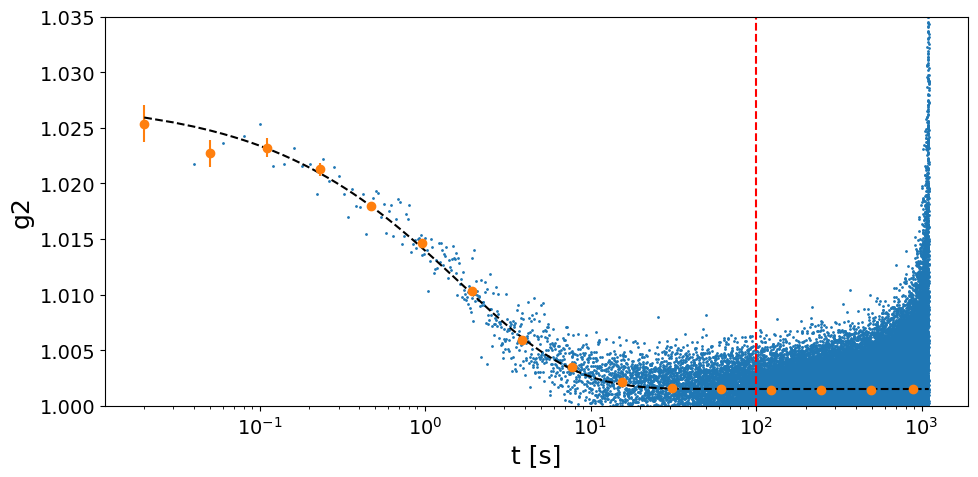

In [115]:
##################
t1_fit = None
t2_fit = 1e2
##################

################# KKW MODEL #################
model = lm.Model(decorrelation_f)
params = lm.Parameters()
params.add('tau', value=1, min=0, max=10)
params.add('beta', value=1, min=0, max=2)
params.add('c', value=.03, min=0, max=.1)
params.add('y0', value=1, min=1, max=1.01)
#params.add('y0', value=1.015, vary=False)
##############################################

plotfit_4damaged_vGeO2(itime, g2, t1_fit, t2_fit)

plt.ylim(1, 1.035)
plt.tight_layout(); plt.show()

##  XPCS scan: T=520C, Q=0.19, 20min @ 20ms (60000fm) (GeO2_6, dataset 1, scan 1) 

In [116]:
#######################################
sample_name = 'GeO2_6_520C'
Ndataset = 1
Nscan = 1
Nfi, Nff = 1, None
load_mask = e4m_mask * e4m_htmask * bs_mask * Qmask # Put None for profile analysis!
#######################################

scan = ID10.load_scan(RAW_folder, sample_name, Ndataset, Nscan)
Ei = scan['monoe']
itime = scan['fast_timer_period'][0]
theta = scan['delcoup']
Q = round(XPCS.theta2Q(Ei,  theta),2)

print('#############################')
print('command =', scan['command'])
print('Ei =', Ei)
print('itime =', itime)
print('theta =', theta)
print('Q =', Q)
print('T = {:.2f} min'.format(len(scan['fast_timer_period'])*itime/60))   
print('#############################\n')

e4m_data = ID10.load_sparse_e4m(RAW_folder, sample_name, Ndataset, Nscan, Nfi, Nff,  n_jobs=20, load_mask=load_mask)
e4m_data = COSMIC.fast_gamma_filter(e4m_data, Imaxth_high=4)

#############################
command = mtimescan 0.02 1 60000
Ei = 9.699998837562536
itime = 0.020101
theta = 1.7500000000000004
Q = 0.15
T = 20.10 min
#############################

Loading sparse array ...
	 -> loading file eiger4m_v2_sparse_frame_0_00000.h5 (1/12 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00001.h5 (2/12 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00002.h5 (3/12 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00003.h5 (4/12 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00004.h5 (5/12 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00005.h5 (6/12 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00006.h5 (7/12 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00007.h5 (8/12 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00008.h5 (9/12 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00009.h5 (10/12 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00010.h5 (11/12 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00011.h5 (12/12 loo

### Flux check

################################################################################
Maximum count in the whole run -> 4.0
# of pixels above Ith_high treshold ->  3929211 pixels (of 4471016 => 87.88 %)
# of pixels below Ith_low treshold ->  48839 pixels (of 4471016 => 1.09 %)
################################################################################



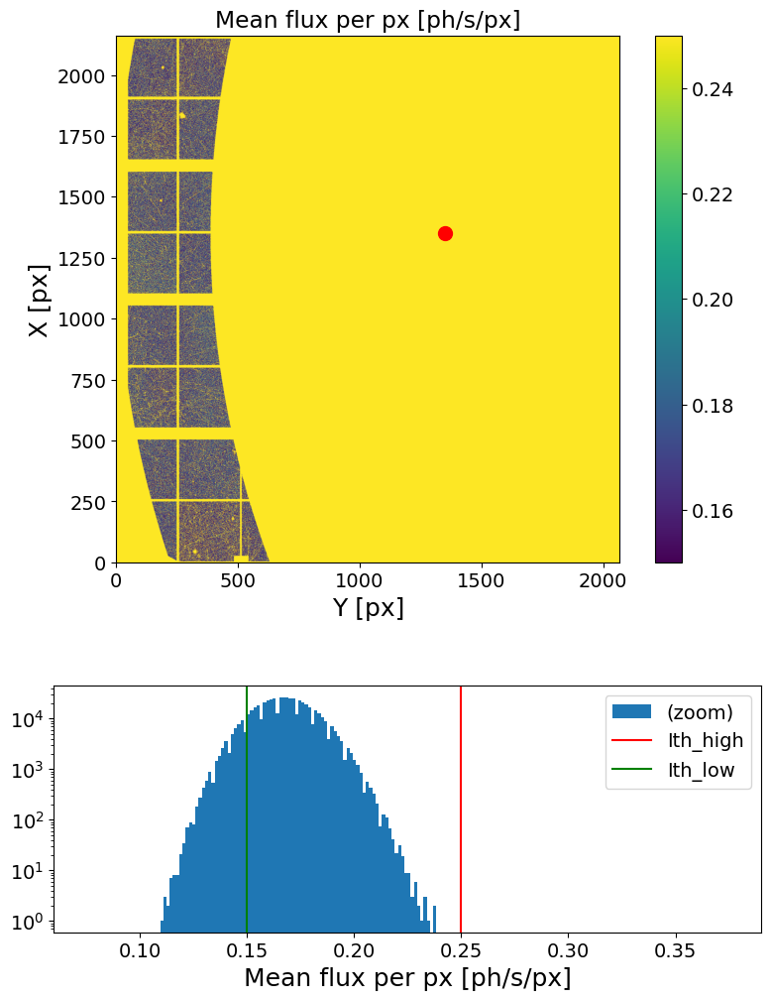

In [117]:
XPCS.gen_plots4mask(e4m_data, itime, Ith_low=.15, Ith_high=.25, Nff=None, load_mask=load_mask)

### Intensity analysis

In [118]:
####################
Lbin = 100
Nstep = 100
mask = None #e4m_mask*e4m_htmask*bs_mask*Qmask
####################

It = np.vstack(XPCS.get_It(e4m_data, itime, mask=mask, Lbin=Lbin, Nstep=Nstep))
np.savetxt(f"{Intensity_folder}Idt-{sample_name}_{str(Ndataset).zfill(4)}_{str(Nscan).zfill(4)}-Q={Q_notebook}-dQ={dQ_notebook}.txt", It)

<SecondaryAxis: >

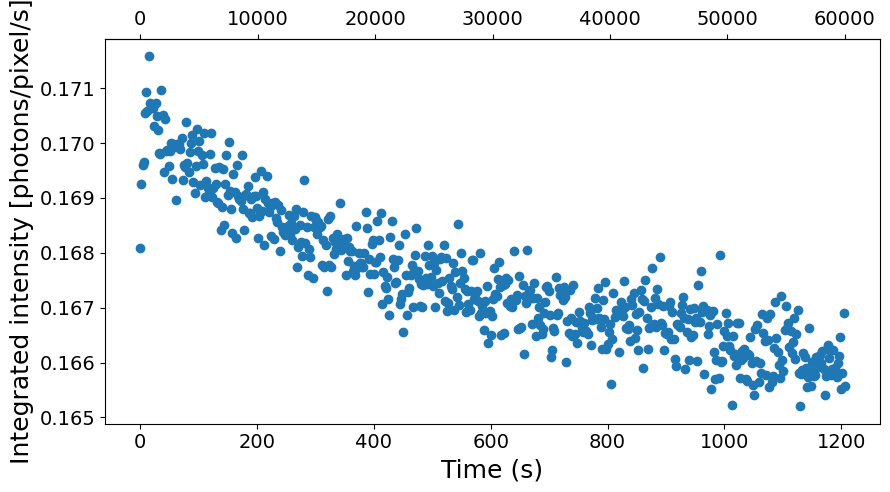

In [119]:
plt.figure(figsize=(10,5))
plt.scatter(It[0], It[1], label='It')
plt.xlabel('Time (s)')
plt.ylabel('Integrated intensity [photons/pixel/s]')
plt.gca().secondary_xaxis('top', functions=(lambda x: x/itime, lambda x: x*itime))
#plt.xlim(0, 3000)

### Linear Correlation by Dose

In [120]:
###################
Nfi = None
Nff = 50_000
Lbin = 1
mask = None #e4m_mask * e4m_htmask * bs_mask * Qmask
###################
if Lbin is None: Lbin=1

G2t = XPCS.get_G2t(e4m_data, mask=mask, Nfi=Nfi, Nff=Nff, Lbin=None)

Loading frames ...
Done! (elapsed time = 0.95 s)
Computing G2t (using MKL library)...
Done! (elapsed time = 7.51 s)
	 | 50000 X 50000 squared matrix
	 | memory usage (np.array @ float32) = 9.313 GB
Normalizing G2t (using NumExpr library)...
Done! (elapsed time = 1.21 s)



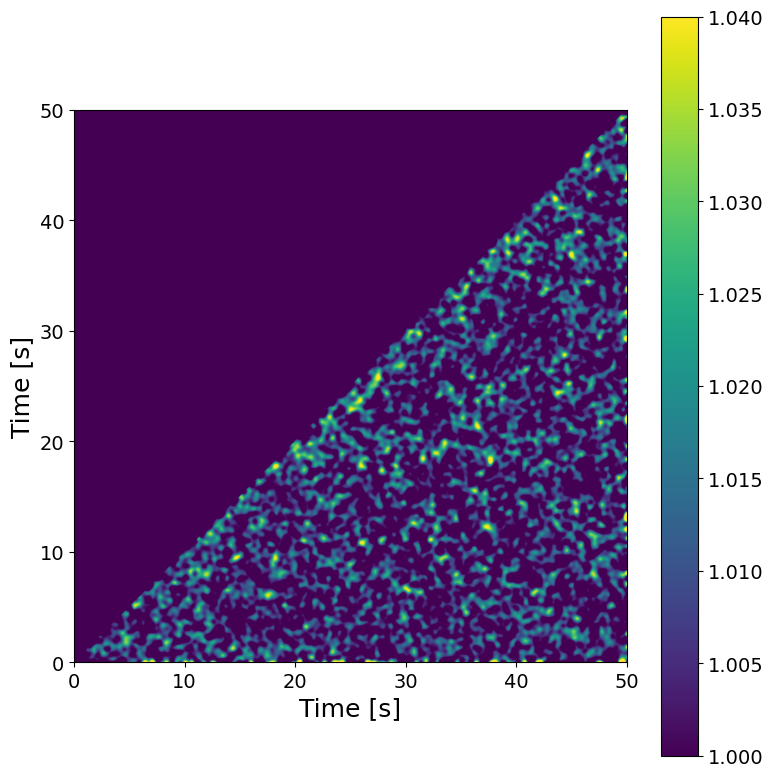

In [121]:
############################
t1, t2 = 0, 50
vmin, vmax = 1.0, 1.04
############################
XPCS.plot_G2t(G2t, vmin, vmax, itime=itime, t1=t1, t2=t2, sigma_filter=10)

In [122]:
################
Nbunch = 16
################

NfXbunch = int(G2t.shape[0]/Nbunch)
g2 = {}
for n in range(Nbunch):
    t_bunch = round(itime*Lbin*NfXbunch*(n+1/2),1)
    g2[t_bunch] = np.vstack(XPCS.get_g2(itime*Lbin, np.array(G2t[NfXbunch*n:NfXbunch*(n+1), NfXbunch*n:NfXbunch*(n+1)])))

Computing g2 (using cython code)...
Done! (elapsed time = 0.03 s)

Computing g2 (using cython code)...
Done! (elapsed time = 0.02 s)

Computing g2 (using cython code)...
Done! (elapsed time = 0.02 s)

Computing g2 (using cython code)...
Done! (elapsed time = 0.02 s)

Computing g2 (using cython code)...
Done! (elapsed time = 0.02 s)

Computing g2 (using cython code)...
Done! (elapsed time = 0.02 s)

Computing g2 (using cython code)...
Done! (elapsed time = 0.02 s)

Computing g2 (using cython code)...
Done! (elapsed time = 0.02 s)

Computing g2 (using cython code)...
Done! (elapsed time = 0.02 s)

Computing g2 (using cython code)...
Done! (elapsed time = 0.02 s)

Computing g2 (using cython code)...
Done! (elapsed time = 0.02 s)

Computing g2 (using cython code)...
Done! (elapsed time = 0.02 s)

Computing g2 (using cython code)...
Done! (elapsed time = 0.02 s)

Computing g2 (using cython code)...
Done! (elapsed time = 0.02 s)

Computing g2 (using cython code)...
Done! (elapsed time = 0.02

Using Global variables: Nbunch, model, params, Q_notebook, dQ_notebook, sample_name, Ndataset, Nscan


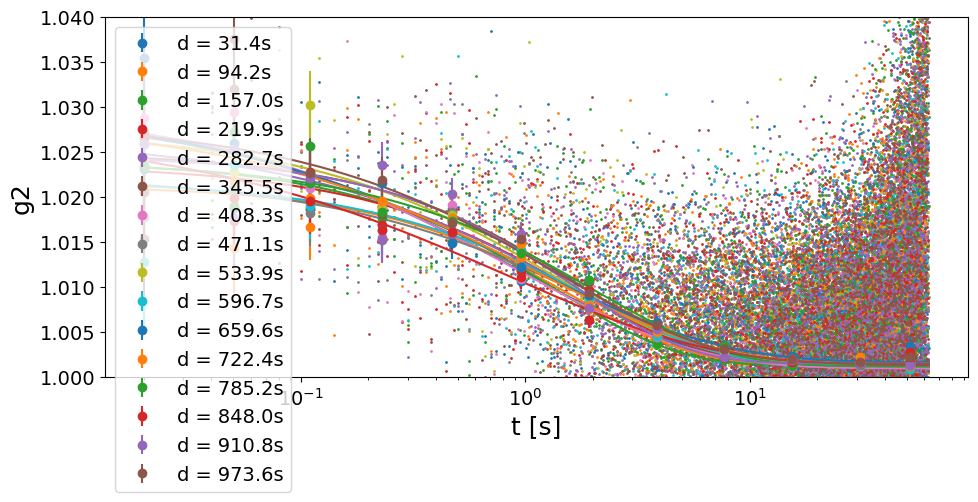

,Q,dQ,tau,dtau,dtau%,beta,dbeta,dbeta%,c,dc,dc%,y0,dy0,dy%,redchi2
tw,,,,,,,,,,,,,,,
31.4,0.21,0.01,0.941107,0.425725,45.236666,0.569157,0.132440,23.269441,0.028083,0.006250,22.253968,1.001553,0.000264,0.026371,1.044073
94.2,0.21,0.01,1.698999,0.427362,25.153778,0.834262,0.187521,22.477474,0.019904,0.003182,15.987420,1.001438,0.000223,0.022223,0.989956
157.0,0.21,0.01,1.384205,0.372576,26.916233,0.806062,0.181995,22.578322,0.022699,0.003780,16.654226,1.001327,0.000225,0.022508,1.064364
219.9,0.21,0.01,1.678346,0.449357,26.773824,0.754636,0.158087,20.948724,0.022064,0.003528,15.988918,1.001551,0.000237,0.023641,0.985053
282.7,0.21,0.01,1.503597,0.530385,35.274431,0.602039,0.125515,20.848223,0.025609,0.004699,18.348858,1.001000,0.000294,0.029322,0.997729
345.5,0.21,0.01,1.804137,0.411950,22.833627,0.786292,0.149335,18.992300,0.023698,0.003323,14.022952,1.001308,0.000238,0.023771,1.004363
408.3,0.21,0.01,0.931619,0.438652,47.084891,0.543104,0.124529,22.929128,0.029515,0.006648,22.523128,1.001000,0.000283,0.028249,1.029892
471.1,0.21,0.01,1.892605,0.664603,35.115796,0.643011,0.149741,23.287547,0.021276,0.004098,19.259731,1.001167,0.000309,0.030910,1.067633
533.9,0.21,0.01,1.374423,0.425102,30.929510,0.666126,0.134539,20.197149,0.025935,0.004403,16.977888,1.001571,0.000250,0.024917,0.987487


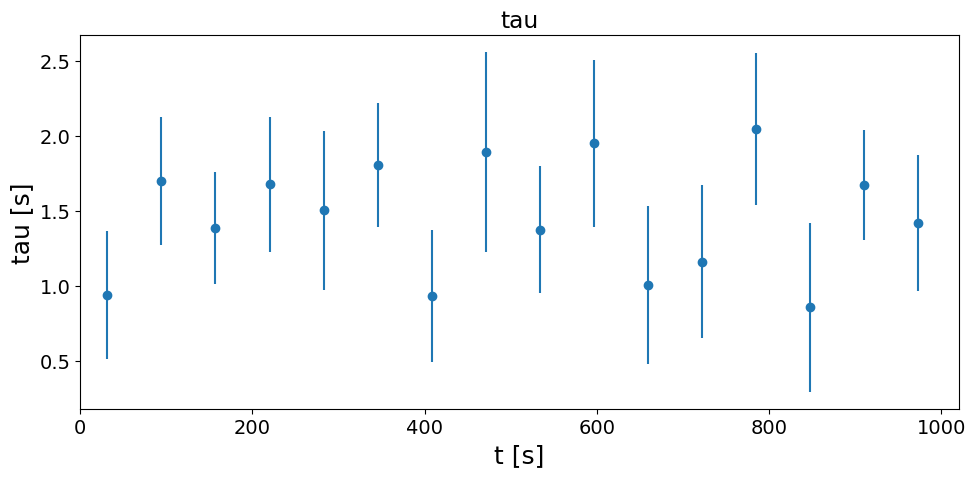

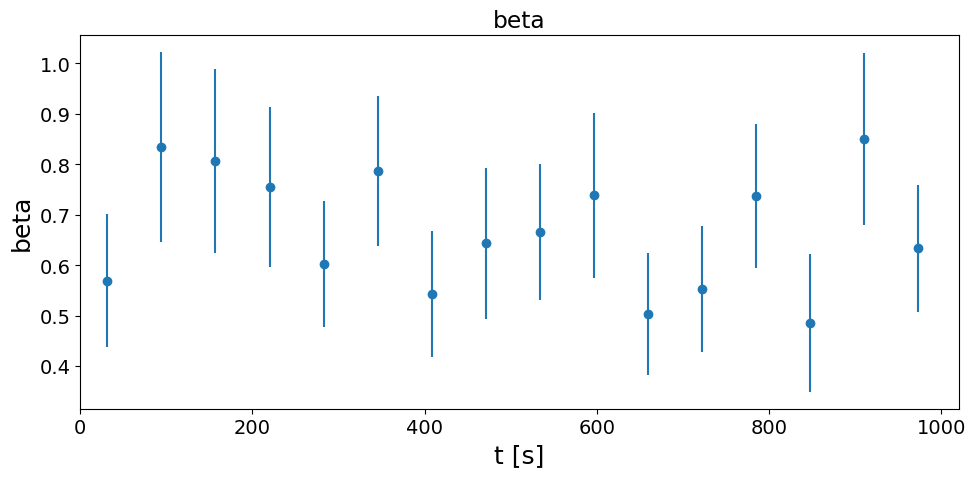

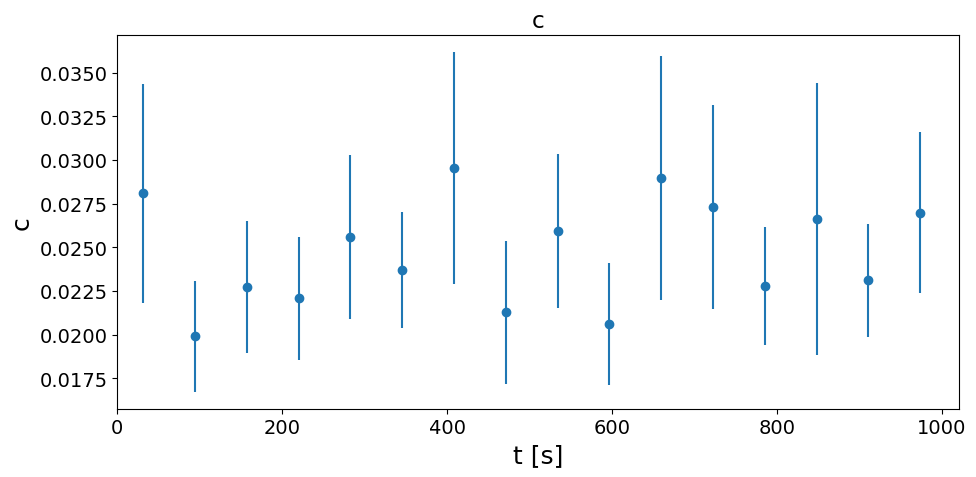

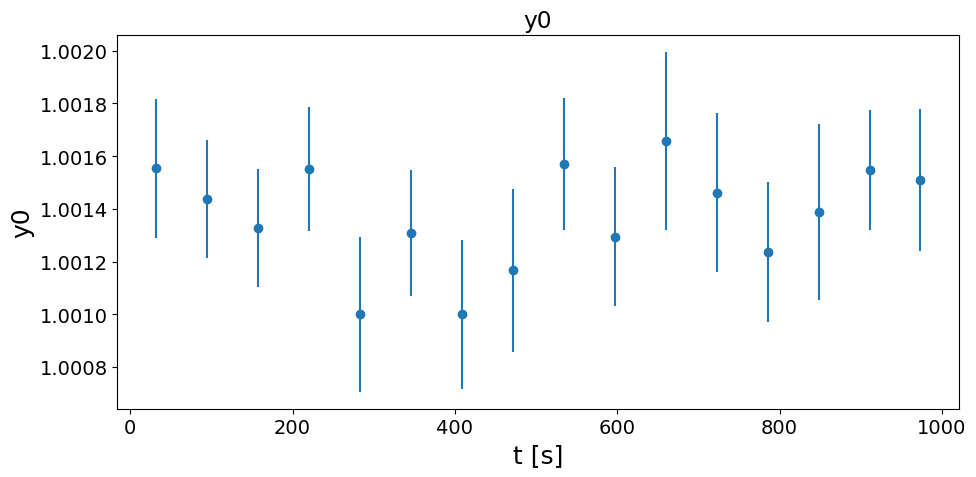

In [123]:
##################
t1_fit = 0
t2_fit = 1e100
##################

################# KKW MODEL #################
model = lm.Model(decorrelation_f)
params = lm.Parameters()
params.add('tau', value=1, min=0, max=10)
params.add('beta', value=1, min=0, max=2)
params.add('c', value=.03, min=0, max=.1)
params.add('y0', value=1, min=1, max=1.01)
#params.add('y0', value=1.015, vary=False)
##############################################

plotfit_bydose(itime, Lbin, g2, t1_fit, t2_fit)

### Linear correlation of damaged-vGeO2

In [124]:
G2t = XPCS.get_G2t(e4m_data, mask=None, Nfi=5000, Nff=None, Lbin=None)

g2 = np.vstack(XPCS.get_g2(itime, G2t))
np.savetxt(f"{g24damaged_vGeO2_folder}g2-{sample_name}_{str(Ndataset).zfill(4)}_{str(Nscan).zfill(4)}-Q={Q_notebook}-dQ={dQ_notebook}.txt", g2)

Loading frames ...
Done! (elapsed time = 0.94 s)
Computing G2t (using MKL library)...
Done! (elapsed time = 8.41 s)
	 | 54999 X 54999 squared matrix
	 | memory usage (np.array @ float32) = 11.269 GB
Normalizing G2t (using NumExpr library)...
Done! (elapsed time = 1.37 s)

Computing g2 (using cython code)...
Done! (elapsed time = 2.42 s)



Using Global variables: model, params, Q_notebook, dQ_notebook, sample_name, Ndataset, Nscan


,Q,dQ,tau,dtau,dtau%,beta,dbeta,dbeta%,c,dc,dc%,y0,dy0,dy%,redchi2
0,0.21,0.01,1.42225,0.111926,7.869633,0.644611,0.029348,4.552811,0.024663,0.001017,4.122604,1.001508,0.000028,0.002845,1.011866


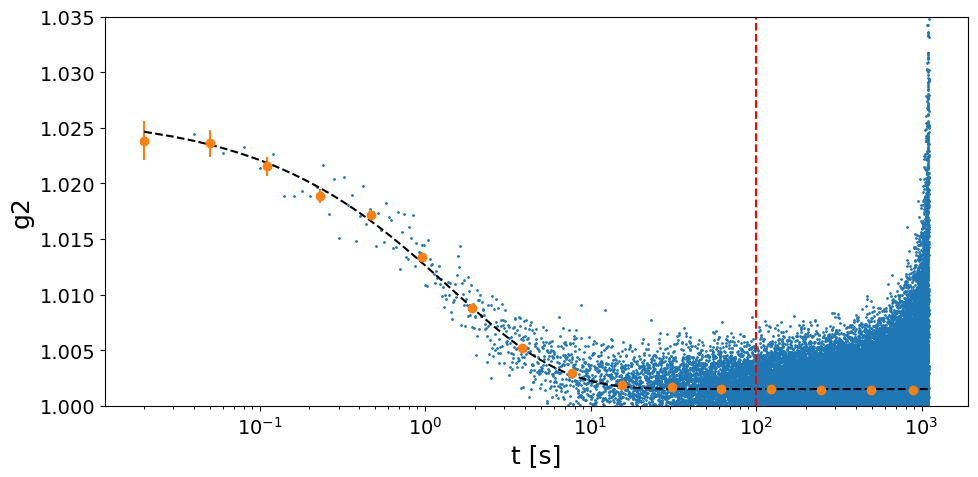

In [125]:
##################
t1_fit = None
t2_fit = 1e2
##################

################# KKW MODEL #################
model = lm.Model(decorrelation_f)
params = lm.Parameters()
params.add('tau', value=1, min=0, max=10)
params.add('beta', value=1, min=0, max=2)
params.add('c', value=.03, min=0, max=.1)
params.add('y0', value=1, min=1, max=1.01)
#params.add('y0', value=1.015, vary=False)
##############################################

plotfit_4damaged_vGeO2(itime, g2, t1_fit, t2_fit)

plt.ylim(1, 1.035)
plt.tight_layout(); plt.show()

## XPCS scan: T=590C, Q=0.19, 20min @ 20ms (60000fm) (GeO2_6, dataset 1, scan 1) 

In [126]:
#######################################
sample_name = 'GeO2_6_590C'
Ndataset = 1
Nscan = 3
Nfi, Nff = 1, None
load_mask = e4m_mask * e4m_htmask * bs_mask * Qmask # Put None for profile analysis!
#######################################

scan = ID10.load_scan(RAW_folder, sample_name, Ndataset, Nscan)
Ei = scan['monoe']
itime = scan['fast_timer_period'][0]
theta = scan['delcoup']
Q = round(XPCS.theta2Q(Ei,  theta),2)

print('#############################')
print('command =', scan['command'])
print('Ei =', Ei)
print('itime =', itime)
print('theta =', theta)
print('Q =', Q)
print('T = {:.2f} min'.format(len(scan['fast_timer_period'])*itime/60))   
print('#############################\n')

e4m_data = ID10.load_sparse_e4m(RAW_folder, sample_name, Ndataset, Nscan, Nfi, Nff,  n_jobs=20, load_mask=load_mask)
e4m_data = COSMIC.fast_gamma_filter(e4m_data, Imaxth_high=4)

#############################
command = mtimescan 0.02 1 60000
Ei = 9.699998837562536
itime = 0.020101
theta = 1.7500000000000004
Q = 0.15
T = 20.10 min
#############################

Loading sparse array ...
	 -> loading file eiger4m_v2_sparse_frame_0_00000.h5 (1/12 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00001.h5 (2/12 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00002.h5 (3/12 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00003.h5 (4/12 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00004.h5 (5/12 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00005.h5 (6/12 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00006.h5 (7/12 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00007.h5 (8/12 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00008.h5 (9/12 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00009.h5 (10/12 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00010.h5 (11/12 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00011.h5 (12/12 loo

### Flux check

################################################################################
Maximum count in the whole run -> 4.0
# of pixels above Ith_high treshold ->  3929211 pixels (of 4471016 => 87.88 %)
# of pixels below Ith_low treshold ->  56990 pixels (of 4471016 => 1.27 %)
################################################################################



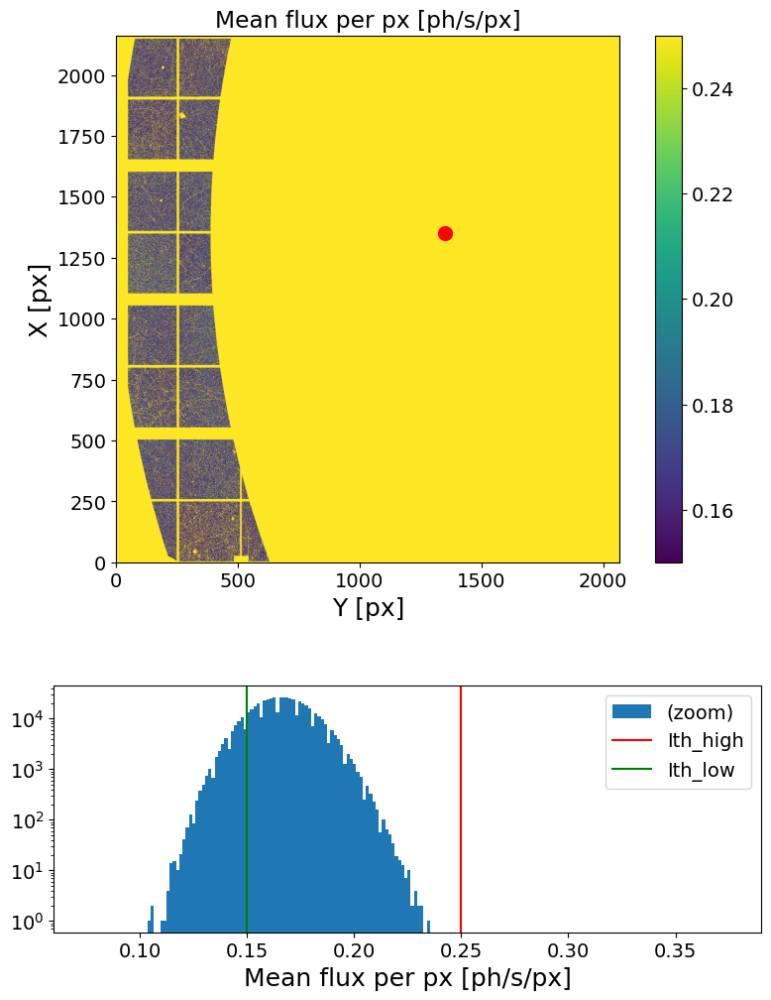

In [127]:
XPCS.gen_plots4mask(e4m_data, itime, Ith_low=.15, Ith_high=.25, Nff=None, load_mask=load_mask)

### Intensity analysis

In [128]:
####################
Lbin = 100
Nstep = 100
mask = None #e4m_mask*e4m_htmask*bs_mask*Qmask
####################

It = np.vstack(XPCS.get_It(e4m_data, itime, mask=mask, Lbin=Lbin, Nstep=Nstep))
np.savetxt(f"{Intensity_folder}Idt-{sample_name}_{str(Ndataset).zfill(4)}_{str(Nscan).zfill(4)}-Q={Q_notebook}-dQ={dQ_notebook}.txt", It)

<SecondaryAxis: >

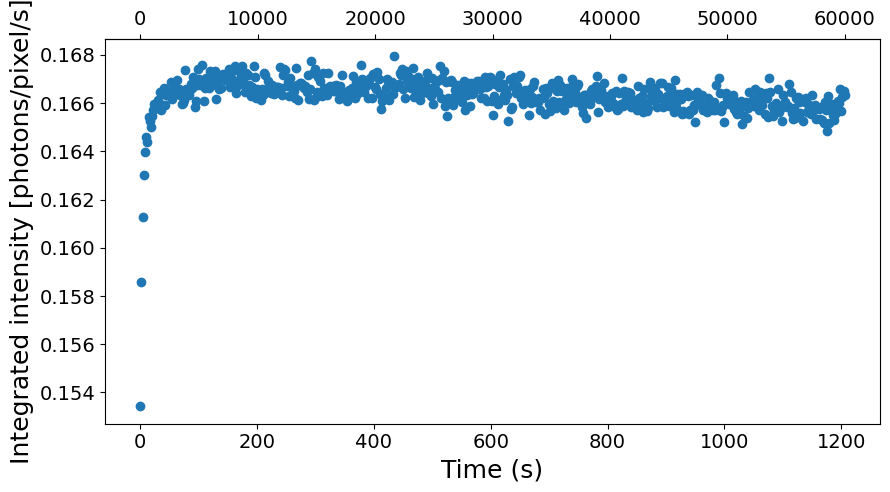

In [129]:
plt.figure(figsize=(10,5))
plt.scatter(It[0], It[1], label='It')
plt.xlabel('Time (s)')
plt.ylabel('Integrated intensity [photons/pixel/s]')
plt.gca().secondary_xaxis('top', functions=(lambda x: x/itime, lambda x: x*itime))
#plt.xlim(0, 3000)

### Linear Correlation by Dose

In [130]:
###################
Nfi = None
Nff = 50_000
Lbin = 1
mask = None #e4m_mask * e4m_htmask * bs_mask * Qmask
###################
if Lbin is None: Lbin=1

G2t = XPCS.get_G2t(e4m_data, mask=mask, Nfi=Nfi, Nff=Nff, Lbin=None)

Loading frames ...
Done! (elapsed time = 0.69 s)
Computing G2t (using MKL library)...
Done! (elapsed time = 7.39 s)
	 | 50000 X 50000 squared matrix
	 | memory usage (np.array @ float32) = 9.313 GB
Normalizing G2t (using NumExpr library)...
Done! (elapsed time = 1.24 s)



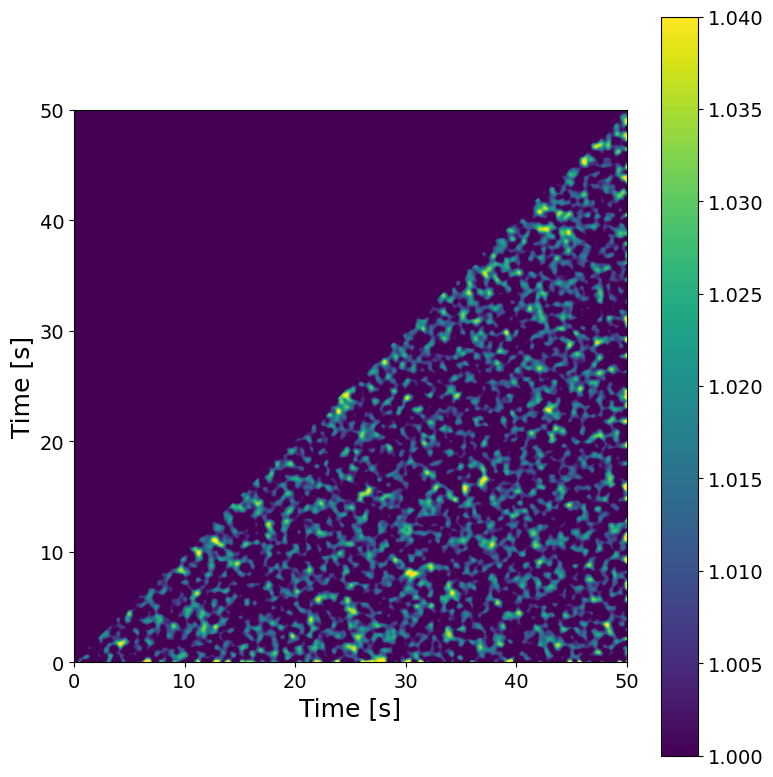

In [131]:
############################
t1, t2 = 0, 50
vmin, vmax = 1.0, 1.04
############################
XPCS.plot_G2t(G2t, vmin, vmax, itime=itime, t1=t1, t2=t2, sigma_filter=10)

In [132]:
################
Nbunch = 6
################

NfXbunch = int(G2t.shape[0]/Nbunch)
g2 = {}
for n in range(Nbunch):
    t_bunch = round(itime*Lbin*NfXbunch*(n+1/2),1)
    g2[t_bunch] = np.vstack(XPCS.get_g2(itime*Lbin, np.array(G2t[NfXbunch*n:NfXbunch*(n+1), NfXbunch*n:NfXbunch*(n+1)])))

Computing g2 (using cython code)...
Done! (elapsed time = 0.1 s)

Computing g2 (using cython code)...
Done! (elapsed time = 0.1 s)

Computing g2 (using cython code)...
Done! (elapsed time = 0.1 s)

Computing g2 (using cython code)...
Done! (elapsed time = 0.1 s)

Computing g2 (using cython code)...
Done! (elapsed time = 0.1 s)

Computing g2 (using cython code)...
Done! (elapsed time = 0.1 s)



Using Global variables: Nbunch, model, params, Q_notebook, dQ_notebook, sample_name, Ndataset, Nscan


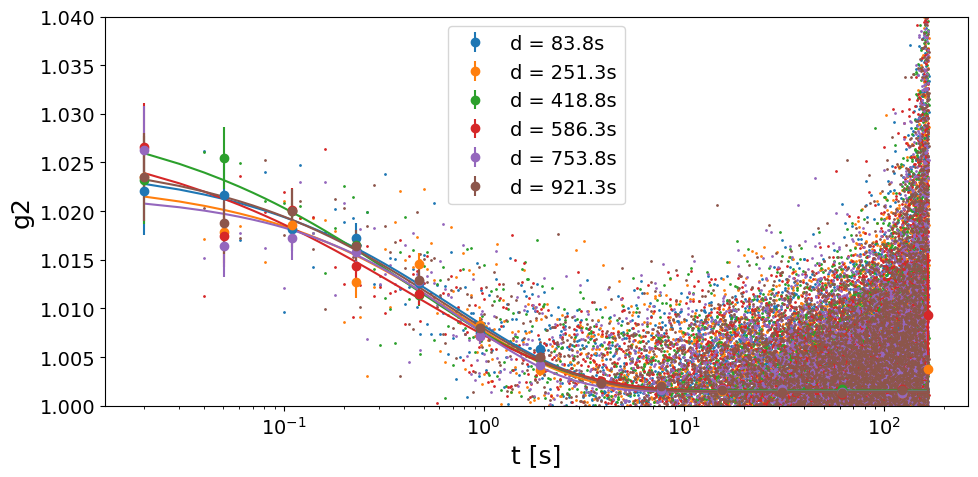

,Q,dQ,tau,dtau,dtau%,beta,dbeta,dbeta%,c,dc,dc%,y0,dy0,dy%,redchi2
tw,,,,,,,,,,,,,,,
83.8,0.21,0.01,0.727960,0.213558,29.336543,0.675293,0.120015,17.772261,0.023342,0.003706,15.878887,1.001440,0.000074,0.007355,1.010440
251.3,0.21,0.01,0.735491,0.211206,28.716289,0.714802,0.135592,18.969177,0.021644,0.003495,16.147555,1.001445,0.000073,0.007252,1.005492
418.8,0.21,0.01,0.433060,0.178360,41.185979,0.558681,0.103064,18.447682,0.029173,0.005761,19.747813,1.001575,0.000073,0.007327,0.994441
586.3,0.21,0.01,0.426189,0.208671,48.962003,0.516554,0.100973,19.547504,0.027658,0.006165,22.291670,1.001413,0.000075,0.007523,1.000160
753.8,0.21,0.01,0.777087,0.186952,24.058004,0.819160,0.160080,19.541997,0.020295,0.003008,14.822542,1.001474,0.000071,0.007119,0.988373
921.3,0.21,0.01,0.652807,0.208100,31.877745,0.645571,0.116281,18.012159,0.024267,0.004060,16.732033,1.001434,0.000074,0.007345,1.004066


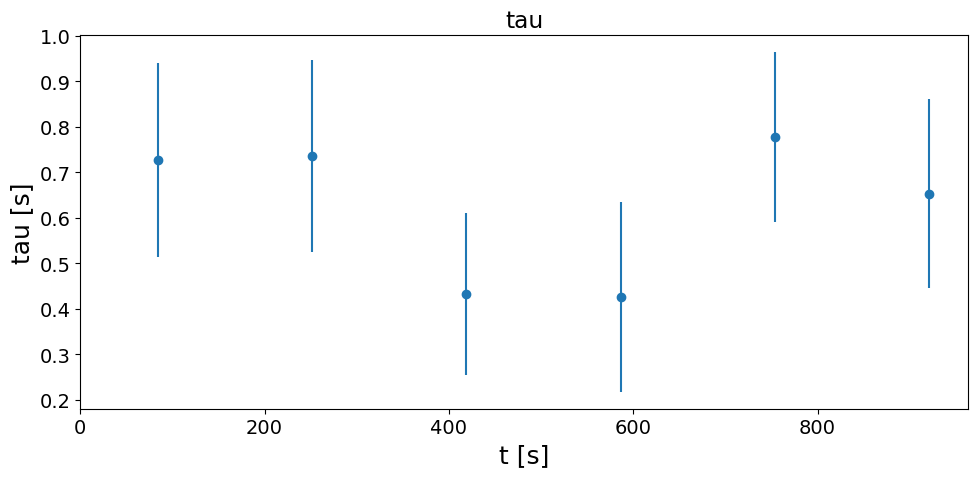

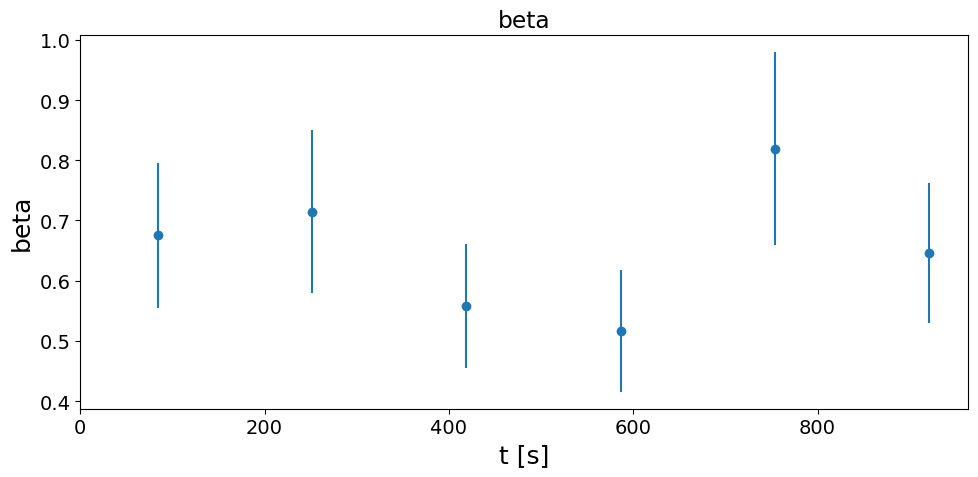

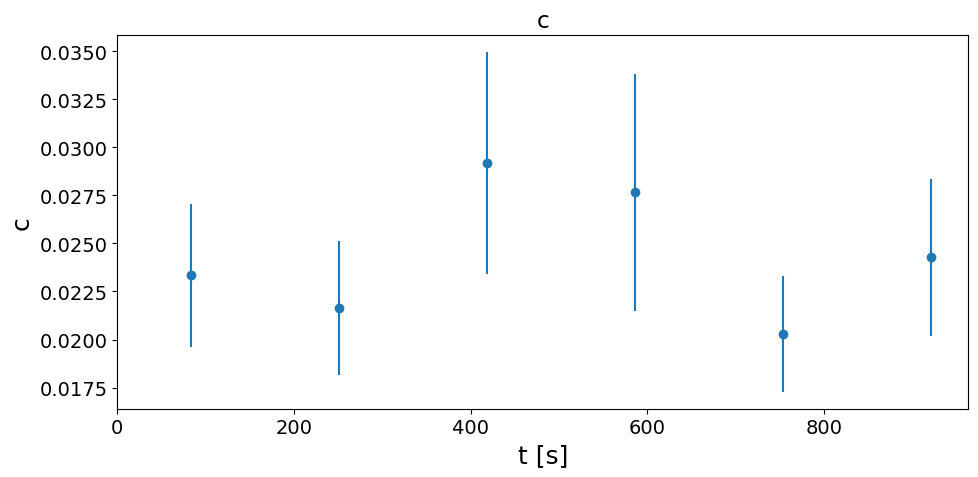

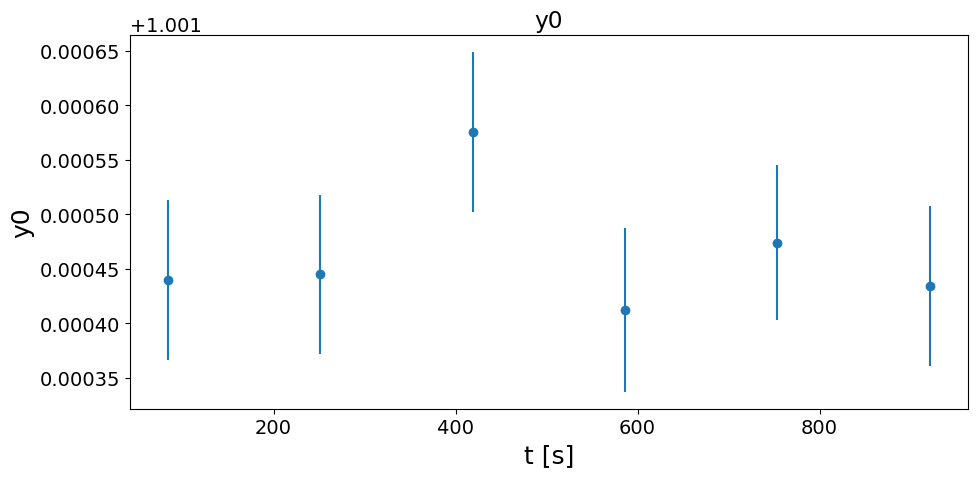

In [133]:
##################
t1_fit = 0
t2_fit = 1e100
##################

################# KKW MODEL #################
model = lm.Model(decorrelation_f)
params = lm.Parameters()
params.add('tau', value=1, min=0, max=10)
params.add('beta', value=1, min=0, max=2)
params.add('c', value=.03, min=0, max=.1)
params.add('y0', value=1, min=1, max=1.01)
#params.add('y0', value=1.015, vary=False)
##############################################

plotfit_bydose(itime, Lbin, g2, t1_fit, t2_fit)

### Linear correlation of damaged-vGeO2

In [134]:
G2t = XPCS.get_G2t(e4m_data, mask=None, Nfi=5000, Nff=None, Lbin=None)

g2 = np.vstack(XPCS.get_g2(itime, G2t))
np.savetxt(f"{g24damaged_vGeO2_folder}g2-{sample_name}_{str(Ndataset).zfill(4)}_{str(Nscan).zfill(4)}-Q={Q_notebook}-dQ={dQ_notebook}.txt", g2)

Loading frames ...
Done! (elapsed time = 1.2 s)
Computing G2t (using MKL library)...
Done! (elapsed time = 8.81 s)
	 | 54999 X 54999 squared matrix
	 | memory usage (np.array @ float32) = 11.269 GB
Normalizing G2t (using NumExpr library)...
Done! (elapsed time = 1.4 s)

Computing g2 (using cython code)...
Done! (elapsed time = 3.26 s)



Using Global variables: model, params, Q_notebook, dQ_notebook, sample_name, Ndataset, Nscan


,Q,dQ,tau,dtau,dtau%,beta,dbeta,dbeta%,c,dc,dc%,y0,dy0,dy%,redchi2
0,0.21,0.01,0.612934,0.074443,12.145298,0.671068,0.04902,7.304707,0.023863,0.001571,6.582165,1.001578,0.000038,0.003777,0.963942


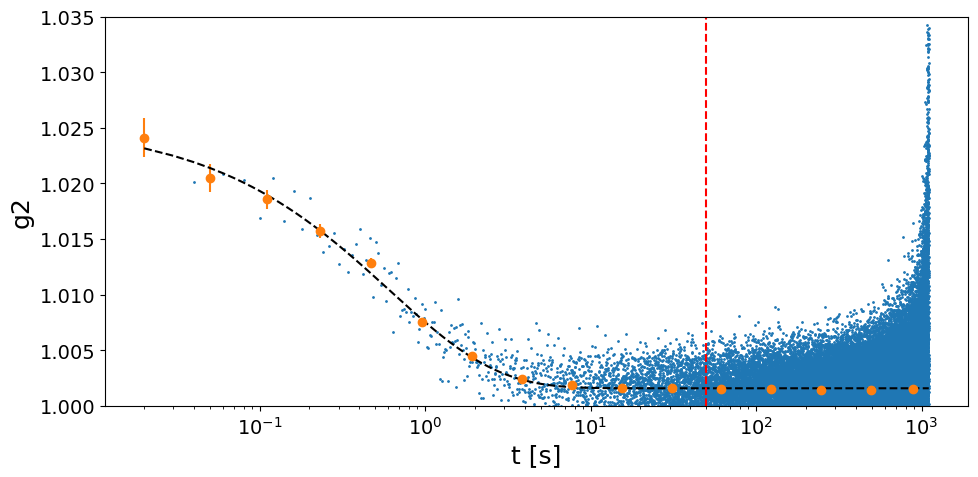

In [135]:
##################
t1_fit = None
t2_fit = 5e1
##################

################# KKW MODEL #################
model = lm.Model(decorrelation_f)
params = lm.Parameters()
params.add('tau', value=1, min=0, max=10)
params.add('beta', value=1, min=0, max=2)
params.add('c', value=.03, min=0, max=.1)
params.add('y0', value=1, min=1, max=1.01)
#params.add('y0', value=1.015, vary=False)
##############################################

plotfit_4damaged_vGeO2(itime, g2, t1_fit, t2_fit)

plt.ylim(1, 1.035)
plt.tight_layout(); plt.show()

## XPCS scan: T=660C, Q=0.19, 20min @ 20ms (60000fm) (GeO2_6, dataset 1, scan 1)

In [136]:
#######################################
sample_name = 'GeO2_6_660C'
Ndataset = 1
Nscan = 1
Nfi, Nff = 1, None
load_mask = e4m_mask * e4m_htmask * bs_mask * Qmask # Put None for profile analysis!
#######################################

scan = ID10.load_scan(RAW_folder, sample_name, Ndataset, Nscan)
Ei = scan['monoe']
itime = scan['fast_timer_period'][0]
theta = scan['delcoup']
Q = round(XPCS.theta2Q(Ei,  theta),2)

print('#############################')
print('command =', scan['command'])
print('Ei =', Ei)
print('itime =', itime)
print('theta =', theta)
print('Q =', Q)
print('T = {:.2f} min'.format(len(scan['fast_timer_period'])*itime/60))   
print('#############################\n')

e4m_data = ID10.load_sparse_e4m(RAW_folder, sample_name, Ndataset, Nscan, Nfi, Nff,  n_jobs=20, load_mask=load_mask)
e4m_data = COSMIC.fast_gamma_filter(e4m_data, Imaxth_high=4)

#############################
command = mtimescan 0.02 1 60000
Ei = 9.699998837562536
itime = 0.020101
theta = 1.7500000000000004
Q = 0.15
T = 20.10 min
#############################

Loading sparse array ...
	 -> loading file eiger4m_v2_sparse_frame_0_00000.h5 (1/12 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00001.h5 (2/12 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00002.h5 (3/12 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00003.h5 (4/12 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00004.h5 (5/12 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00005.h5 (6/12 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00006.h5 (7/12 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00007.h5 (8/12 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00008.h5 (9/12 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00009.h5 (10/12 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00010.h5 (11/12 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00011.h5 (12/12 loo

### Flux check

################################################################################
Maximum count in the whole run -> 4.0
# of pixels above Ith_high treshold ->  3929211 pixels (of 4471016 => 87.88 %)
# of pixels below Ith_low treshold ->  107927 pixels (of 4471016 => 2.41 %)
################################################################################



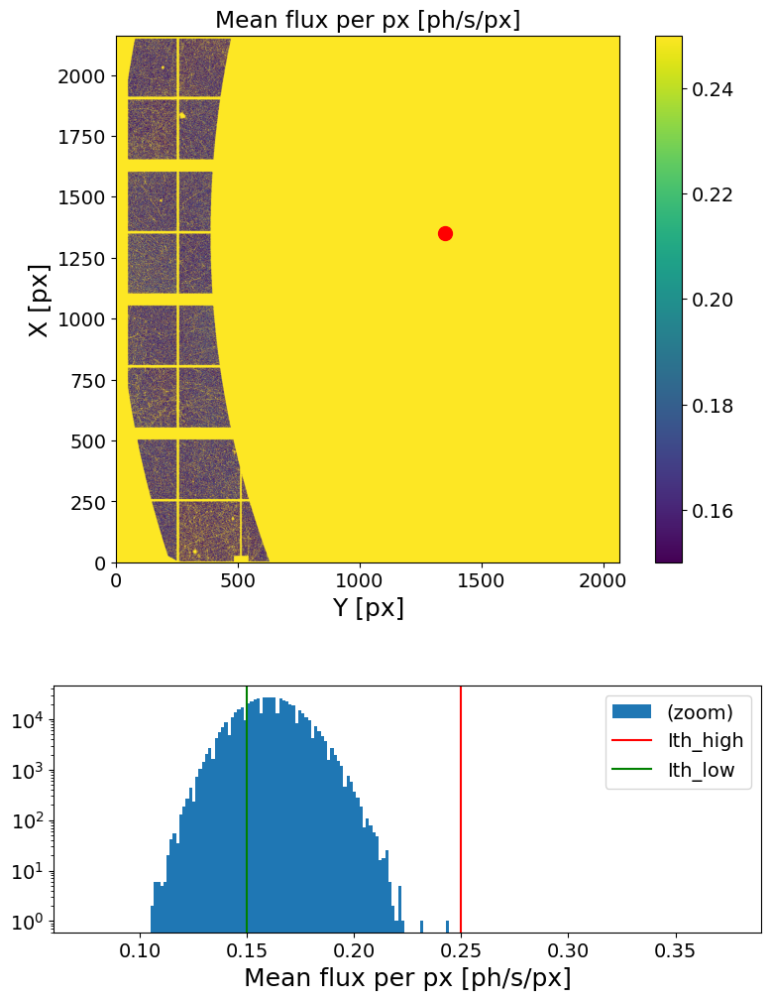

In [137]:
XPCS.gen_plots4mask(e4m_data, itime, Ith_low=.15, Ith_high=.25, Nff=None, load_mask=load_mask)

### Intensity analysis

In [138]:
####################
Lbin = 100
Nstep = 100
mask = None #e4m_mask*e4m_htmask*bs_mask*Qmask
####################

It = np.vstack(XPCS.get_It(e4m_data, itime, mask=mask, Lbin=Lbin, Nstep=Nstep))
np.savetxt(f"{Intensity_folder}Idt-{sample_name}_{str(Ndataset).zfill(4)}_{str(Nscan).zfill(4)}-Q={Q_notebook}-dQ={dQ_notebook}.txt", It)

<SecondaryAxis: >

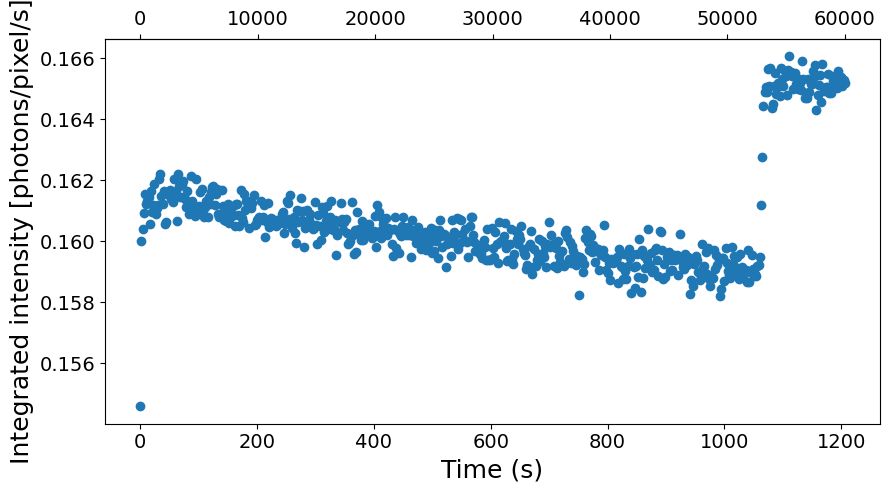

In [139]:
plt.figure(figsize=(10,5))
plt.scatter(It[0], It[1], label='It')
plt.xlabel('Time (s)')
plt.ylabel('Integrated intensity [photons/pixel/s]')
plt.gca().secondary_xaxis('top', functions=(lambda x: x/itime, lambda x: x*itime))
#plt.xlim(0, 3000)

### Linear correlation of damaged-vGeO2

In [140]:
G2t = XPCS.get_G2t(e4m_data, mask=None, Nfi=None, Nff=None, Lbin=None)

g2 = np.vstack(XPCS.get_g2(itime, G2t))
np.savetxt(f"{g24damaged_vGeO2_folder}g2-{sample_name}_{str(Ndataset).zfill(4)}_{str(Nscan).zfill(4)}-Q={Q_notebook}-dQ={dQ_notebook}.txt", g2)

Loading frames ...
Done! (elapsed time = 0.0 s)
Computing G2t (using MKL library)...
Done! (elapsed time = 9.29 s)
	 | 59999 X 59999 squared matrix
	 | memory usage (np.array @ float32) = 13.411 GB
Normalizing G2t (using NumExpr library)...
Done! (elapsed time = 1.62 s)

Computing g2 (using cython code)...
Done! (elapsed time = 2.83 s)



Using Global variables: model, params, Q_notebook, dQ_notebook, sample_name, Ndataset, Nscan


,Q,dQ,tau,dtau,dtau%,beta,dbeta,dbeta%,c,dc,dc%,y0,dy0,dy%,redchi2
0,0.21,0.01,0.246546,0.053604,21.742173,0.639954,0.074527,11.645683,0.026316,0.003051,11.593542,1.001457,0.000037,0.00372,1.050172


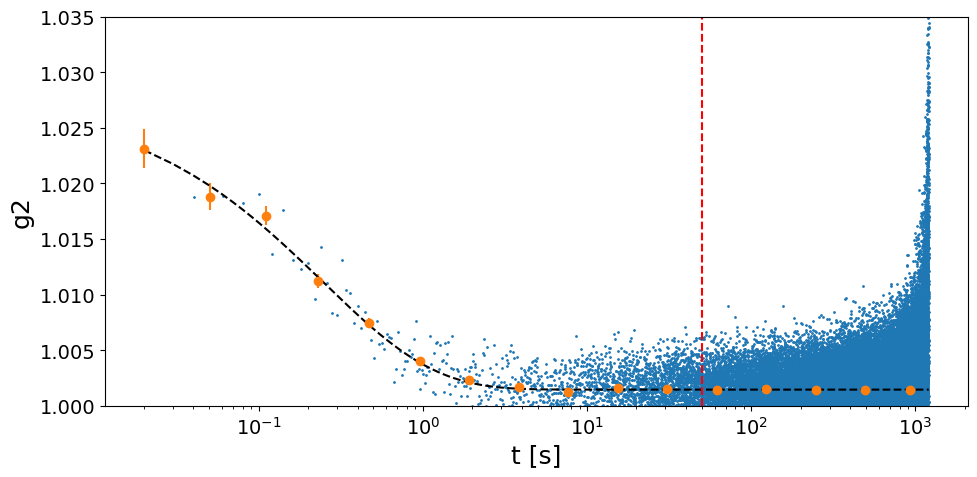

In [141]:
##################
t1_fit = None
t2_fit = 5e1
##################

################# KKW MODEL #################
model = lm.Model(decorrelation_f)
params = lm.Parameters()
params.add('tau', value=1, min=0, max=10)
params.add('beta', value=1, min=0, max=2)
params.add('c', value=.03, min=0, max=.1)
params.add('y0', value=1, min=1, max=1.01)
#params.add('y0', value=1.015, vary=False)
##############################################

plotfit_4damaged_vGeO2(itime, g2, t1_fit, t2_fit)

plt.ylim(1, 1.035)
plt.tight_layout(); plt.show()

## XPCS scan: T=730C, Q = 0.19, 7min @ 2ms (200000fm) (GeO2_6, dataset 1, scan 1) 

In [142]:
#######################################
sample_name = 'GeO2_6_730C'
Ndataset = 1
Nscan = 3
Nfi, Nff = 10, None
load_mask = e4m_mask * e4m_htmask * bs_mask * Qmask # Put None for profile analysis!
#######################################

scan = ID10.load_scan(RAW_folder, sample_name, Ndataset, Nscan)
Ei = scan['monoe']
itime = scan['fast_timer_period'][0]
theta = scan['delcoup']
Q = round(XPCS.theta2Q(Ei,  theta),2)

print('#############################')
print('command =', scan['command'])
print('Ei =', Ei)
print('itime =', itime)
print('theta =', theta)
print('Q =', Q)
print('T = {:.2f} min'.format(len(scan['fast_timer_period'])*itime/60))   
print('#############################\n')

e4m_data = ID10.load_sparse_e4m(RAW_folder, sample_name, Ndataset, Nscan, Nfi, Nff,  n_jobs=20, load_mask=load_mask)
e4m_data = COSMIC.fast_gamma_filter(e4m_data, Imaxth_high=4)

#############################
command = mtimescan 0.002 1 199804
Ei = 9.699998837562536
itime = 0.0021
theta = 1.7500000000000004
Q = 0.15
T = 6.99 min
#############################

Loading sparse array ...
	 -> loading file eiger4m_v2_sparse_frame_0_00000.h5 (1/40 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00001.h5 (2/40 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00002.h5 (3/40 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00003.h5 (4/40 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00004.h5 (5/40 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00005.h5 (6/40 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00006.h5 (7/40 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00007.h5 (8/40 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00008.h5 (9/40 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00009.h5 (10/40 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00010.h5 (11/40 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00011.h5 (12/40 loop

### Flux check

################################################################################
Maximum count in the whole run -> 4.0
# of pixels above Ith_high treshold ->  3929222 pixels (of 4471016 => 87.88 %)
# of pixels below Ith_low treshold ->  189642 pixels (of 4471016 => 4.24 %)
################################################################################



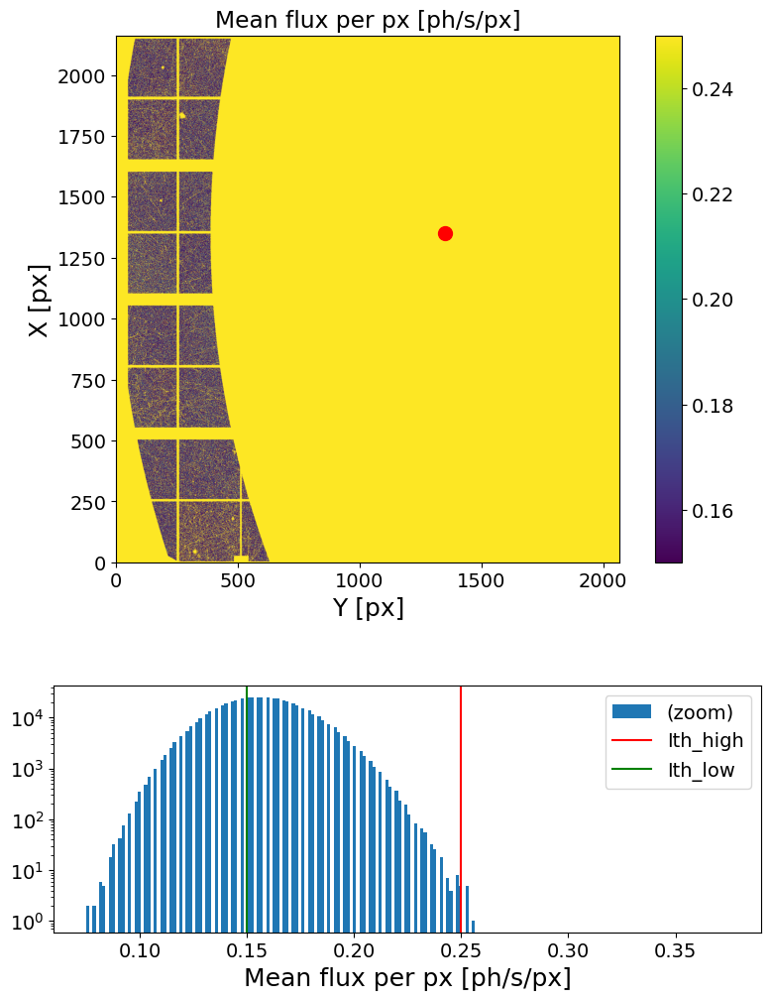

In [143]:
XPCS.gen_plots4mask(e4m_data, itime, Ith_low=.15, Ith_high=.25, Nff=None, load_mask=load_mask)

### Intensity analysis

In [144]:
####################
Lbin = 100
Nstep = 100
mask = None #e4m_mask*e4m_htmask*bs_mask*Qmask
####################

It = np.vstack(XPCS.get_It(e4m_data, itime, mask=mask, Lbin=Lbin, Nstep=Nstep))
np.savetxt(f"{Intensity_folder}Idt-{sample_name}_{str(Ndataset).zfill(4)}_{str(Nscan).zfill(4)}-Q={Q_notebook}-dQ={dQ_notebook}.txt", It)

<SecondaryAxis: >

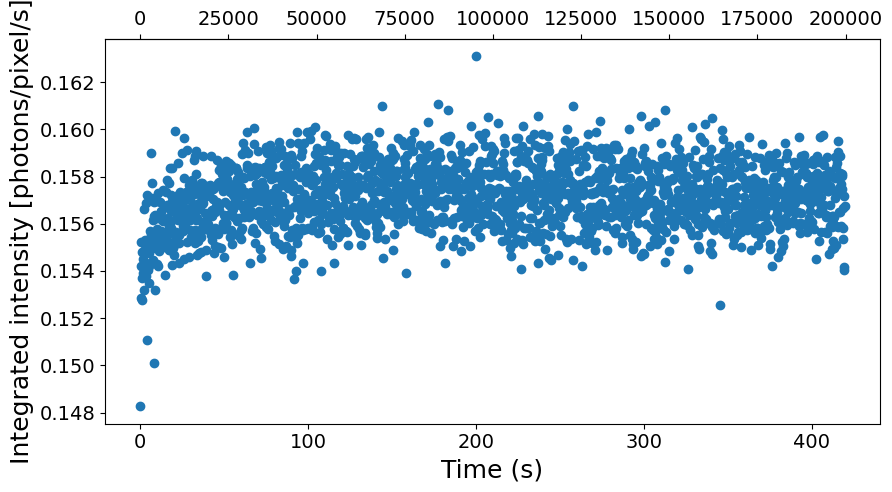

In [145]:
plt.figure(figsize=(10,5))
plt.scatter(It[0], It[1], label='It')
plt.xlabel('Time (s)')
plt.ylabel('Integrated intensity [photons/pixel/s]')
plt.gca().secondary_xaxis('top', functions=(lambda x: x/itime, lambda x: x*itime))
#plt.xlim(0, 3000)

### Linear correlation of damaged-vGeO2

In [146]:
G2t = XPCS.get_G2t(e4m_data, mask=None, Nfi=25000, Nff=None, Lbin=None)

g2 = np.vstack(XPCS.get_g2(itime, G2t))
np.savetxt(f"{g24damaged_vGeO2_folder}g2-{sample_name}_{str(Ndataset).zfill(4)}_{str(Nscan).zfill(4)}-Q={Q_notebook}-dQ={dQ_notebook}.txt", g2)

Loading frames ...
Done! (elapsed time = 0.51 s)
Computing G2t (using MKL library)...
Done! (elapsed time = 10.71 s)
	 | 174794 X 174794 squared matrix
	 | memory usage (np.array @ float32) = 113.819 GB
Normalizing G2t (using NumExpr library)...
Done! (elapsed time = 11.66 s)

Computing g2 (using cython code)...
Done! (elapsed time = 24.74 s)



Using Global variables: model, params, Q_notebook, dQ_notebook, sample_name, Ndataset, Nscan


,Q,dQ,tau,dtau,dtau%,beta,dbeta,dbeta%,c,dc,dc%,y0,dy0,dy%,redchi2
0,0.21,0.01,0.095743,0.03919,40.932143,0.854309,0.302768,35.440159,0.022961,0.005954,25.929679,1.001385,0.000151,0.015084,1.01499


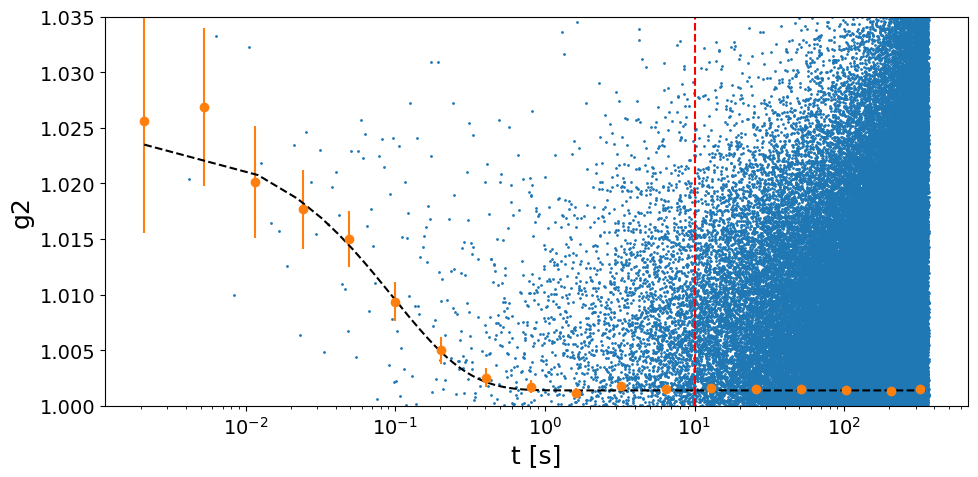

In [147]:
##################
t1_fit = None
t2_fit = 1e1
##################

################# KKW MODEL #################
model = lm.Model(decorrelation_f)
params = lm.Parameters()
params.add('tau', value=1, min=0, max=10)
params.add('beta', value=1, min=0, max=2)
params.add('c', value=.03, min=0, max=.1)
params.add('y0', value=1, min=1, max=1.01)
#params.add('y0', value=1.015, vary=False)
##############################################

plotfit_4damaged_vGeO2(itime, g2, t1_fit, t2_fit)

plt.ylim(1, 1.035)
plt.tight_layout(); plt.show()

##  XPCS scan: T=660C, Q=0.19, 7min @ 2ms (200000fm) (GeO2_6, dataset 2, scan 1) 

In [148]:
#######################################
sample_name = 'GeO2_6_660C'
Ndataset = 2
Nscan = 3
Nfi, Nff = 10, None
load_mask = e4m_mask * e4m_htmask * bs_mask * Qmask # Put None for profile analysis!
#######################################

scan = ID10.load_scan(RAW_folder, sample_name, Ndataset, Nscan)
Ei = scan['monoe']
itime = scan['fast_timer_period'][0]
theta = scan['delcoup']
Q = round(XPCS.theta2Q(Ei,  theta),2)

print('#############################')
print('command =', scan['command'])
print('Ei =', Ei)
print('itime =', itime)
print('theta =', theta)
print('Q =', Q)
print('T = {:.2f} min'.format(len(scan['fast_timer_period'])*itime/60))   
print('#############################\n')

e4m_data = ID10.load_sparse_e4m(RAW_folder, sample_name, Ndataset, Nscan, Nfi, Nff,  n_jobs=20, load_mask=load_mask)
e4m_data = COSMIC.fast_gamma_filter(e4m_data, Imaxth_high=4)

#############################
command = mtimescan 0.002 1 199804
Ei = 9.699998837562536
itime = 0.0021
theta = 1.7500000000000004
Q = 0.15
T = 6.99 min
#############################

Loading sparse array ...
	 -> loading file eiger4m_v2_sparse_frame_0_00000.h5 (1/40 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00001.h5 (2/40 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00002.h5 (3/40 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00003.h5 (4/40 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00004.h5 (5/40 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00005.h5 (6/40 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00006.h5 (7/40 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00007.h5 (8/40 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00008.h5 (9/40 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00009.h5 (10/40 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00010.h5 (11/40 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00011.h5 (12/40 loop

### Flux check

################################################################################
Maximum count in the whole run -> 3.0
# of pixels above Ith_high treshold ->  3929223 pixels (of 4471016 => 87.88 %)
# of pixels below Ith_low treshold ->  200494 pixels (of 4471016 => 4.48 %)
################################################################################



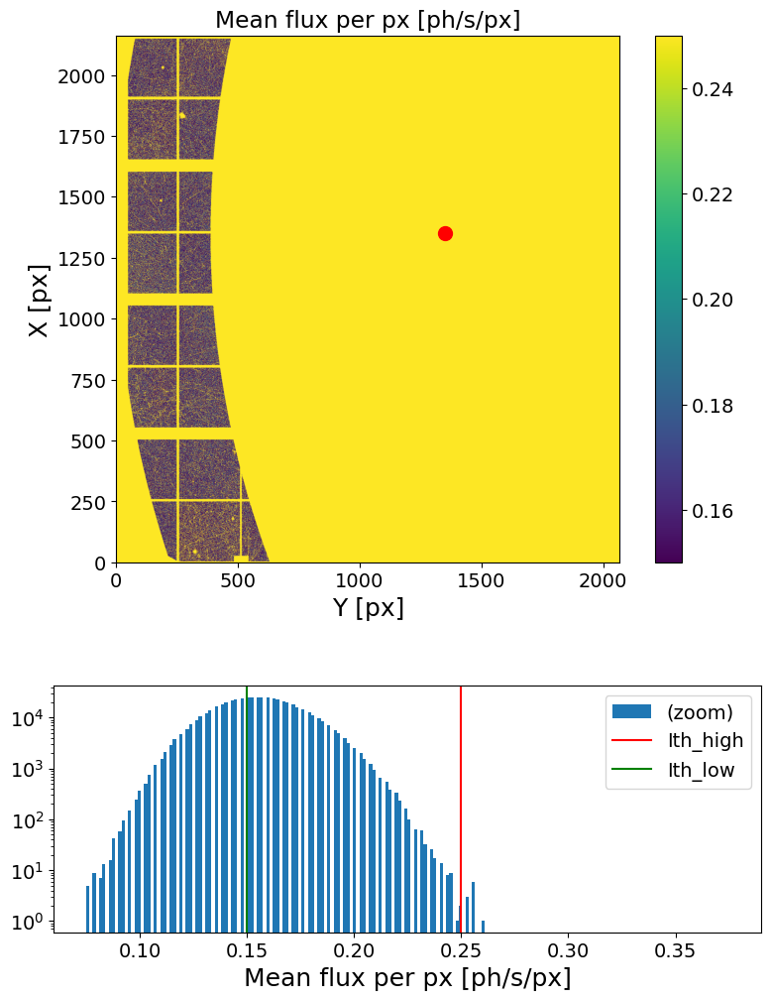

In [149]:
XPCS.gen_plots4mask(e4m_data, itime, Ith_low=.15, Ith_high=.25, Nff=None, load_mask=load_mask)

### Intensity analysis

In [150]:
####################
Lbin = 100
Nstep = 100
mask = None #e4m_mask*e4m_htmask*bs_mask*Qmask
####################

It = np.vstack(XPCS.get_It(e4m_data, itime, mask=mask, Lbin=Lbin, Nstep=Nstep))
np.savetxt(f"{Intensity_folder}Idt-{sample_name}_{str(Ndataset).zfill(4)}_{str(Nscan).zfill(4)}-Q={Q_notebook}-dQ={dQ_notebook}.txt", It)

<SecondaryAxis: >

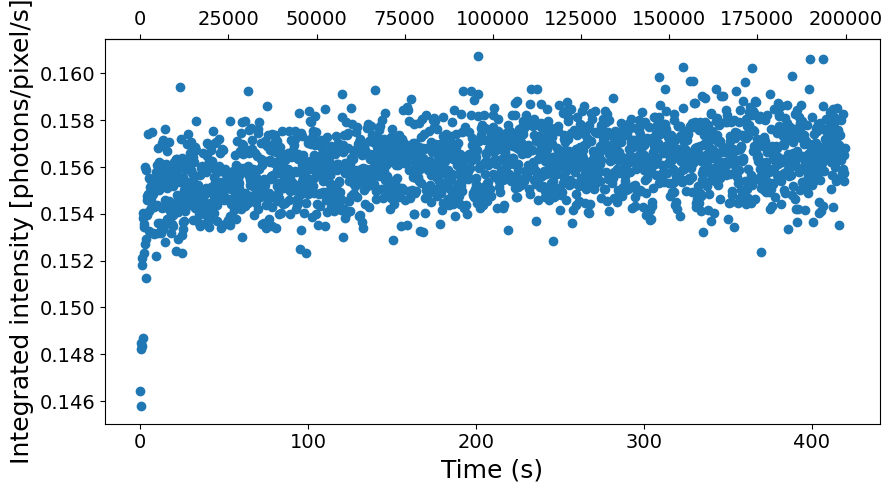

In [151]:
plt.figure(figsize=(10,5))
plt.scatter(It[0], It[1], label='It')
plt.xlabel('Time (s)')
plt.ylabel('Integrated intensity [photons/pixel/s]')
plt.gca().secondary_xaxis('top', functions=(lambda x: x/itime, lambda x: x*itime))
#plt.xlim(0, 3000)

### Linear correlation of damaged-vGeO2

In [152]:
G2t = XPCS.get_G2t(e4m_data, mask=None, Nfi=10000, Nff=None, Lbin=None)

g2 = np.vstack(XPCS.get_g2(itime, G2t))
np.savetxt(f"{g24damaged_vGeO2_folder}g2-{sample_name}_{str(Ndataset).zfill(4)}_{str(Nscan).zfill(4)}-Q={Q_notebook}-dQ={dQ_notebook}.txt", g2)

Loading frames ...
Done! (elapsed time = 0.36 s)
Computing G2t (using MKL library)...
Done! (elapsed time = 12.55 s)
	 | 189794 X 189794 squared matrix
	 | memory usage (np.array @ float32) = 134.192 GB
Normalizing G2t (using NumExpr library)...
Done! (elapsed time = 13.9 s)

Computing g2 (using cython code)...
Done! (elapsed time = 27.41 s)



Using Global variables: model, params, Q_notebook, dQ_notebook, sample_name, Ndataset, Nscan


,Q,dQ,tau,dtau,dtau%,beta,dbeta,dbeta%,c,dc,dc%,y0,dy0,dy%,redchi2
0,0.21,0.01,0.205818,0.087398,42.463692,0.548356,0.103515,18.877275,0.026124,0.005163,19.761361,1.001459,0.000068,0.006796,0.998433


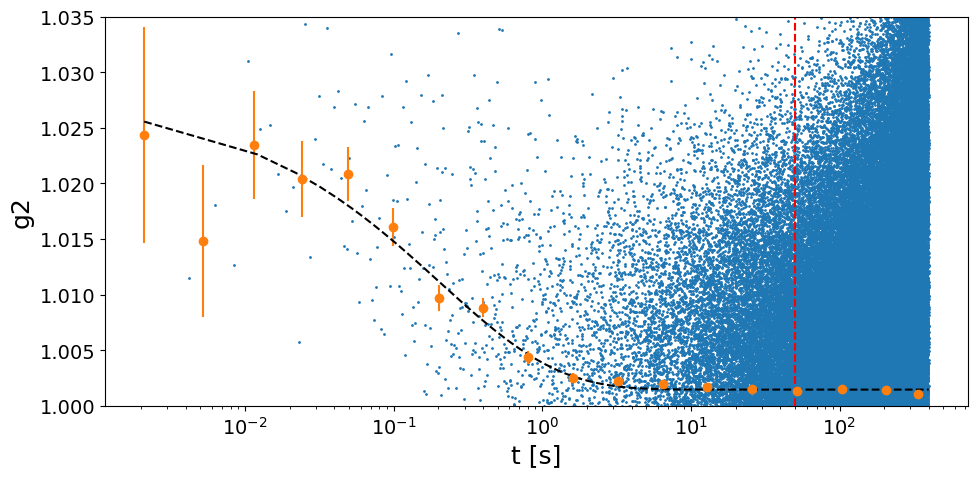

In [153]:
##################
t1_fit = None
t2_fit = 5e1
##################

################# KKW MODEL #################
model = lm.Model(decorrelation_f)
params = lm.Parameters()
params.add('tau', value=1, min=0, max=10)
params.add('beta', value=1, min=0, max=2)
params.add('c', value=.03, min=0, max=.1)
params.add('y0', value=1, min=1, max=1.01)
#params.add('y0', value=1.015, vary=False)
##############################################

plotfit_4damaged_vGeO2(itime, g2, t1_fit, t2_fit)

plt.ylim(1, 1.035)
plt.tight_layout(); plt.show()

## XPCS scan: T=590C, Q=0.19, 7min @ 2ms (200000fm) (GeO2_6, dataset 2, scan 1) 

In [154]:
#######################################
sample_name = 'GeO2_6_590C'
Ndataset = 2
Nscan = 3
Nfi, Nff = 10, None
load_mask = e4m_mask * e4m_htmask * bs_mask * Qmask # Put None for profile analysis!
#######################################

scan = ID10.load_scan(RAW_folder, sample_name, Ndataset, Nscan)
Ei = scan['monoe']
itime = scan['fast_timer_period'][0]
theta = scan['delcoup']
Q = round(XPCS.theta2Q(Ei,  theta),2)

print('#############################')
print('command =', scan['command'])
print('Ei =', Ei)
print('itime =', itime)
print('theta =', theta)
print('Q =', Q)
print('T = {:.2f} min'.format(len(scan['fast_timer_period'])*itime/60))   
print('#############################\n')

e4m_data = ID10.load_sparse_e4m(RAW_folder, sample_name, Ndataset, Nscan, Nfi, Nff,  n_jobs=20, load_mask=load_mask)
e4m_data = COSMIC.fast_gamma_filter(e4m_data, Imaxth_high=4)

#############################
command = mtimescan 0.002 1 199804
Ei = 9.699998837562536
itime = 0.0021
theta = 1.7500000000000004
Q = 0.15
T = 6.99 min
#############################

Loading sparse array ...
	 -> loading file eiger4m_v2_sparse_frame_0_00000.h5 (1/40 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00001.h5 (2/40 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00002.h5 (3/40 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00003.h5 (4/40 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00004.h5 (5/40 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00005.h5 (6/40 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00006.h5 (7/40 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00007.h5 (8/40 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00008.h5 (9/40 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00009.h5 (10/40 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00010.h5 (11/40 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00011.h5 (12/40 loop

### Flux check

################################################################################
Maximum count in the whole run -> 3.0
# of pixels above Ith_high treshold ->  3929215 pixels (of 4471016 => 87.88 %)
# of pixels below Ith_low treshold ->  211113 pixels (of 4471016 => 4.72 %)
################################################################################



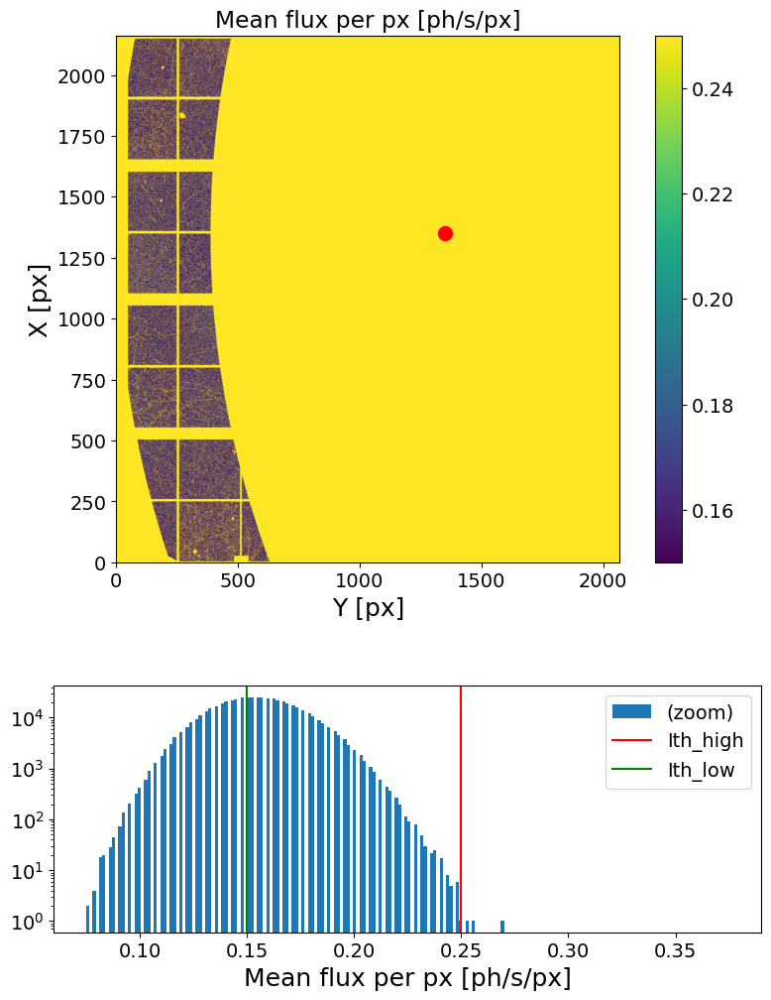

In [155]:
XPCS.gen_plots4mask(e4m_data, itime, Ith_low=.15, Ith_high=.25, Nff=None, load_mask=load_mask)

### Intensity analysis

In [156]:
####################
Lbin = 100
Nstep = 100
mask = None #e4m_mask*e4m_htmask*bs_mask*Qmask
####################

It = np.vstack(XPCS.get_It(e4m_data, itime, mask=mask, Lbin=Lbin, Nstep=Nstep))
np.savetxt(f"{Intensity_folder}Idt-{sample_name}_{str(Ndataset).zfill(4)}_{str(Nscan).zfill(4)}-Q={Q_notebook}-dQ={dQ_notebook}.txt", It)

<SecondaryAxis: >

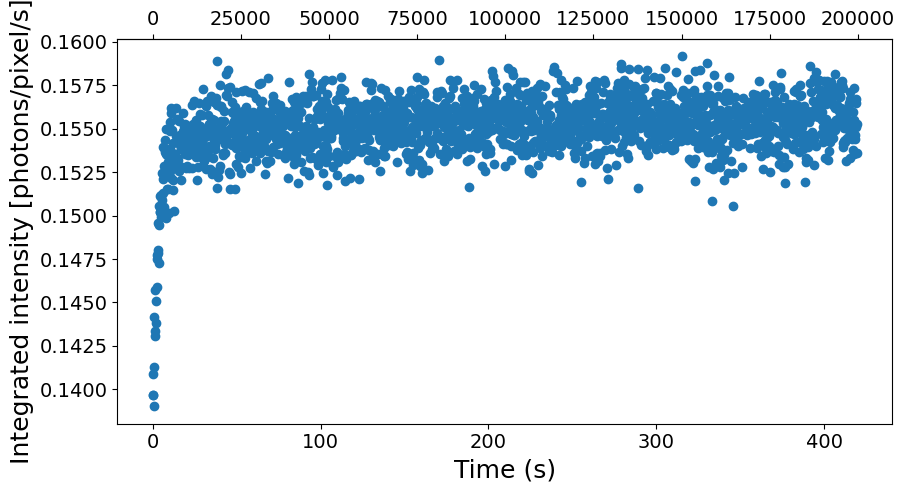

In [157]:
plt.figure(figsize=(10,5))
plt.scatter(It[0], It[1], label='It')
plt.xlabel('Time (s)')
plt.ylabel('Integrated intensity [photons/pixel/s]')
plt.gca().secondary_xaxis('top', functions=(lambda x: x/itime, lambda x: x*itime))
#plt.xlim(0, 3000)

### Linear correlation of damaged-vGeO2

In [158]:
G2t = XPCS.get_G2t(e4m_data, mask=None, Nfi=10000, Nff=None, Lbin=None)

g2 = np.vstack(XPCS.get_g2(itime, G2t))
np.savetxt(f"{g24damaged_vGeO2_folder}g2-{sample_name}_{str(Ndataset).zfill(4)}_{str(Nscan).zfill(4)}-Q={Q_notebook}-dQ={dQ_notebook}.txt", g2)

Loading frames ...
Done! (elapsed time = 0.59 s)
Computing G2t (using MKL library)...
Done! (elapsed time = 12.61 s)
	 | 189794 X 189794 squared matrix
	 | memory usage (np.array @ float32) = 134.192 GB
Normalizing G2t (using NumExpr library)...
Done! (elapsed time = 13.87 s)

Computing g2 (using cython code)...
Done! (elapsed time = 28.4 s)



Using Global variables: model, params, Q_notebook, dQ_notebook, sample_name, Ndataset, Nscan


,Q,dQ,tau,dtau,dtau%,beta,dbeta,dbeta%,c,dc,dc%,y0,dy0,dy%,redchi2
0,0.21,0.01,0.314821,0.096757,30.73406,0.505386,0.060628,11.996343,0.032015,0.004323,13.50405,1.001333,0.000032,0.003212,0.997343


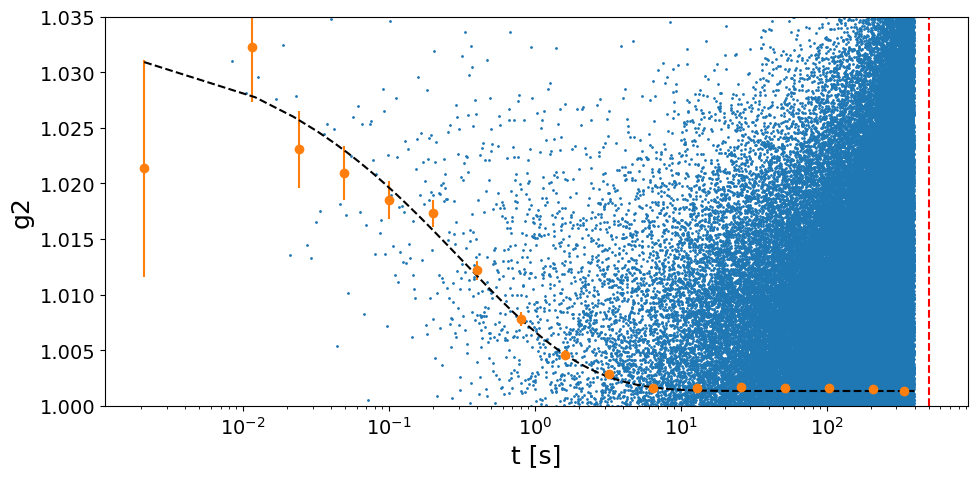

In [159]:
##################
t1_fit = None
t2_fit = 5e2
##################

################# KKW MODEL #################
model = lm.Model(decorrelation_f)
params = lm.Parameters()
params.add('tau', value=1, min=0, max=10)
params.add('beta', value=1, min=0, max=2)
params.add('c', value=.03, min=0, max=.1)
params.add('y0', value=1, min=1, max=1.01)
#params.add('y0', value=1.015, vary=False)
##############################################

plotfit_4damaged_vGeO2(itime, g2, t1_fit, t2_fit)

plt.ylim(1, 1.035)
plt.tight_layout(); plt.show()